# Ruoss/Ward Single-cell RNA Seq (scRNASeq) Analysis - Finding MSCs in BMAC samples (removed JTW01 and JTW02)

* Art Nasamran, UCSD, CCBB
* September 2018

This analysis notebook is heavily based on the Satija Lab tutorial, ["Seurat - Guided Clustering Tutorial"](https://satijalab.org/seurat/pbmc3k_tutorial.html). Prior to this notebook, the scRNASeq data were aligned, counted, and aggregated using [Cell Ranger v.2.2.0 (10X Genomics) software.](https://support.10xgenomics.com/single-cell-gene-expression/software/pipelines/latest/what-is-cell-ranger)

In [288]:
# Save workspace for quick loading 2/20/19
#save.image(file = "20190220_bmac_only_workspace.RData")

In [3]:
load("20190220_bmac_only_workspace.RData")

ERROR: Error: cannot allocate vector of size 1.1 Gb


## Create a count matrix
Prior to running this notebook, use the cellranger aggr function to combine samples into a count matrix. The following command was used to create the count matrix:
* NOTE: JTW04 and JTW09 were excluded due to poor quality measurements
    * Low fraction reads confidently mapped to transcriptome
    * Low RNA read Q30 fraction
    * Low fraction reads in cells
* Removed JTW01 to see if any cells match the MSC profiles defined by 4 publications

aggr csv for all, "all_samples.csv"

    library_id,molecule_h5
    JTW02,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW02/outs/molecule_info.h5
    JTW03,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW03/outs/molecule_info.h5
    JTW05,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW05/outs/molecule_info.h5
    JTW06,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW06/outs/molecule_info.h5
    JTW07,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW07/outs/molecule_info.h5
    JTW08,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW08/outs/molecule_info.h5
    JTW10,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW10/outs/molecule_info.h5
    MG01,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/MG01/outs/molecule_info.h5
    MG02,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/MG02/outs/molecule_info.h5
    MG03,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/MG03/outs/molecule_info.h5    

In [ ]:
# The following commands were run using a shell script. 
# They can also be run in this notebook using a python kernel.
cellranger=/mnt/data1/art/software/CellRanger/cellranger-2.2.0/cellranger

In [ ]:
# BMAC samples
!cd /mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results
!$cellranger aggr --id=bmac \
                  --csv=bmac_samples.csv \
                  --normalize=none \
                  --localmem 16
# END Python kernel usage. Switch back to R for the remainder of the notebook.

## Quality Control

In [ ]:
# All
IRdisplay::display_html('<iframe src="bmac_web_summary.html" width=1000, height=1000></iframe> ')

# Load Seurat objects
* Load count matrices from Cell Ranger
* Select genes for the alignment procedure. The tutorial chooses the union of the top 1,000 genes with the highest dispersion (variance/mean) from both datasets.

In [ ]:
#install.packages('remotes')
#remotes::install_github("UCSF-TI/fake-hdf5r")

In [ ]:
#install.packages("Seurat")
library(Seurat)

In [56]:
# Load cellranger object
cells.data <- Read10X(data.dir = "/home/ec2-user/art/ruoss/bmac/outs/filtered_gene_bc_matrices_mex/GRCh38/")

In [57]:
dim(cells.data)
sum(cells.data)

[1] 33694 13523

[1] 75889976

In [ ]:
# ?FilterCells
# ?ScaleData

# Cell QC and filtering

[Ilicic et al. Classification of low quality cells from single-cell RNA-seq data, Genome Biology 2016](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-016-0888-1)
* **Remove JTW02 cells**
* Find and remove low quality cells prior to downstream analysis
* High proportions of mitochondrial genes are indicative of low quality cells (Ilicic et al 2016). 

In [58]:
head(cells.data)

   [[ suppressing 13523 column names ‘AAACGGGCAACAACCT-1’, ‘AAACGGGTCACGCATA-1’, ‘AAAGTAGAGATATACG-1’ ... ]]


6 x 13523 sparse Matrix of class "dgTMatrix"
                                                                               
RP11-34P13.3  . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
FAM138A       . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
OR4F5         . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
RP11-34P13.7  . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
RP11-34P13.8  . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
RP11-34P13.14 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
                                                                               
RP11-34P13.3  . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
FAM138A       . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
OR4F5         . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
RP11-34P13.7  . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .

In [59]:
# JTW02 = any cell name that ends in "-1"
JTW02.idx <- grepl("*-1$", colnames(cells.data))
head(JTW02.idx)
length(JTW02.idx)
cells.data <- cells.data[ ,!(JTW02.idx)]
dim(cells.data)

[1] TRUE TRUE TRUE TRUE TRUE TRUE

[1] 13523

[1] 33694 12850

In [60]:
12850 * 0.001 # 0.1% of cells

[1] 12.85

In [61]:
# Parameters
# min.cells - include genes with detected expression in at least this many cells (~0.1% of the data)
# FilterCells - keep cells that have >200 genes
# NormalizeData - log-normalization
# ScaleData - scales and centers genes in the dataset
#           - removes unwanted sources of variation by creating linear models to predict gene expression

cells <- CreateSeuratObject(raw.data = cells.data, project = "bmac", min.cells = 13, min.genes = 200) 

### Add sample information to metadata

In [62]:
samples <- read.csv(file.path("/home/ec2-user/art/ruoss/bmac/outs", "aggregation_csv.csv"), stringsAsFactors = F)

In [63]:
samples$libcodes <- c(1:nrow(samples))

In [64]:
samples

library_id,molecule_h5,libcodes
JTW02,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW02/outs/molecule_info.h5,1
JTW03,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW03/outs/molecule_info.h5,2
JTW05,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW05/outs/molecule_info.h5,3
JTW06,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW06/outs/molecule_info.h5,4
JTW07,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW07/outs/molecule_info.h5,5
JTW08,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW08/outs/molecule_info.h5,6
JTW10,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW10/outs/molecule_info.h5,7
MG01,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/MG01/outs/molecule_info.h5,8
MG02,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/MG02/outs/molecule_info.h5,9
MG03,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/MG03/outs/molecule_info.h5,10


In [65]:
# remove JTW02
samples <- samples[2:nrow(samples),]
head(samples)

,library_id,molecule_h5,libcodes
2,JTW03,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW03/outs/molecule_info.h5,2
3,JTW05,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW05/outs/molecule_info.h5,3
4,JTW06,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW06/outs/molecule_info.h5,4
5,JTW07,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW07/outs/molecule_info.h5,5
6,JTW08,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW08/outs/molecule_info.h5,6
7,JTW10,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW10/outs/molecule_info.h5,7


In [66]:
cellcodes <- as.data.frame(cells@raw.data@Dimnames[[2]])
colnames(cellcodes) <- "barcodes"
rownames(cellcodes) <- cellcodes$barcodes
cellcodes$libcodes <- as.numeric(gsub(pattern=".+-", replacement="", cellcodes$barcodes))

In [67]:
require(dplyr)
tmp <- left_join(cellcodes, samples, by = "libcodes")
dim(tmp)
head(tmp)

Loading required package: dplyr

Attaching package: ‘dplyr’

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



[1] 11450     4

barcodes,libcodes,library_id,molecule_h5
AAACCTGCACCCATGG-2,2,JTW03,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW03/outs/molecule_info.h5
AAACCTGCAGGGTTAG-2,2,JTW03,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW03/outs/molecule_info.h5
AAACCTGGTGCTCTTC-2,2,JTW03,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW03/outs/molecule_info.h5
AAACCTGGTGGCTCCA-2,2,JTW03,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW03/outs/molecule_info.h5
AAACCTGGTGTGGCTC-2,2,JTW03,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW03/outs/molecule_info.h5
AAACCTGTCACCGGGT-2,2,JTW03,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW03/outs/molecule_info.h5


In [68]:
rownames(tmp) <- tmp$barcodes

In [69]:
tmp <- tmp["library_id"]

In [70]:
cells <- AddMetaData(object = cells, metadata = tmp, col.name = "library_id")

In [71]:
head(cells@meta.data)

,nGene,nUMI,orig.ident,library_id
AAACCTGCACCCATGG-2,1034,4919,bmac,JTW03
AAACCTGCAGGGTTAG-2,899,3459,bmac,JTW03
AAACCTGGTGCTCTTC-2,1263,4938,bmac,JTW03
AAACCTGGTGGCTCCA-2,1255,3066,bmac,JTW03
AAACCTGGTGTGGCTC-2,421,4362,bmac,JTW03
AAACCTGTCACCGGGT-2,1316,4441,bmac,JTW03


In [72]:
table(cells@meta.data$library_id)


JTW03 JTW05 JTW06 JTW07 JTW08 JTW10  MG01  MG02  MG03 
 1046  1769  1174   800   604  1183  1953  1732  1189 

In [73]:
# Mitochondrial genes
cells.mito.genes <- grep(pattern = "^MT-", x = rownames(x = cells@data), value = TRUE)
cells.percent.mito <- Matrix::colSums(cells@raw.data[cells.mito.genes, ])/Matrix::colSums(cells@raw.data)
cells <- AddMetaData(object = cells, metadata = cells.percent.mito, col.name = "percent.mito")

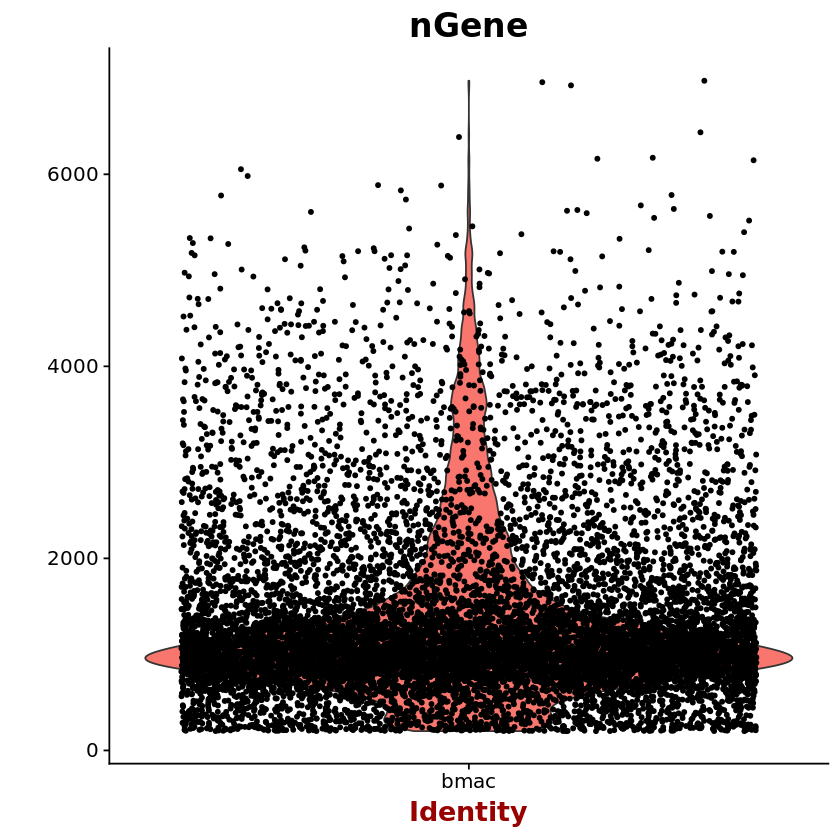

In [74]:
# QC
VlnPlot(object = cells, features.plot = "nGene")

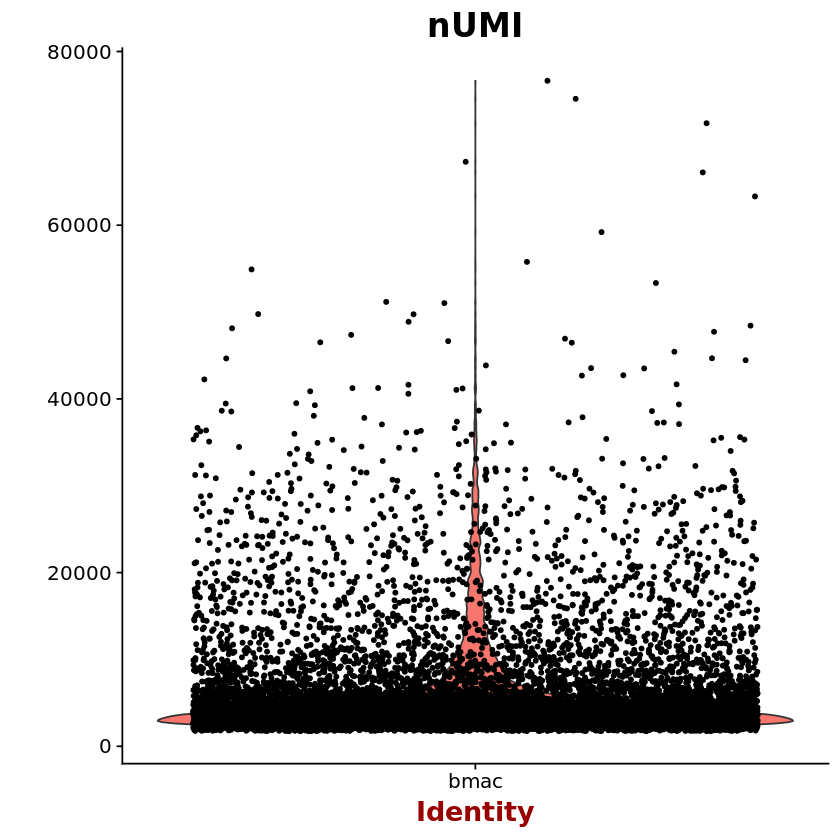

In [75]:
VlnPlot(object = cells, features.plot = "nUMI")

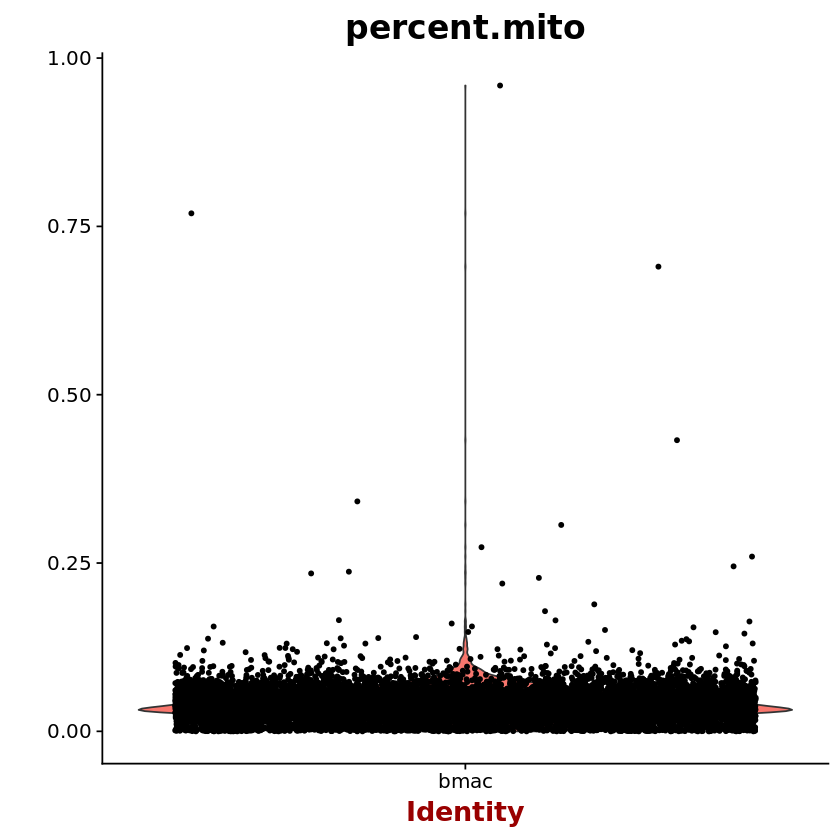

In [76]:
VlnPlot(object = cells, features.plot = "percent.mito")

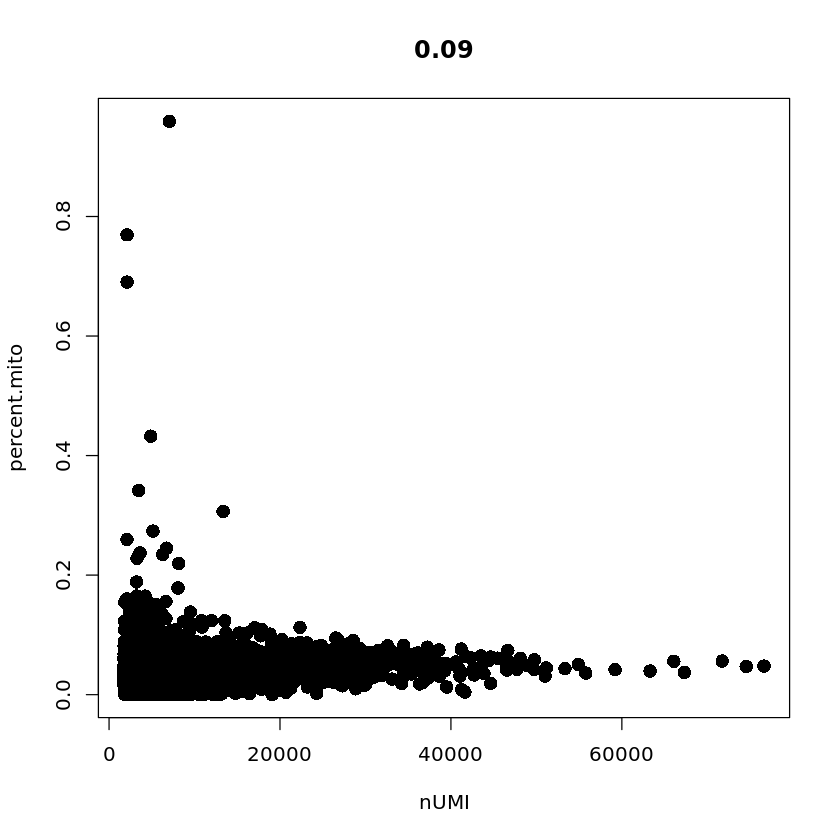

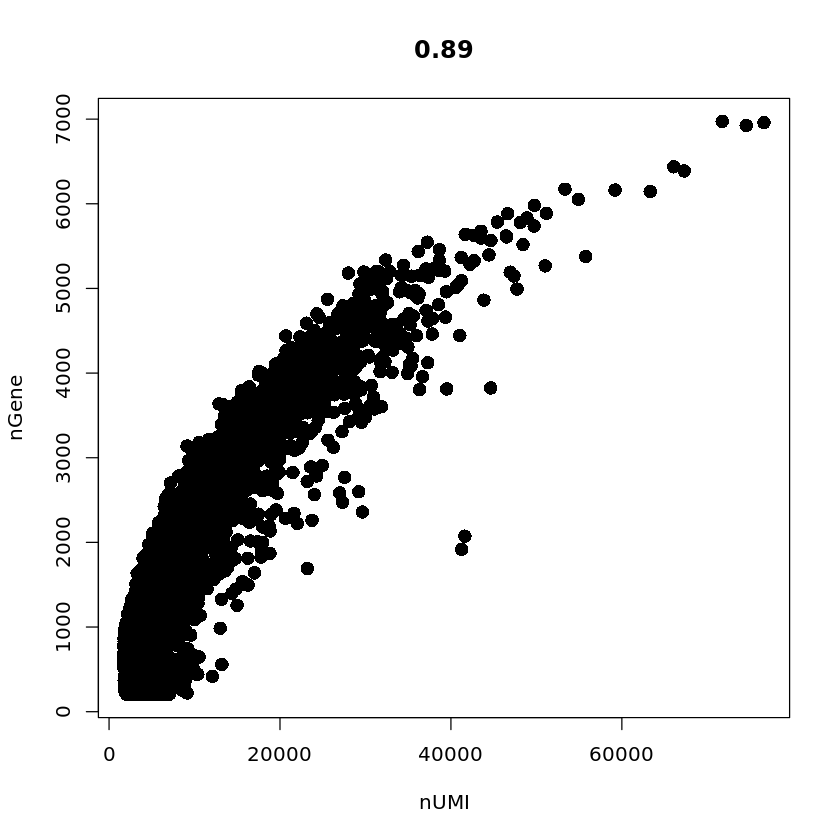

In [77]:
GenePlot(object = cells, gene1 = "nUMI", gene2 = "percent.mito")
GenePlot(object = cells, gene1 = "nUMI", gene2 = "nGene")

BMAC cells
* Filter out cells that have unique gene counts of less than 750
* Filter percent.mito > 0.15

In [29]:
cells <- FilterCells(cells, 
                     subset.names = c("nGene", "percent.mito"), 
                     low.thresholds = c(750, -Inf), 
                     high.thresholds = c(Inf, 0.15))
# Filter by nGene only
# cells <- FilterCells(cells, subset.names = "nGene", low.thresholds = 40, high.thresholds = Inf)

# Normalization

In [30]:
cells <- NormalizeData(cells, normalization.method = "LogNormalize")

# Detection of variable genes across the single cells
"Seurat calculates highly variable genes and focuses on these for downstream analysis. FindVariableGenes calculates the average expression and dispersion for each gene, places these genes into bins, and then calculates a z-score for dispersion within each bin. This helps control for the relationship between variability and average expression. This function is unchanged from (Macosko et al.), but new methods for variable gene expression identification are coming soon. We suggest that users set these parameters to mark visual outliers on the dispersion plot, but the exact parameter settings may vary based on the data type, heterogeneity in the sample, and normalization strategy. The parameters here identify ~2,000 variable genes, and represent typical parameter settings for UMI data that is normalized to a total of 1e4 molecules." (Satija Lab)

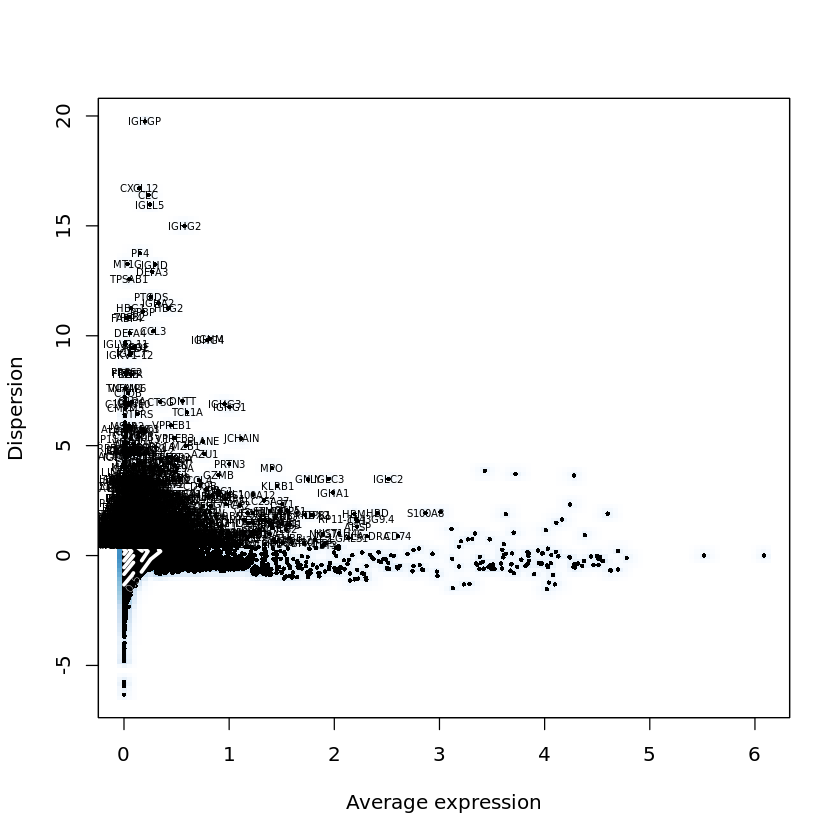

In [31]:
cells <- FindVariableGenes(object = cells, mean.function = ExpMean, dispersion.function = LogVMR, 
    x.low.cutoff = 0.0125, x.high.cutoff = 3, y.cutoff = 0.5)

In [32]:
length(cells@var.genes)

[1] 1989

# Scaling the data and removing unwanted sources of variation
"Your single cell dataset likely contains ‘uninteresting’ sources of variation. This could include not only technical noise, but batch effects, or even biological sources of variation (cell cycle stage). As suggested in Buettner et al, NBT, 2015, regressing these signals out of the analysis can improve downstream dimensionality reduction and clustering. To mitigate the effect of these signals, Seurat constructs linear models to predict gene expression based on user-defined variables. The scaled z-scored residuals of these models are stored in the scale.data slot, and are used for dimensionality reduction and clustering.

We can regress out cell-cell variation in gene expression driven by batch (if applicable), cell alignment rate (as provided by Drop-seq tools for Drop-seq data), the number of detected molecules, and mitochondrial gene expression. For cycling cells, we can also learn a ‘cell-cycle’ score (see example here) and regress this out as well. In this simple example here for post-mitotic blood cells, we regress on the number of detected molecules per cell as well as the percentage mitochondrial gene content.

Seurat v2.0 implements this regression as part of the data scaling process. Therefore, the RegressOut function has been deprecated, and replaced with the vars.to.regress argument in ScaleData." (Satija Lab)

In [33]:
cells <- ScaleData(object = cells, vars.to.regress = c("nUMI", "percent.mito"), do.par = TRUE, num.cores = 3)

Regressing out: nUMI, percent.mito



Time Elapsed:  51.5004901885986 secs

Scaling data matrix


In [34]:
cells

An object of class seurat in project bmac 
 16222 genes across 9301 samples.

# Perform linear dimensional reduction
* PCA on the scaled data and variable genes of interest

In [35]:
cells <- RunPCA(object = cells, 
                pc.genes = cells@var.genes, 
                do.print = TRUE, 
                pcs.print = 1:5,
                genes.print = 5)

[1] "PC1"
[1] "CST3" "FCN1" "CSTA" "LST1" "MNDA"
[1] ""
[1] "IL32" "CD3D" "TRAC" "IL7R" "GYPC"
[1] ""
[1] ""
[1] "PC2"
[1] "IL32" "CD7"  "NKG7" "CCL5" "CD3D"
[1] ""
[1] "GYPA" "AHSP" "CA2"  "GYPB" "HBD" 
[1] ""
[1] ""
[1] "PC3"
[1] "TCF4"    "SPIB"    "MZB1"    "FAM129C" "CD79A"  
[1] ""
[1] "GIMAP4"  "S100A10" "IL32"    "CD3D"    "FCN1"   
[1] ""
[1] ""
[1] "PC4"
[1] "GZMB"  "NKG7"  "CLIC3" "KLRD1" "GNLY" 
[1] ""
[1] "CCR7"   "LEF1"   "MYC"    "CD27"   "PRSS57"
[1] ""
[1] ""
[1] "PC5"
[1] "IGLL1"  "IGFBP7" "STMN1"  "PRSS57" "VPREB1"
[1] ""
[1] "LILRA4"   "SERPINF1" "SCT"      "UGCG"     "CLEC4C"  
[1] ""
[1] ""


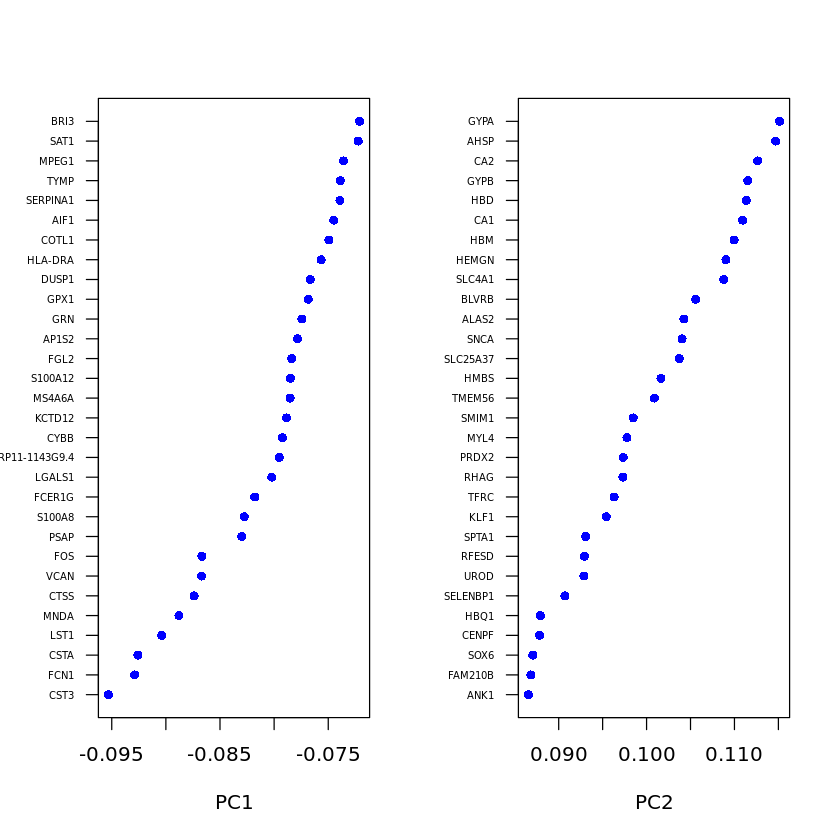

In [36]:
# Visualize results of PCA
VizPCA(object = cells, pcs.use = 1:2)

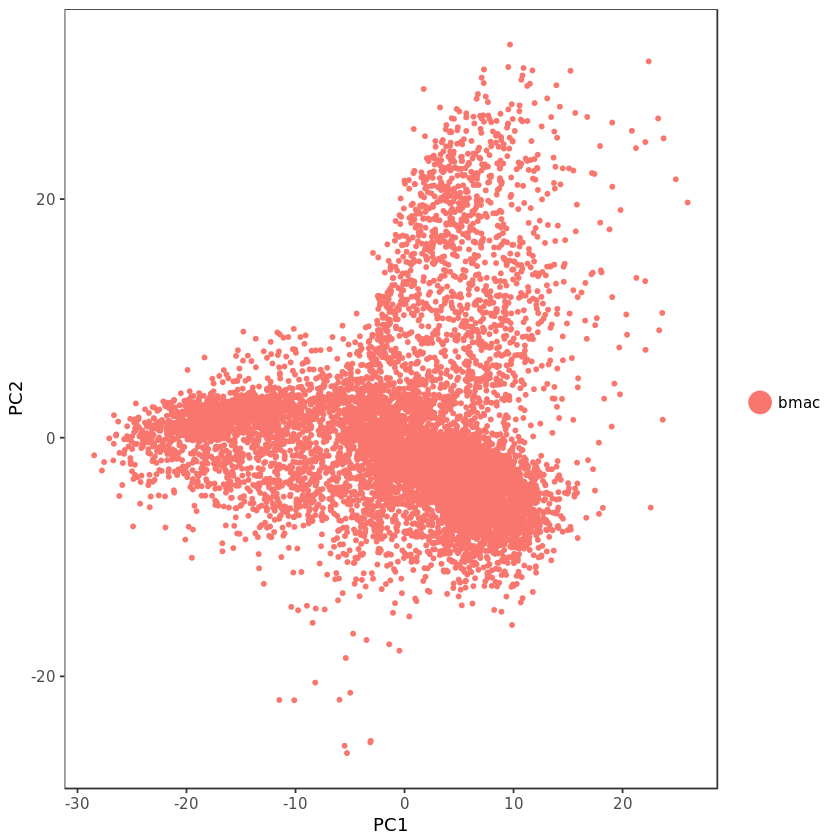

In [37]:
PCAPlot(object = cells, dim.1 = 1, dim.2 = 2)

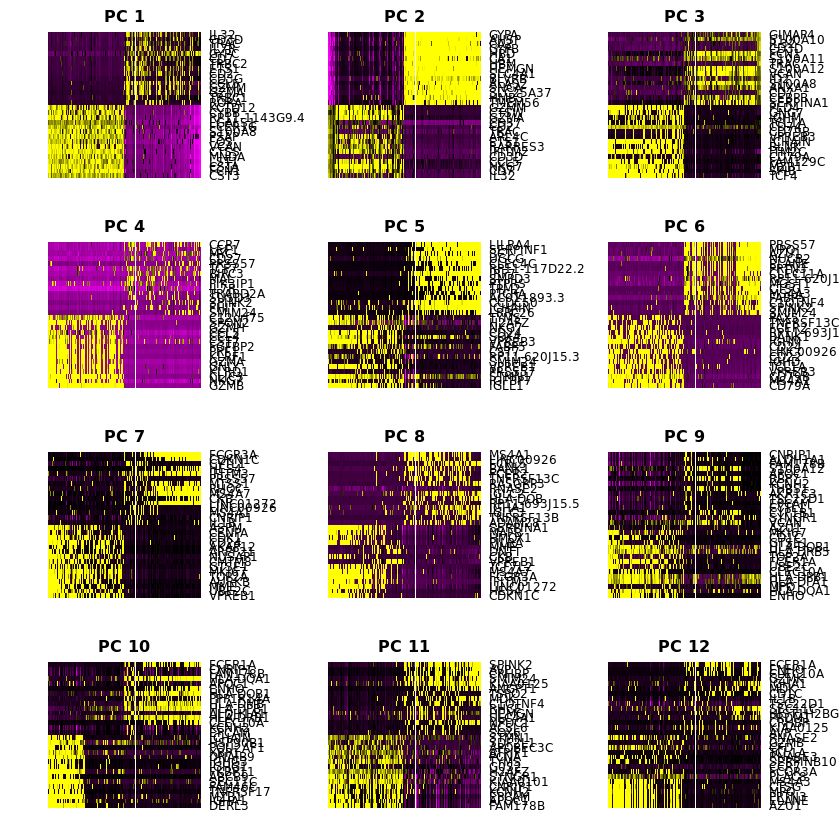

In [38]:
PCHeatmap(object = cells, 
          pc.use = 1:12, 
          cells.use = 500, 
          do.balanced = TRUE, 
          label.columns = FALSE, 
          use.full = FALSE)

## Determine statistically significant principal components
"To overcome the extensive technical noise in any single gene for scRNA-seq data, Seurat clusters cells based on their PCA scores, with each PC essentially representing a ‘metagene’ that combines information across a correlated gene set. Determining how many PCs to include downstream is therefore an important step.

In Macosko et al, we implemented a resampling test inspired by the jackStraw procedure. We randomly permute a subset of the data (1% by default) and rerun PCA, constructing a ‘null distribution’ of gene scores, and repeat this procedure. We identify ‘significant’ PCs as those who have a strong enrichment of low p-value genes." (Satija Lab)

### JackStraw plot

In [ ]:
# Computationally intensive
#cells <- JackStraw(object = cells, num.replicate = 100, display.progress = FALSE)

In [ ]:
#JackStrawPlot(object = cells, PCs = 1:20)

### Elbow plot
"PC selection – identifying the true dimensionality of a dataset – is an important step for Seurat, but can be challenging/uncertain for the user. We therefore suggest these three approaches to consider. The first is more supervised, exploring PCs to determine relevant sources of heterogeneity, and could be used in conjunction with GSEA for example. The second implements a statistical test based on a random null model, but is time-consuming for large datasets, and may not return a clear PC cutoff. The third is a heuristic that is commonly used, and can be calculated instantly. In this example, all three approaches yielded similar results, but we might have been justified in choosing anything between PC 7-10 as a cutoff. We followed the jackStraw here, admittedly buoyed by seeing the PCHeatmap returning interpretable signals (including canonical dendritic cell markers) throughout these PCs. Though the results are only subtly affected by small shifts in this cutoff (you can test below), we strongly suggest always explore the PCs they choose to include downstream." (Satija Lab)

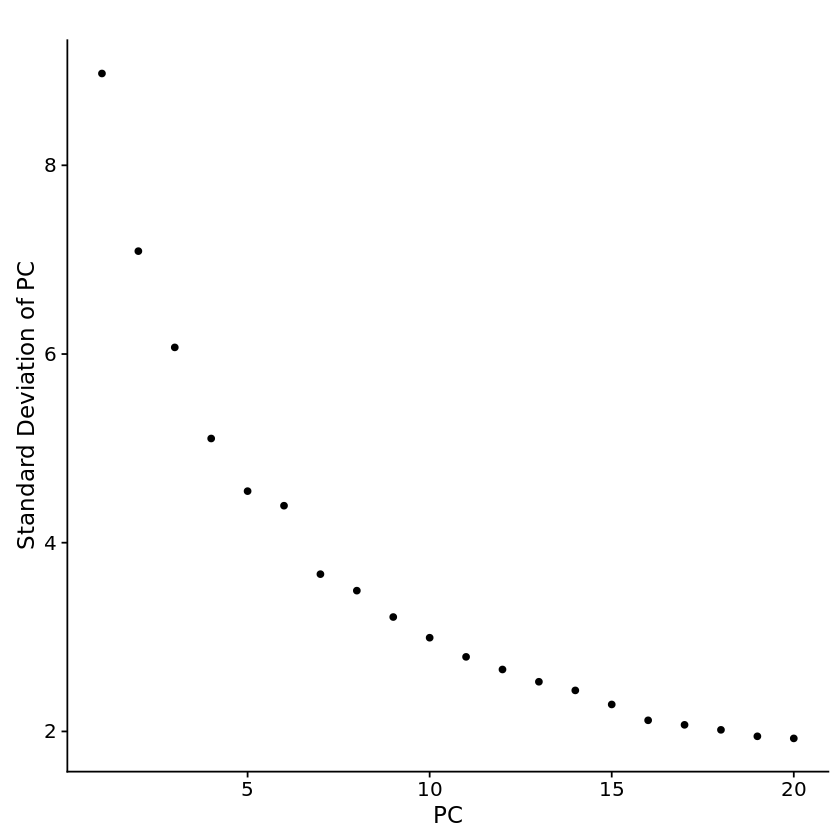

In [39]:
PCElbowPlot(object = cells)

# Cluster the cells
"Seurat now includes an graph-based clustering approach compared to (Macosko et al.). Importantly, the distance metric which drives the clustering analysis (based on previously identified PCs) remains the same. However, our approach to partioning the cellular distance matrix into clusters has dramatically improved. Our approach was heavily inspired by recent manuscripts which applied graph-based clustering approaches to scRNA-seq data [SNN-Cliq, Xu and Su, Bioinformatics, 2015] and CyTOF data [PhenoGraph, Levine et al., Cell, 2015]. Briefly, these methods embed cells in a graph structure - for example a K-nearest neighbor (KNN) graph, with edges drawn between cells with similar gene expression patterns, and then attempt to partition this graph into highly interconnected ‘quasi-cliques’ or ‘communities’. As in PhenoGraph, we first construct a KNN graph based on the euclidean distance in PCA space, and refine the edge weights between any two cells based on the shared overlap in their local neighborhoods (Jaccard similarity). To cluster the cells, we apply modularity optimization techniques such as the Louvain algorithm (default) or SLM [SLM, Blondel et al., Journal of Statistical Mechanics], to iteratively group cells together, with the goal of optimizing the standard modularity function.

The FindClusters function implements the procedure, and contains a resolution parameter that sets the ‘granularity’ of the downstream clustering, with increased values leading to a greater number of clusters. We find that setting this parameter between 0.6-1.2 typically returns good results for single cell datasets of around 3K cells. Optimal resolution often increases for larger datasets. The clusters are saved in the object@ident slot." (Satija Lab)


In [40]:
# Set seed for reproducibility
seed <- 7

cells <- FindClusters(object = cells, 
                      reduction.type = "pca", 
                      dims.use = 1:16, 
                      resolution = c(0.5, 0.6, 0.8, 1.0, 1.5),
                      #resolution = 0.6, 
                      print.output = 0, 
                      save.SNN = TRUE,
                      random.seed = seed)

In [41]:
# Compare the numbers of clusters for each resolution
head(cells@meta.data)
sapply(grep("^res",colnames(cells@meta.data),value = TRUE),
       function(x) length(unique(cells@meta.data[,x])))

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5
AAACCTGCACCCATGG-2,1034,4919,bmac,JTW03,0.02359162,1,1,1,1,5
AAACCTGCAGGGTTAG-2,899,3459,bmac,JTW03,0.02862099,1,1,1,1,0
AAACCTGGTGCTCTTC-2,1263,4938,bmac,JTW03,0.04193679,2,2,2,2,7
AAACCTGGTGGCTCCA-2,1255,3066,bmac,JTW03,0.05058747,11,11,11,11,15
AAACCTGTCACCGGGT-2,1316,4441,bmac,JTW03,0.02974313,2,2,2,2,7
AAACGGGTCAGCACAT-2,927,3956,bmac,JTW03,0.03413401,1,1,1,1,0


res.0.5 res.0.6 res.0.8   res.1 res.1.5 
     17      17      17      19      22

# Run non-linear dimensional reduction (tSNE)
"Seurat continues to use tSNE as a powerful tool to visualize and explore these datasets. While we no longer advise clustering directly on tSNE components, cells within the graph-based clusters determined above should co-localize on the tSNE plot. This is because the tSNE aims to place cells with similar local neighborhoods in high-dimensional space together in low-dimensional space. As input to the tSNE, we suggest using the same PCs as input to the clustering analysis, although computing the tSNE based on scaled gene expression is also supported using the genes.use argument." (Satija Lab)

In [42]:
#?GetDimReduction

In [43]:
# Compute tSNE dimensional reduction
cells <- RunTSNE(cells, reduction.use = "pca", dims.use = 1:15)

In [44]:
# Create plots for each resolution
p0.5 <- TSNEPlot(cells, do.label = T, do.return = T, pt.size = 0.5, group.by = "res.0.5")
p0.6 <- TSNEPlot(cells, do.label = T, do.return = T, pt.size = 0.5, group.by = "res.0.6")
p0.8 <- TSNEPlot(cells, do.label = T, do.return = T, pt.size = 0.5, group.by = "res.0.8")
p1.0 <- TSNEPlot(cells, do.label = T, do.return = T, pt.size = 0.5, group.by = "res.1")
p1.5 <- TSNEPlot(cells, do.label = T, do.return = T, pt.size = 0.5, group.by = "res.1.5")

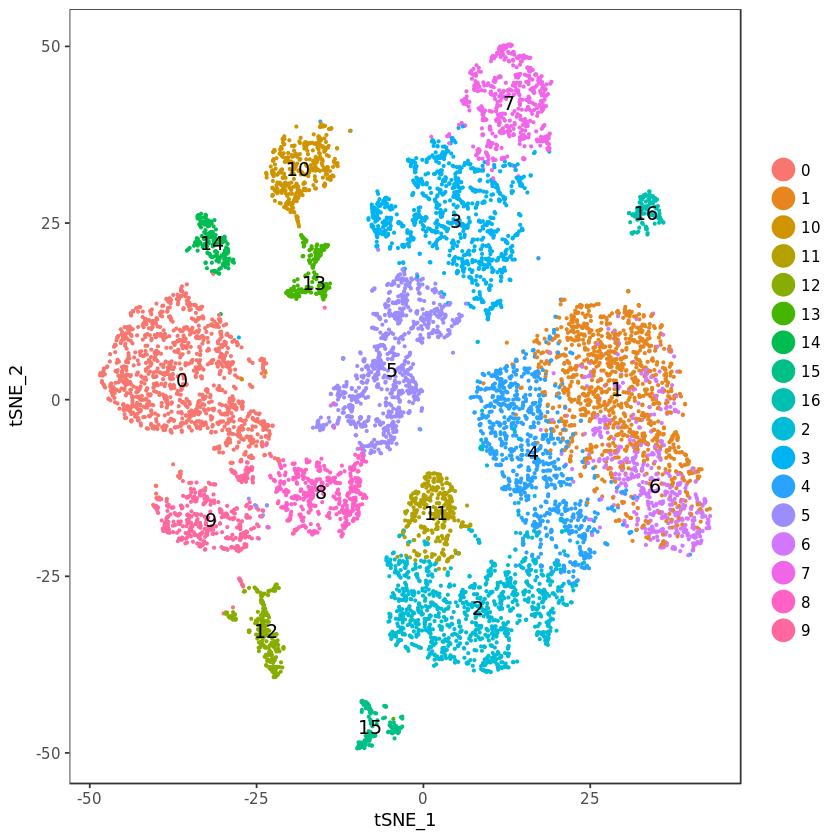

In [45]:
plot(p0.5)

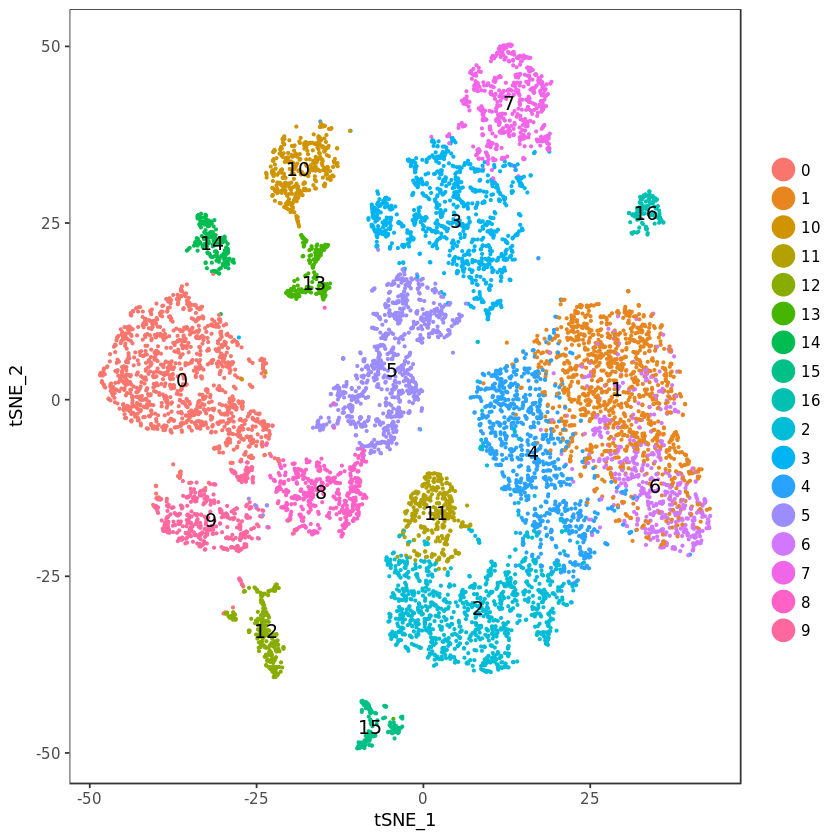

In [46]:
plot(p0.6)

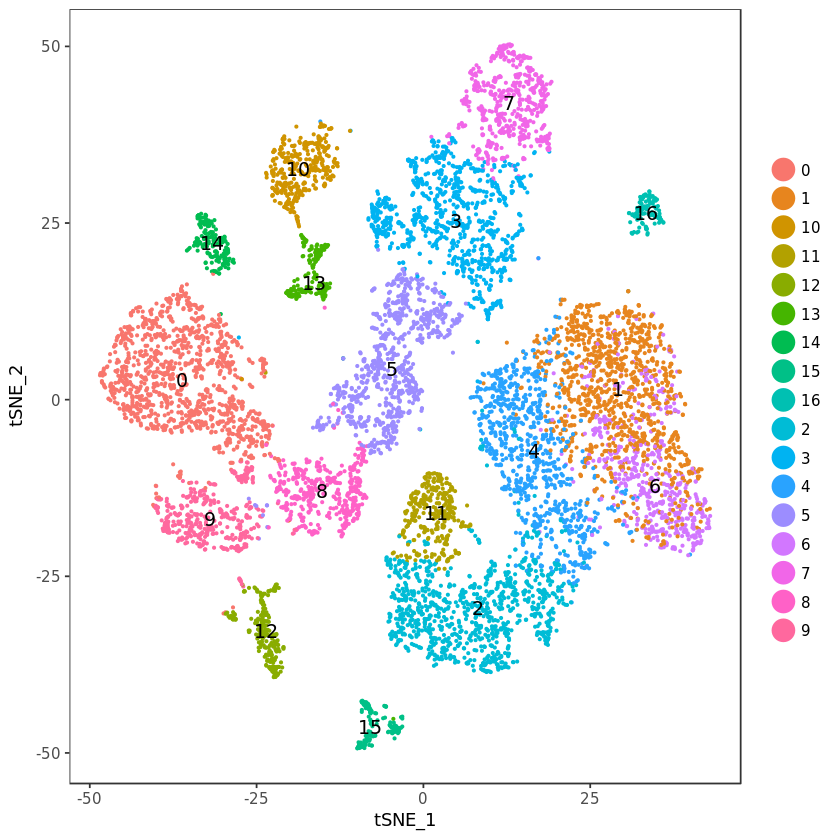

In [47]:
plot(p0.8)

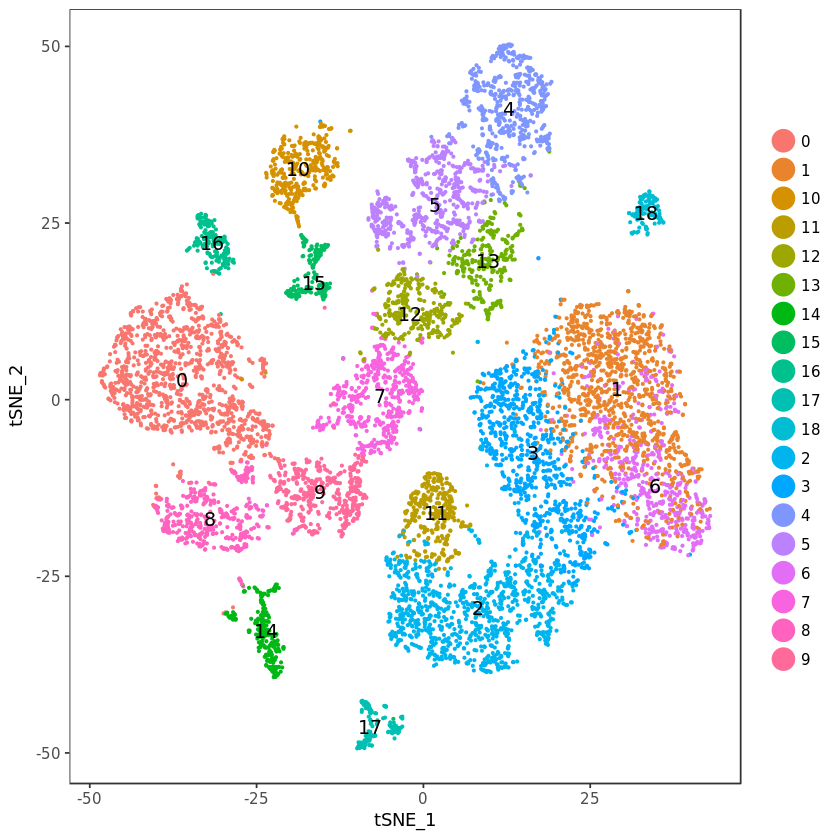

In [48]:
plot(p1.0)

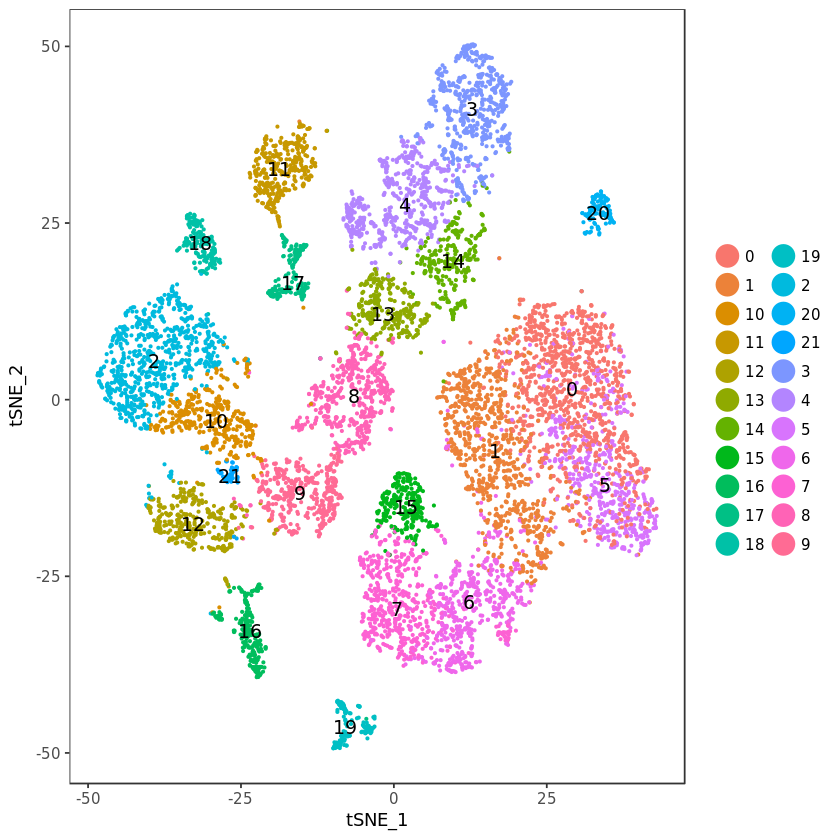

In [49]:
plot(p1.5)

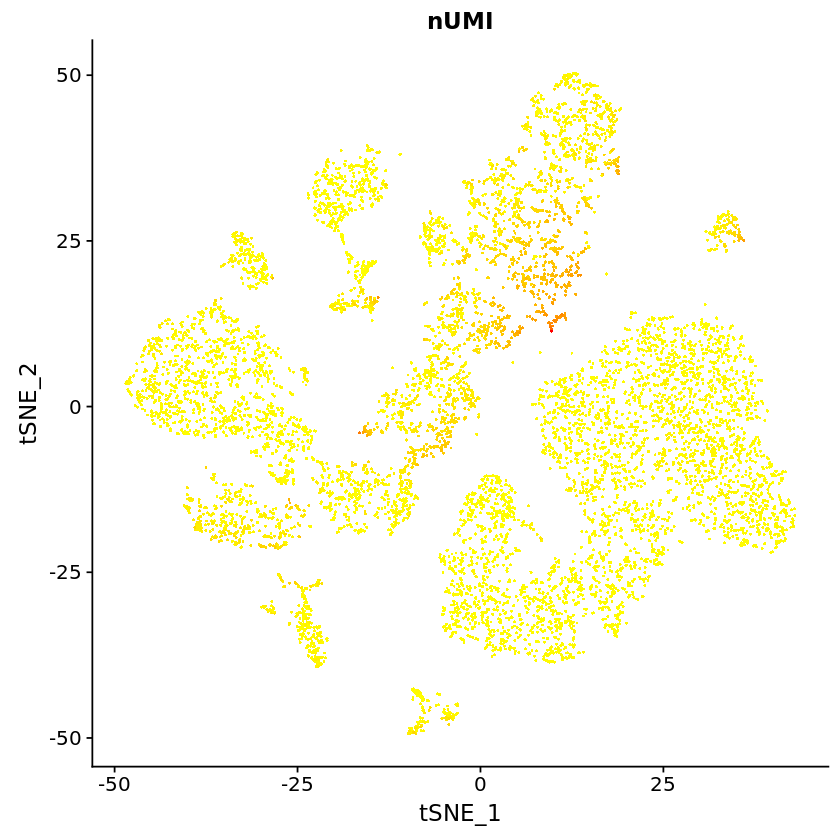

In [50]:
FeaturePlot(cells, features.plot = c("nUMI"), pt.size = 0.5)

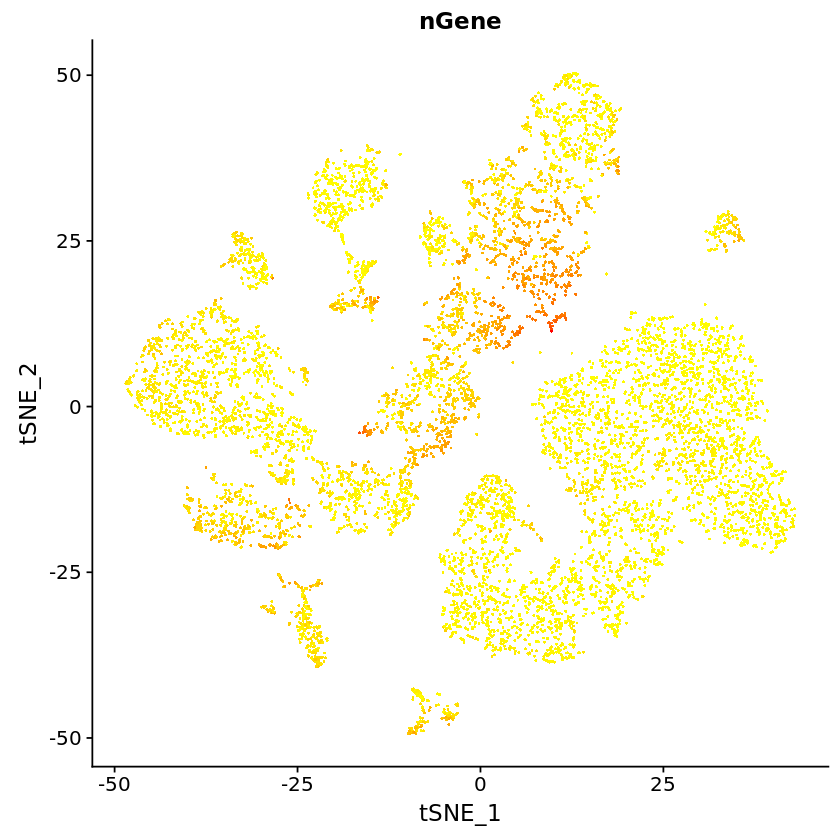

In [51]:
FeaturePlot(cells, features.plot = c("nGene"), pt.size = 0.5)

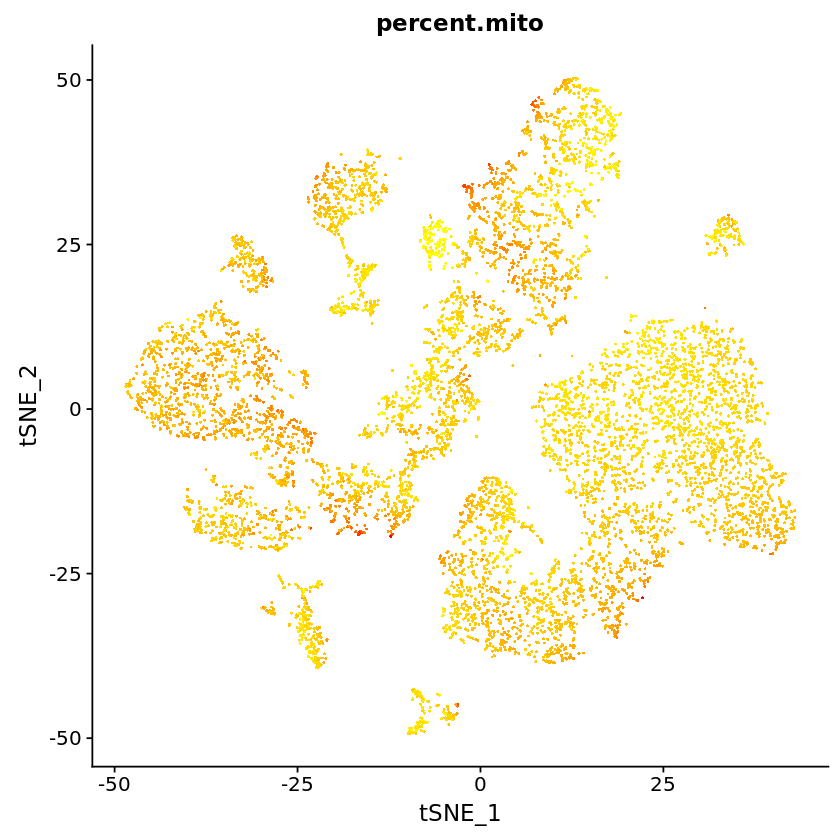

In [52]:
FeaturePlot(cells, features.plot = c("percent.mito"), pt.size = 0.5)

In [53]:
# Choose clustering resolution 
cells <- SetAllIdent(cells, id = "res.0.6")
table(cells@ident, cells@meta.data$orig.ident)

    
     bmac
  0  1160
  1  1121
  2  1032
  3   899
  4   816
  5   811
  6   541
  7   523
  8   419
  9   415
  10  363
  11  319
  12  244
  13  185
  14  178
  15  152
  16  123

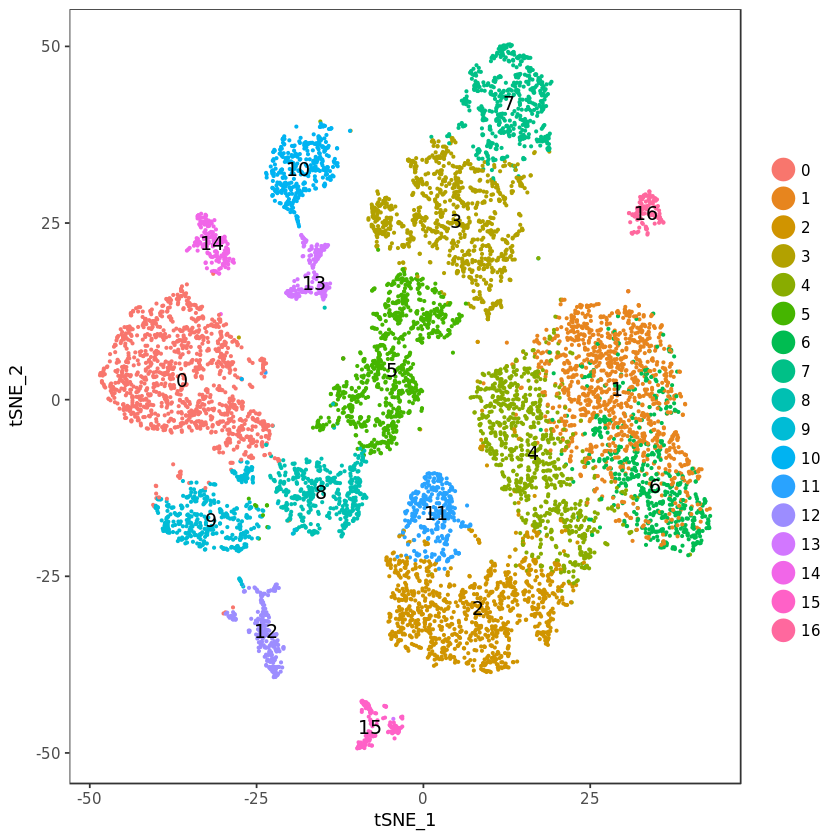

In [54]:
# Visualization
TSNEPlot(cells, do.label = T, do.return = T, pt.size = 0.5)#, group.by = "res.0.6")

In [ ]:
# Save plots
#png("p1.png")
#plot(p1)
#dev.off()

In [47]:
#save(cells, file = "bmac_cells_noJTW02.RData")
# Re-saved on 11/26/18 to include _lib definitions

In [2]:
load("bmac_cells_noJTW02.RData")

# Find differentially expressed genes (cluster biomarkers)
"Seurat can help you find markers that define clusters via differential expression. By default, it identifes positive and negative markers of a single cluster (specified in ident.1), compared to all other cells. FindAllMarkers automates this process for all clusters, but you can also test groups of clusters vs. each other, or against all cells.

The min.pct argument requires a gene to be detected at a minimum percentage in either of the two groups of cells, and the thresh.test argument requires a gene to be differentially expressed (on average) by some amount between the two groups. You can set both of these to 0, but with a dramatic increase in time - since this will test a large number of genes that are unlikely to be highly discriminatory. As another option to speed up these computations, max.cells.per.ident can be set. This will downsample each identity class to have no more cells than whatever this is set to. While there is generally going to be a loss in power, the speed increases can be significiant and the most highly differentially expressed genes will likely still rise to the top." (Satija Lab)

In [131]:
# Number of clusters and comparison name for saving tables
n_clust <- c(0:16)

In [132]:
#?FindMarkers

In [133]:
# min.pct - only test genes that are detected in a minimum fraction of min.pct cells in either of 2 populations.
#         - meant to speed up the function by not testing genes that are infrequently expressed
for (i in n_clust){
    name <- paste("Cluster", i, ".markers", sep = "")
    name <- FindMarkers(cells, ident.1 = i, min.pct = 0.1, print.bar = FALSE)
    write.csv(name, file = paste("BMAC_noJTW02_Cluster", i, "Conserved_Markers.csv", sep = "_"), quote = FALSE, row.names = TRUE)
}

In [ ]:
#cluster0.markers <- FindMarkers(cells, ident.1 = 0, grouping.var = "condition", print.bar = FALSE)
#head(cluster0.markers)

In [ ]:
#cluster1.markers <- FindMarkers(cells, ident.1 = 1, grouping.var = "condition", print.bar = FALSE)
#head(cluster1.markers)

In [ ]:
#cluster2.markers <- FindMarkers(cells, ident.1 = 2, grouping.var = "condition", print.bar = FALSE)
#head(cluster2.markers)

In [ ]:
#cluster3.markers <- FindMarkers(cells, ident.1 = 3, grouping.var = "condition", print.bar = FALSE)
#head(cluster3.markers)

In [ ]:
#cluster4.markers <- FindMarkers(cells, ident.1 = 4, grouping.var = "condition", print.bar = FALSE)
#head(cluster4.markers)

In [ ]:
#cluster5.markers <- FindMarkers(cells, ident.1 = 5, grouping.var = "condition", print.bar = FALSE)
#head(cluster5.markers)

In [ ]:
#cluster6.markers <- FindMarkers(cells, ident.1 = 6, grouping.var = "condition", print.bar = FALSE)
#head(cluster6.markers)

In [ ]:
#cluster7.markers <- FindMarkers(cells, ident.1 = 7, grouping.var = "condition", print.bar = FALSE)
#head(cluster7.markers)

In [ ]:
cluster8.markers <- FindMarkers(cells, ident.1 = 8, grouping.var = "condition", print.bar = FALSE)
head(cluster8.markers)

In [ ]:
cluster9.markers <- FindMarkers(cells, ident.1 = 9, grouping.var = "condition", print.bar = FALSE)
head(cluster9.markers)

In [ ]:
cluster10.markers <- FindMarkers(cells, ident.1 = 10, grouping.var = "condition", print.bar = FALSE)
head(cluster10.markers)

In [ ]:
cluster11.markers <- FindMarkers(cells, ident.1 = 11, grouping.var = "condition", print.bar = FALSE)
head(cluster11.markers)

In [ ]:
cluster12.markers <- FindMarkers(cells, ident.1 = 12, grouping.var = "condition", print.bar = FALSE)
head(cluster12.markers)

In [ ]:
cluster13.markers <- FindMarkers(cells, ident.1 = 13, grouping.var = "condition", print.bar = FALSE)
head(cluster13.markers)

In [ ]:
cluster14.markers <- FindMarkers(cells, ident.1 = 14, grouping.var = "condition", print.bar = FALSE)
head(cluster14.markers)

In [ ]:
cluster15.markers <- FindMarkers(cells, ident.1 = 15, grouping.var = "condition", print.bar = FALSE)
head(cluster15.markers)

In [ ]:
cluster16.markers <- FindMarkers(cells, ident.1 = 16, grouping.var = "condition", print.bar = FALSE)
head(cluster16.markers)

In [ ]:
# FindAllMarkers(combined)

## Look for clusters that need to be combined or split
Compare and contrast defining gene lists between clusters based on a cluster tree. Combine clusters that share defining genes. Consult with researchers/literature to see if the combinations make sense.

Finished averaging RNA for cluster 0
Finished averaging RNA for cluster 1
Finished averaging RNA for cluster 2
Finished averaging RNA for cluster 3
Finished averaging RNA for cluster 4
Finished averaging RNA for cluster 5
Finished averaging RNA for cluster 6
Finished averaging RNA for cluster 7
Finished averaging RNA for cluster 8
Finished averaging RNA for cluster 9
Finished averaging RNA for cluster 10
Finished averaging RNA for cluster 11
Finished averaging RNA for cluster 12
Finished averaging RNA for cluster 13
Finished averaging RNA for cluster 14
Finished averaging RNA for cluster 15
Finished averaging RNA for cluster 16


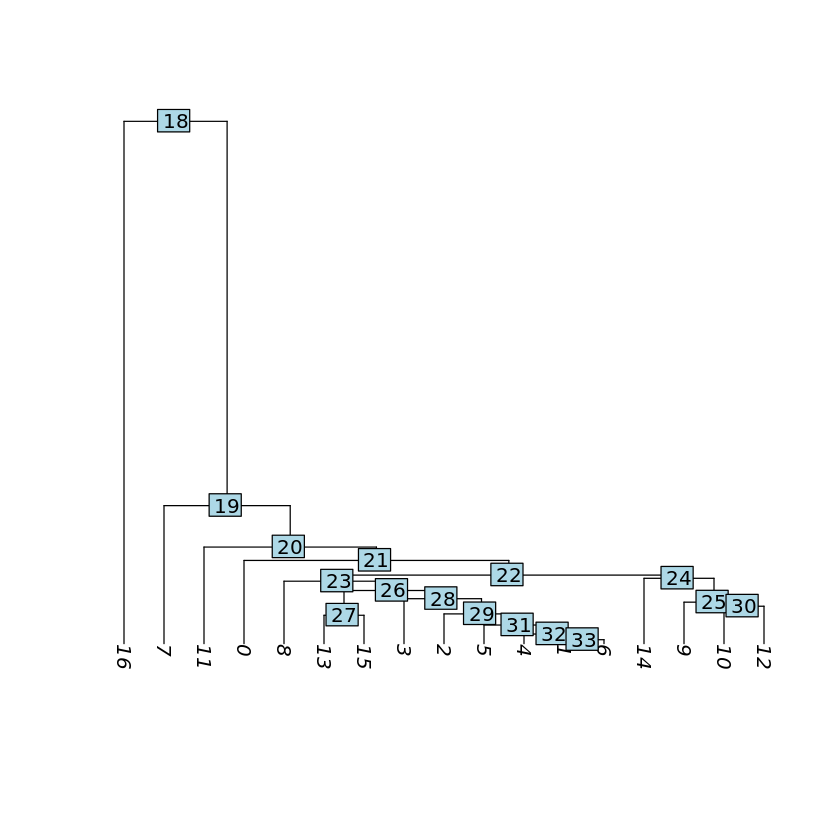

In [3]:
# Build a tree relating the average cell from each cluster. Estimated based on a distance matrix constructed in gene expression space
cells <- BuildClusterTree(cells,
                          do.reorder = FALSE,
                          reorder.numeric = FALSE,
                          do.plot = TRUE)

### Combine clusters (if necessary) and redo conserved markers lists

In [ ]:
#current.cluster.ids <- c(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13)
#new.cluster.ids <- c(0, 1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12)
#combined@ident <- plyr::mapvalues(x = combined@ident, from = current.cluster.ids, to = new.cluster.ids)

In [ ]:
#TSNEPlot(object = combined, do.label = TRUE, pt.size = 0.5)

In [ ]:
# After combining originally named clusters 1 and 2
#combined <- BuildClusterTree(combined,
#                             do.reorder = FALSE,
#                             reorder.numeric = FALSE,
#                             do.plot = TRUE)

In [ ]:
# Enter new nclust and redo conserved markers lists
#n_clust <- c(0:12)
#for (i in n_clust){
#    name <- paste("cluster", i, ".markers", sep = "")
#    name <- FindConservedMarkers(combined, ident.1 = i, grouping.var = "condition", print.bar = FALSE)
#    write.csv(name, file = paste(comp, "cluster", i, "Conserved_Markers_Adjusted.csv", sep = "_"), quote = FALSE, row.names = TRUE)
#}

# Look for MSC transcription profiles defined by select publications
* Gene Expression Profile of Human Bone Marrow Stromal Cells: High-Throughput Expressed Sequence Tag Sequencing Analysis. [Jia et al. 2002](https://www.sciencedirect.com/science/article/pii/S0888754301966832?via%3Dihub) 
* The Profile of Gene Expression of Human Marrow Mesenchymal Stem Cells. [Silva et al. 2003](https://doi.org/10.1634/stemcells.21-6-661)
* Minimal criteria for defining multipotent mesenchymal stromal cells. The International Society for Cellular Therapy position statement. [Dominici et al. 2006](https://www.ncbi.nlm.nih.gov/pubmed/16923606)
* Human Primary Bone Marrow Mesenchymal Stromal Cells and Their in vitro Progenies Display Distinct Transcriptional Profile Signatures. [Ghazanfari et al. 2017](https://www.nature.com/articles/s41598-017-09449-x)

## Jia et al. definition

Positive for all markers listed below.

In [4]:
jia <- c("FN1", "COL1A2", "COL1A1", "SPARC", "EEF1A1", "ACTG1", "ACTB", "TAGLN", "FTH1") 
jia2 <- c("ANXA2", "CTGF", "TGFBI", "VIM", "IGFBP4", "RPLP0", "DCN", "CALU", "TIMP1") 
jia3 <- c("THBS1", "FTL")
# not found: K-ALPHA-1, PAI1, COL3A1, COL5A2
# changed ANX2 -> ANXA2

In [36]:
jia_all <- c("FN1", "COL1A2", "COL1A1", "SPARC", "EEF1A1", "ACTG1", "ACTB", "TAGLN", "FTH1",
             "ANXA2", "CTGF", "TGFBI", "VIM", "IGFBP4", "RPLP0", "DCN", "CALU", "TIMP1",
             "THBS1", "FTL", "SERPINE1", "TUBA1A")

In [ ]:
# Adapted from user leonfodoulian https://github.com/satijalab/seurat/issues/528
# Get mean expression of genes of interest per cell
mean.exp <- colMeans(x = cells@data[jia_all, ], na.rm = TRUE)

# Add mean expression values in 'object@meta.data$gene.set.score'
if (all(names(x = mean.exp) == rownames(x = cells@meta.data))) {
  cat("Cell names order match in 'mean.exp' and 'object@meta.data':\n", 
      "adding gene set mean expression values in 'object@meta.data$gene.set.score'")
  cells@meta.data$'Jia et al. Positive Markers' <- mean.exp
}


In [ ]:
png(filename = "Jia_Pos_bmac.png",
    width = 1500, height = 1500, units = "px", res = 300)
FeaturePlot(object = cells, features.plot = "Jia et al. Positive Markers", 
            cols.use = c("grey", "blue"), reduction.use = "tsne")
dev.off()

In [33]:
which(jia_all %in% rownames(cells@data))

[1]  1  4  5  6  7  8  9 10 11 12 13 14 15 17 18 19 20 22

In [58]:
table(cells@meta.data$library_id)


JTW03 JTW05 JTW06 JTW07 JTW08 JTW10  MG01  MG02  MG03 
  780  1759  1016   676   563  1166  1112  1294   935 

In [40]:
#COL1A2, "COL1A1", "DCN", "SERPINE1" not in expressed list of genes
jia_all <- c("FN1", "SPARC", "EEF1A1", "ACTG1", "ACTB", "TAGLN", "FTH1",
             "ANXA2", "CTGF", "TGFBI", "VIM", "IGFBP4", "RPLP0", "CALU", "TIMP1",
             "THBS1", "FTL", "TUBA1A")

In [41]:
which(jia_all %in% rownames(cells@data))

[1]  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18

### JIA cell expression table

In [42]:
jia_all.exp <- cells@data[jia_all, ]
dim(jia_all.exp)

[1]   18 9301

In [121]:
jia.exp <- matrix(0, nrow = 18, ncol = 2)
row.names(jia.exp) <- c(0:17)
colnames(jia.exp) <- c("Percent genes expressed (<=)", "Total cells") 
jia.exp[,1] <- c(18:1)/18
jia.exp

,Percent genes expressed (<=),Total cells
0,1.00000000,0
1,0.94444444,0
2,0.88888889,0
3,0.83333333,0
4,0.77777778,0
5,0.72222222,0
6,0.66666667,0
7,0.61111111,0
8,0.55555556,0
9,0.50000000,0


In [122]:
jia.ct <- matrix(0, nrow = 0, ncol = 12)
colnames(jia.ct) <- c("T Cells", "NK Cells", "B Cells", "Erythrocytes", "Pre-B Cells", 
                      "CD34+ Progenitors", "Monocytes", "FCGR3A+ Monocytes", "Neutrophils", 
                      "B Lymphocytes", "Mature B Lymphocytes", "Monocytes/Dendritic Cells")
jia.ct

T Cells,NK Cells,B Cells,Erythrocytes,Pre-B Cells,CD34+ Progenitors,Monocytes,FCGR3A+ Monocytes,Neutrophils,B Lymphocytes,Mature B Lymphocytes,Monocytes/Dendritic Cells


In [43]:
# Count number of 0s (no expression) for each Jia gene for each cell
jia_all.exp_zeros <- colSums(jia_all.exp == 0)

In [44]:
length(which(jia_all.exp_zeros <= 0))

[1] 0

In [145]:
total_counts <- c()
for (n in 0:17) {
    tmp <- which(jia_all.exp_zeros <= n)
    total_counts <- c(total_counts, length(tmp))
    tmp2 <- data.frame(table(factor(cells@meta.data[tmp, "new.ident"], levels = unique(cells@meta.data$new.ident))))
    names <- tmp2$Var1
    tmp2.df <- as.data.frame(t(tmp2[,"Freq"]))
    colnames(tmp2.df) <- names
    rownames(tmp2.df) <- n
    jia.ct <- rbind(jia.ct, tmp2.df)
}

In [146]:
jia.exp[,2] <- total_counts

In [148]:
jia.exp

,Percent genes expressed (<=),Total cells
0,1.00000000,0
1,0.94444444,2
2,0.88888889,4
3,0.83333333,4
4,0.77777778,7
5,0.72222222,25
6,0.66666667,125
7,0.61111111,520
8,0.55555556,1324
9,0.50000000,2641


In [147]:
jia.ct

,T Cells,NK Cells,B Cells,Erythrocytes,Pre-B Cells,CD34+ Progenitors,Monocytes,FCGR3A+ Monocytes,Neutrophils,B Lymphocytes,Mature B Lymphocytes,Monocytes/Dendritic Cells
0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,2,0,0,0,0,0,0,0
2,0,0,0,0,2,2,0,0,0,0,0,0
3,0,0,0,0,2,2,0,0,0,0,0,0
4,0,0,0,0,2,2,1,0,0,0,1,1
5,0,0,0,1,2,4,13,1,0,0,2,2
6,0,0,0,1,2,12,70,8,2,0,2,28
7,3,0,0,2,5,45,275,47,14,2,3,124
8,46,6,5,25,17,136,597,96,58,10,13,315
9,323,28,26,92,42,316,919,136,160,51,44,504


In [151]:
jia.table <- cbind(jia.exp, jia.ct)
jia.table

,Percent genes expressed (<=),Total cells,T Cells,NK Cells,B Cells,Erythrocytes,Pre-B Cells,CD34+ Progenitors,Monocytes,FCGR3A+ Monocytes,Neutrophils,B Lymphocytes,Mature B Lymphocytes,Monocytes/Dendritic Cells
0,1.00000000,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0.94444444,2,0,0,0,0,2,0,0,0,0,0,0,0
2,0.88888889,4,0,0,0,0,2,2,0,0,0,0,0,0
3,0.83333333,4,0,0,0,0,2,2,0,0,0,0,0,0
4,0.77777778,7,0,0,0,0,2,2,1,0,0,0,1,1
5,0.72222222,25,0,0,0,1,2,4,13,1,0,0,2,2
6,0.66666667,125,0,0,0,1,2,12,70,8,2,0,2,28
7,0.61111111,520,3,0,0,2,5,45,275,47,14,2,3,124
8,0.55555556,1324,46,6,5,25,17,136,597,96,58,10,13,315
9,0.50000000,2641,323,28,26,92,42,316,919,136,160,51,44,504


In [154]:
write.table(jia.table, file = "BMAC_noJTW02_Jia_counts.txt", quote = FALSE, 
            sep = "\t", row.names = FALSE, col.names = TRUE)

In [46]:
jia_all.expgenes <- which(jia_all.exp_zeros <= 0)
cells@meta.data$Jia <- rep("no", nrow(cells@meta.data))
cells@meta.data[jia_all.expgenes,]$Jia <- rep("yes", length(jia_all.expgenes))
#cells@meta.data[jia_all.expgenes,] <- rep("yes", length(jia_all.expgenes))
table(cells@meta.data$Jia)
table(cells@meta.data[jia_all.expgenes,]$library_id)


  no 
9301 

< table of extent 0 >

In [197]:
pjia <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Jia", pt.size = 0.05, do.return = TRUE,
        plot.order = "no", cols.use = c("light grey"), no.legend = TRUE)# + ggtitle("BMAC expressing all 22 Jia et al. genes") 
tiff(filename = "20190207_Figures/Fig2_Jia22.tiff", width = 1500, height = 1500, units = "px", res = 300)
plot(pjia)
dev.off()

png 
  2

In [66]:
12/17

[1] 0.7058824

In [11]:
jia_all.expgenes71 <- which(jia_all.exp_zeros <= 5)

In [12]:
cells@meta.data$Jia71 <- rep("no", nrow(cells@meta.data))
cells@meta.data[jia_all.expgenes71,]$Jia71 <- rep("yes", length(jia_all.expgenes71))
table(cells@meta.data$Jia71)


  no  yes 
9256   45 

In [13]:
table(cells@meta.data[jia_all.expgenes71,]$library_id)


JTW03 JTW05 JTW06 JTW07 JTW08 JTW10  MG03 
    5    29     2     2     2     2     3 

In [15]:
table(cells@meta.data$library_id)


JTW03 JTW05 JTW06 JTW07 JTW08 JTW10  MG01  MG02  MG03 
  780  1759  1016   676   563  1166  1112  1294   935 

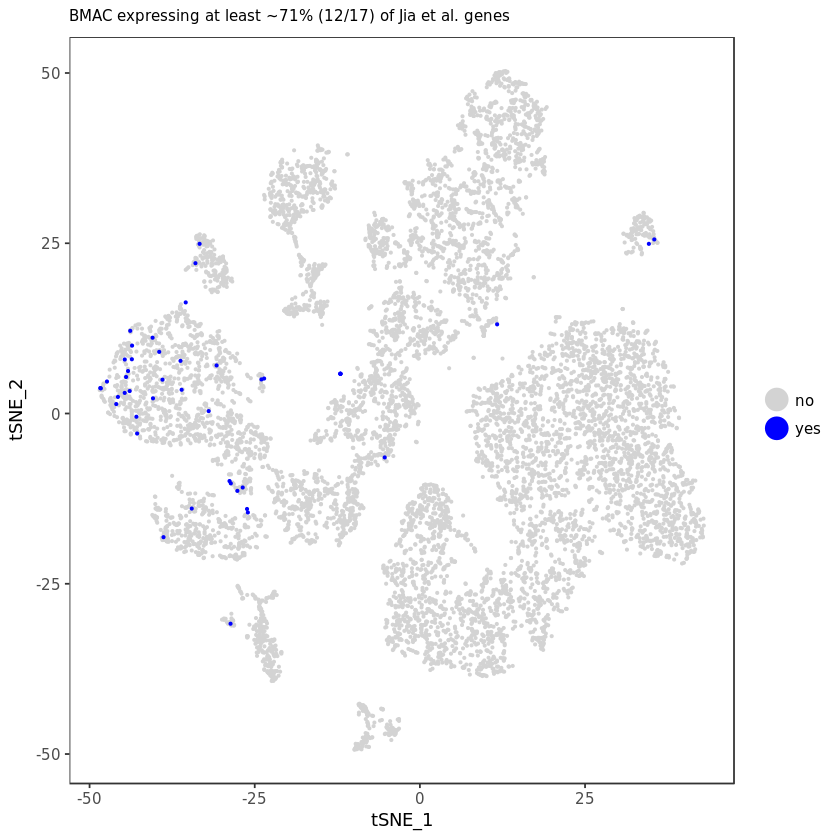

In [14]:
pjia19 <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Jia71", pt.size = 0.5, do.return = TRUE,
        plot.order = "yes", cols.use = c("light grey", "blue")) + ggtitle("BMAC expressing at least ~71% (12/17) of Jia et al. genes")
pjia19 <- pjia19 + theme(plot.title = element_text(size = 9))
#png(filename = "Jia71_binary_bmac_noJTW02.png",
#    width = 1500, height = 1500, units = "px", res = 300)
plot(pjia19)
#dev.off()

In [79]:
jia_all.expgenes53 <- which(jia_all.exp_zeros <= 8)

In [81]:
cells@meta.data$Jia53 <- rep("no", nrow(cells@meta.data))
cells@meta.data[jia_all.expgenes53,]$Jia53 <- rep("yes", length(jia_all.expgenes53))
table(cells@meta.data$Jia53)


  no  yes 
7179 2122 

In [82]:
table(cells@meta.data[jia_all.expgenes53,]$library_id)


JTW03 JTW05 JTW06 JTW07 JTW08 JTW10  MG01  MG02  MG03 
  126   692   173    96   102   445   154   230   104 

In [84]:
pjia18 <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Jia53", pt.size = 0.5, do.return = TRUE,
        plot.order = "yes", cols.use = c("light grey", "blue")) + ggtitle("BMAC expressing at least 53% (9/17) of Jia et al. genes") 
pjia18 <- pjia18 + theme(plot.title = element_text(size = 9))
png(filename = "Jia53_binary_bmac_noJTW02.png",
    width = 1500, height = 1500, units = "px", res = 300)
plot(pjia18)
dev.off()

png 
  2

In [ ]:
FeaturePlot(object = cells, features.plot = jia, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = jia2, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = jia3, cols.use = c("grey", "blue"), reduction.use = "tsne")

## Silva et al. defintion
From Table 3 of the publication, "Exclusively or highly represented in MSC1: collagens type I and type VI, SPARC, matrix metalloproteinase 2 (gelatinase), transforming growth factor β1 induced, eukaryotic translation elongation factor 1 alpha 1, fibronectin 1, light peptide 9 of myosin, transgelin, calgranulin A, heat shock protein 47, latent transforming growth factor β binding protein 2, gap junction protein alpha 1, biglycan, annexin A2, IGF binding proteins 4 and 6, hemeoxygenase 1, tropomyosin 2, connective growth factor, brain abundant membrane attached signal protein 1, galectin 1, nexin, integrins alpha 2 and alpha V, endocytic receptor, CD151 antigen." Silva et al. also noted, "tags for these transcripts were at least 50 times more abundant in the MSC as compared with CD34."

In [ ]:
silva <- c("COL1A1", "SPARC", "MMP2", "TGFB1", "EEF1A1", "FN1", "MYL9", "TAGLN")
silva2 <- c("LTBP2", "ANXA2", "IGFBP4", "IGFBP6", "HMOX1", "TPM2", "CTGF") 
silva3 <- c("LGALS1", "SNX1", "ITGA2", "ITGA5", "CD151")
# not found: ANX2, CAL1H, COL4A1, GJA1, BGN
# From https://www.genecards.org/cgi-bin/carddisp.pl?gene=ANXA2 - previous HGNC symbols for ANXA2: ANX2, CAL1H

In [68]:
silva_all <- c("COL1A1", "SPARC", "MMP2", "TGFB1", "EEF1A1", "FN1", "MYL9", "TAGLN", 
               "LTBP2", "ANXA2", "IGFBP4", "IGFBP6", "HMOX1", "TPM2", "CTGF", 
               "LGALS1", "SNX1", "ITGA2", "ITGA5", "CD151")

In [ ]:
# Adapted from user leonfodoulian https://github.com/satijalab/seurat/issues/528
# Get mean expression of genes of interest per cell
mean.exp <- colMeans(x = cells@data[silva_all, ], na.rm = TRUE)

# Add mean expression values in 'object@meta.data$gene.set.score'
if (all(names(x = mean.exp) == rownames(x = cells@meta.data))) {
  cat("Cell names order match in 'mean.exp' and 'object@meta.data':\n", 
      "adding gene set mean expression values in 'object@meta.data$gene.set.score'")
  cells@meta.data$'Silva et al. Positive Markers' <- mean.exp
}

In [ ]:
png(filename = "Silva_Pos_bmac.png",
    width = 1500, height = 1500, units = "px", res = 300)
FeaturePlot(object = cells, features.plot = "Silva et al. Positive Markers", 
            cols.use = c("grey", "blue"), reduction.use = "tsne")
dev.off()

In [87]:
which(silva_all %in% rownames(cells@data))

[1]  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20

In [69]:
#not found: "COL1A1", 
silva_all <- c("SPARC", "MMP2", "TGFB1", "EEF1A1", "FN1", "MYL9", "TAGLN", 
               "LTBP2", "ANXA2", "IGFBP4", "IGFBP6", "HMOX1", "TPM2", "CTGF", 
               "LGALS1", "SNX1", "ITGA2", "ITGA5", "CD151")

In [70]:
silva_all.exp <- cells@data[silva_all, ]
dim(silva_all.exp)
silva_all.exp_zeros <- colSums(silva_all.exp == 0)
silva_all.expgenes <- which(silva_all.exp_zeros == 0)

[1]   19 9301

### SILVA cell expression table

In [11]:
silva_all.exp <- cells@data[silva_all, ]
dim(silva_all.exp)

[1]   19 9301

In [128]:
silva.exp <- matrix(0, nrow = 19, ncol = 2)
row.names(silva.exp) <- c(0:18)
colnames(silva.exp) <- c("Percent genes expressed (<=)", "Total cells") 
silva.exp[,1] <- c(19:1)/19
silva.exp

,Percent genes expressed (<=),Total cells
0,1.00000000,0
1,0.94736842,0
2,0.89473684,0
3,0.84210526,0
4,0.78947368,0
5,0.73684211,0
6,0.68421053,0
7,0.63157895,0
8,0.57894737,0
9,0.52631579,0


In [14]:
silva.ct <- matrix(0, nrow = 0, ncol = 12)
colnames(silva.ct) <- c("T Cells", "NK Cells", "B Cells", "Erythrocytes", "Pre-B Cells", 
                      "CD34+ Progenitors", "Monocytes", "FCGR3A+ Monocytes", "Neutrophils", 
                      "B Lymphocytes", "Mature B Lymphocytes", "Monocytes/Dendritic Cells")
silva.ct

T Cells,NK Cells,B Cells,Erythrocytes,Pre-B Cells,CD34+ Progenitors,Monocytes,FCGR3A+ Monocytes,Neutrophils,B Lymphocytes,Mature B Lymphocytes,Monocytes/Dendritic Cells


In [15]:
silva_all.exp_zeros <- colSums(silva_all.exp == 0)

In [161]:
total_counts.silva <- c()
for (n in 0:18) {
    tmp <- which(silva_all.exp_zeros <= n)
    total_counts.silva <- c(total_counts.silva, length(tmp))
    tmp2 <- data.frame(table(factor(cells@meta.data[tmp, "new.ident"], levels = unique(cells@meta.data$new.ident))))
    names <- tmp2$Var1
    tmp2.df <- as.data.frame(t(tmp2[,"Freq"]))
    colnames(tmp2.df) <- names
    rownames(tmp2.df) <- n
    silva.ct <- rbind(silva.ct, tmp2.df)
}

In [162]:
silva.exp[,2] <- total_counts.silva

In [163]:
silva.exp

,Percent genes expressed (<=),Total cells
0,1.00000000,0
1,0.94736842,0
2,0.89473684,0
3,0.84210526,0
4,0.78947368,0
5,0.73684211,0
6,0.68421053,4
7,0.63157895,5
8,0.57894737,6
9,0.52631579,6


In [164]:
silva.ct

,T Cells,NK Cells,B Cells,Erythrocytes,Pre-B Cells,CD34+ Progenitors,Monocytes,FCGR3A+ Monocytes,Neutrophils,B Lymphocytes,Mature B Lymphocytes,Monocytes/Dendritic Cells
0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,1,2,0,0,0,0,1,0
7,0,0,0,0,2,2,0,0,0,0,1,0
8,0,0,0,0,2,3,0,0,0,0,1,0
9,0,0,0,0,2,3,0,0,0,0,1,0


In [165]:
silva.table <- cbind(silva.exp, silva.ct)
silva.table

,Percent genes expressed (<=),Total cells,T Cells,NK Cells,B Cells,Erythrocytes,Pre-B Cells,CD34+ Progenitors,Monocytes,FCGR3A+ Monocytes,Neutrophils,B Lymphocytes,Mature B Lymphocytes,Monocytes/Dendritic Cells
0,1.00000000,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0.94736842,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0.89473684,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0.84210526,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0.78947368,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0.73684211,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0.68421053,4,0,0,0,0,1,2,0,0,0,0,1,0
7,0.63157895,5,0,0,0,0,2,2,0,0,0,0,1,0
8,0.57894737,6,0,0,0,0,2,3,0,0,0,0,1,0
9,0.52631579,6,0,0,0,0,2,3,0,0,0,0,1,0


In [166]:
write.table(silva.table, file = "BMAC_noJTW02_Silva_counts.txt", quote = FALSE, 
            sep = "\t", row.names = FALSE, col.names = TRUE)

In [72]:
silva_all.expgenes <- which(silva_all.exp_zeros <= 0)
cells@meta.data$Silva <- rep("no", nrow(cells@meta.data))
cells@meta.data[silva_all.expgenes,]$Silva <- rep("yes", length(silva_all.expgenes))
table(cells@meta.data$Silva)
table(cells@meta.data[silva_all.expgenes,]$library_id)


  no 
9301 

< table of extent 0 >

In [199]:
psilva <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Silva", pt.size = 0.05, do.return = TRUE,
        plot.order = "no", cols.use = c("light grey"), no.legend = TRUE) #+ ggtitle("BMAC expressing all 23 Silva et al. genes") 
tiff(filename = "20190207_Figures/Fig2_Silva.tiff",
    width = 1500, height = 1500, units = "px", res = 300)
plot(psilva)
dev.off()

png 
  2

In [91]:
14/19

[1] 0.7368421

In [92]:
silva_all.expgenes74 <- which(silva_all.exp_zeros <= 5)

In [93]:
cells@meta.data$Silva74 <- rep("no", nrow(cells@meta.data))
cells@meta.data[silva_all.expgenes74,]$Silva74 <- rep("yes", length(silva_all.expgenes74))
table(cells@meta.data$Silva74)


  no 
9301 

In [ ]:
psilva78 <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Silva78", pt.size = 0.5, do.return = TRUE,
        plot.order = "yes", cols.use = c("light grey", "blue")) + ggtitle("BMAC expressing at least 78% (18/23) of Silva et al. genes")
psilva78 <- psilva78 + theme(plot.title = element_text(size = 10))
png(filename = "Silva78_binary_bmac.png",
    width = 1500, height = 1500, units = "px", res = 300)
plot(psilva78)
dev.off()

In [95]:
silva_all.expgenes58 <- which(silva_all.exp_zeros <= 10)
cells@meta.data$Silva58 <- rep("no", nrow(cells@meta.data))
cells@meta.data[silva_all.expgenes58,]$Silva58 <- rep("yes", length(silva_all.expgenes58))
table(cells@meta.data$Silva58)


  no  yes 
9292    9 

In [96]:
table(cells@meta.data[silva_all.expgenes58,]$library_id)


JTW03 JTW05 JTW06 JTW07  MG02 
    3     3     1     1     1 

In [98]:
psilva58 <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Silva58", pt.size = 0.5, do.return = TRUE,
        plot.order = "yes", cols.use = c("light grey", "blue")) + ggtitle("BMAC expressing at least 58% (11/19) of Silva et al. genes")
psilva58 <- psilva58 + theme(plot.title = element_text(size = 10))
png(filename = "Silva58_binary_bmac_noJTW02.png",
    width = 1500, height = 1500, units = "px", res = 300)
plot(psilva58)
dev.off()

png 
  2

In [211]:
12/19

[1] 0.6315789

In [ ]:
FeaturePlot(object = cells, features.plot = silva, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = silva2, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = silva3, cols.use = c("grey", "blue"), reduction.use = "tsne")

## Dominici et al. definition
"First, MSC must be plastic-adherent when maintained in standard culture conditions. Second, MSC must express CD105, CD73 and CD90, and lack expression of CD45, CD34, CD14 or CD11b, CD79alpha or CD19 and HLA-DR surface molecules. Third, MSC must differentiate to osteoblasts, adipocytes and chondroblasts in vitro. While these criteria will probably require modification as new knowledge unfolds, we believe this minimal set of standard criteria will foster a more uniform characterization of MSC and facilitate the exchange of data among investigators."
* We can test the first two criteria given the data

In [49]:
dominici_pos <- c("ENG", "NT5E") 
dominici_neg <- c("PTPRC", "CD34", "CD14", "CD79A", "CD19", "HLA-DRA")#, "HLA-DRB1", "HLA-DRB5")
# CD105 -> ENG
# CD73 -> NT5E
# CD90 -> THY1
# CD45 -> PTPRC
# Not found: CD11B, THY1

In [ ]:
# Adapted from user leonfodoulian https://github.com/satijalab/seurat/issues/528
# Get mean expression of genes of interest per cell
mean.exp <- colMeans(x = cells@data[dominici_pos, ], na.rm = TRUE)

# Add mean expression values in 'object@meta.data$gene.set.score'
if (all(names(x = mean.exp) == rownames(x = cells@meta.data))) {
  cat("Cell names order match in 'mean.exp' and 'object@meta.data':\n", 
      "adding gene set mean expression values in 'object@meta.data$gene.set.score'")
  cells@meta.data$'Dominici et al. Positive Markers' <- mean.exp
}

In [ ]:
# Plot mean expression using Seurat::FeaturePlot()
png(filename = "Dominici_Pos_bmac.png",
    width = 1500, height = 1500, units = "px", res = 300)
FeaturePlot(object = cells, features.plot = "Dominici et al. Positive Markers", 
            cols.use = c("grey", "blue"), reduction.use = "tsne")
dev.off()

In [ ]:
# Adapted from user leonfodoulian https://github.com/satijalab/seurat/issues/528
# Get mean expression of genes of interest per cell
mean.exp <- colMeans(x = cells@data[dominici_neg, ], na.rm = TRUE)

# Add mean expression values in 'object@meta.data$gene.set.score'
if (all(names(x = mean.exp) == rownames(x = cells@meta.data))) {
  cat("Cell names order match in 'mean.exp' and 'object@meta.data':\n", 
      "adding gene set mean expression values in 'object@meta.data$gene.set.score'")
  cells@meta.data$'Dominici et al. Negative Markers' <- mean.exp
}

In [ ]:
# Plot mean expression using Seurat::FeaturePlot()
png(filename = "Dominici_Neg_bmac.png",
    width = 1500, height = 1500, units = "px", res = 300)
FeaturePlot(object = cells, features.plot = "Dominici et al. Negative Markers", 
            cols.use = c("grey", "blue"), reduction.use = "tsne")
dev.off()

In [50]:
dominici_pos.exp <- cells@data[dominici_pos, ]
dim(dominici_pos.exp)
dominici_pos.exp_zeros <- colSums(dominici_pos.exp == 0)
dominici_pos.expgenes <- which(dominici_pos.exp_zeros <= 0)

[1]    2 9301

In [51]:
dominici_neg.exp <- cells@data[dominici_neg, ]
dim(dominici_neg.exp)
dominici_neg.exp_zeros <- colSums(dominici_neg.exp == 0)
dominici_neg.expgenes <- which(dominici_neg.exp_zeros == length(dominici_neg))

[1]    6 9301

In [54]:
dominici_pos.expgenes <- which(dominici_pos.exp_zeros <= 0)
dominici_neg.expgenes <- which(dominici_neg.exp_zeros <= 0)

In [55]:
dominici_match <- intersect(dominici_pos.expgenes, dominici_neg.expgenes)
length(dominici_match)

[1] 0

### Dominici cell expression table
* There are 2134 cells that do not express all 6 negative genes
* Show stats for 3 pos, 2 pos, 1 pos

In [15]:
length(dominici_neg.expgenes)

[1] 2134

In [16]:
dominici.exp <- matrix(0, nrow = 3, ncol = 2)
row.names(dominici.exp) <- c(0:2)
colnames(dominici.exp) <- c("Percent +genes expressed (<=)", "Total cells") 
dominici.exp[,1] <- c(3:1)/3
dominici.exp

,Percent +genes expressed (<=),Total cells
0,1.0000000,0
1,0.6666667,0
2,0.3333333,0


In [70]:
dominici.ct <- matrix(0, nrow = 0, ncol = 12)
colnames(dominici.ct) <- c("T Cells", "NK Cells", "B Cells", "Erythrocytes", "Pre-B Cells", 
                      "CD34+ Progenitors", "Monocytes", "FCGR3A+ Monocytes", "Neutrophils", 
                      "B Lymphocytes", "Mature B Lymphocytes", "Monocytes/Dendritic Cells")
dominici.ct

T Cells,NK Cells,B Cells,Erythrocytes,Pre-B Cells,CD34+ Progenitors,Monocytes,FCGR3A+ Monocytes,Neutrophils,B Lymphocytes,Mature B Lymphocytes,Monocytes/Dendritic Cells


In [71]:
head(cells@meta.data)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,Jia,Jia71,Silva,Dominici,Ghaz_surface,Ghaz_con,new.ident
AAACCTGCACCCATGG-2,1034,4919,bmac,JTW03,0.02359162,1,1,1,1,5,no,no,no,no,no,no,T Cells
AAACCTGCAGGGTTAG-2,899,3459,bmac,JTW03,0.02862099,1,1,1,1,0,no,no,no,no,no,no,T Cells
AAACCTGGTGCTCTTC-2,1263,4938,bmac,JTW03,0.04193679,2,2,2,2,7,no,no,no,no,no,no,T Cells
AAACCTGGTGGCTCCA-2,1255,3066,bmac,JTW03,0.05058747,11,11,11,11,15,no,no,no,no,no,no,NK Cells
AAACCTGTCACCGGGT-2,1316,4441,bmac,JTW03,0.02974313,2,2,2,2,7,no,no,no,no,no,no,T Cells
AAACGGGTCAGCACAT-2,927,3956,bmac,JTW03,0.03413401,1,1,1,1,0,no,no,no,no,no,no,T Cells


In [72]:
total_counts.dominici <- c()
#dominici_match <- intersect(dominici_pos.expgenes, dominici_neg.expgenes)
for (n in 0:2) {
    dominici_pos.expgenes <- which(dominici_pos.exp_zeros <= n)
    dominici_neg.expgenes <- which(dominici_neg.exp_zeros == length(dominici_neg)) # All must be not expressed (2134 cells)
    tmp <- intersect(dominici_pos.expgenes, dominici_neg.expgenes)
    total_counts.dominici <- c(total_counts.dominici, length(tmp))
    tmp2 <- data.frame(table(factor(cells@meta.data[tmp, "new.ident"], levels = unique(cells@meta.data$new.ident))))
    names <- tmp2$Var1
    tmp2.df <- as.data.frame(t(tmp2[,"Freq"]))
    colnames(tmp2.df) <- names
    rownames(tmp2.df) <- n
    dominici.ct <- rbind(dominici.ct, tmp2.df)
}

In [73]:
head(cells@meta.data)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,Jia,Jia71,Silva,Dominici,Ghaz_surface,Ghaz_con,new.ident
AAACCTGCACCCATGG-2,1034,4919,bmac,JTW03,0.02359162,1,1,1,1,5,no,no,no,no,no,no,T Cells
AAACCTGCAGGGTTAG-2,899,3459,bmac,JTW03,0.02862099,1,1,1,1,0,no,no,no,no,no,no,T Cells
AAACCTGGTGCTCTTC-2,1263,4938,bmac,JTW03,0.04193679,2,2,2,2,7,no,no,no,no,no,no,T Cells
AAACCTGGTGGCTCCA-2,1255,3066,bmac,JTW03,0.05058747,11,11,11,11,15,no,no,no,no,no,no,NK Cells
AAACCTGTCACCGGGT-2,1316,4441,bmac,JTW03,0.02974313,2,2,2,2,7,no,no,no,no,no,no,T Cells
AAACGGGTCAGCACAT-2,927,3956,bmac,JTW03,0.03413401,1,1,1,1,0,no,no,no,no,no,no,T Cells


In [74]:
dominici.exp[,2] <- total_counts.dominici

In [75]:
dominici.exp

,Percent +genes expressed (<=),Total cells
0,1.0000000,1
1,0.6666667,353
2,0.3333333,2134


In [76]:
dominici.table <- cbind(dominici.exp, dominici.ct)
dominici.table

,Percent +genes expressed (<=),Total cells,T Cells,NK Cells,B Cells,Erythrocytes,Pre-B Cells,CD34+ Progenitors,Monocytes,FCGR3A+ Monocytes,Neutrophils,B Lymphocytes,Mature B Lymphocytes,Monocytes/Dendritic Cells
0,1.0000000,1,0,0,0,0,0,1,0,0,0,0,0,0
1,0.6666667,353,36,1,0,307,0,8,0,0,1,0,0,0
2,0.3333333,2134,860,63,0,1075,1,45,14,1,52,0,23,0


In [60]:
write.table(dominici.table, file = "BMAC_noJTW02_DominiciPos_counts.txt", quote = FALSE, 
            sep = "\t", row.names = FALSE, col.names = TRUE)

ERROR: Error in is.data.frame(x): object 'dominici.table' not found


In [56]:
cells@meta.data$Dominici <- rep("no", nrow(cells@meta.data))
cells@meta.data[dominici_match,]$Dominici <- rep("yes", length(dominici_match))
table(cells@meta.data$Dominici)


  no 
9301 

In [57]:
table(cells@meta.data[dominici_match,]$library_id)

< table of extent 0 >

In [135]:
head(cells@meta.data)
table(cells@meta.data$Dominici)
table(cells@meta.data$Dom_lib)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,⋯,Dominici,Ghaz_surface,Ghaz_con,pos_msc,ptsize,Jia_lib,Silva_lib,Ghaz_surf_lib,Dom_lib,Ghazc3c5_lib
AAACCTGCACCCATGG-2,1034,4919,bmac,JTW03,0.02359162,1,1,1,1,5,⋯,no,no,no,Not MSC,0.05,no,no,no,no,no
AAACCTGCAGGGTTAG-2,899,3459,bmac,JTW03,0.02862099,1,1,1,1,0,⋯,no,no,no,Not MSC,0.05,no,no,no,no,no
AAACCTGGTGCTCTTC-2,1263,4938,bmac,JTW03,0.04193679,2,2,2,2,7,⋯,no,no,no,Not MSC,0.05,no,no,no,no,no
AAACCTGGTGGCTCCA-2,1255,3066,bmac,JTW03,0.05058747,11,11,11,11,15,⋯,no,no,no,Not MSC,0.05,no,no,no,no,no
AAACCTGTCACCGGGT-2,1316,4441,bmac,JTW03,0.02974313,2,2,2,2,7,⋯,no,no,no,Not MSC,0.05,no,no,no,no,no
AAACGGGTCAGCACAT-2,927,3956,bmac,JTW03,0.03413401,1,1,1,1,0,⋯,no,no,no,Not MSC,0.05,no,no,no,no,no



  no 
9301 


  no  yes 
8948  353 

In [193]:
pdominici <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Dominici", pt.size = 0.05, do.return = TRUE,
                     cols.use = c("light grey"), no.legend = TRUE)# + ggtitle("BMAC matching the Dominici et al. MSC profile")
pdominici <- pdominici + theme(plot.title = element_text(size = 8))
tiff(filename = "20190207_Figures/Fig2_Dominici.tiff",
    width = 1500, height = 1500, units = "px", res = 300)
plot(pdominici)
dev.off()

png 
  2

In [ ]:
FeaturePlot(object = cells, features.plot = dominici_pos, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = dominici_neg, cols.use = c("grey", "blue"), reduction.use = "tsne")

## Ghazanfari et al. definition
Surface marker profile: "lin−/CD45−/CD31−/CD71−/CD235−/CD271+"

Conventional markers: "Identification and characterization of primary BM-MSCs has conventionally relied on prospective isolation usually by a combination of two or more surface markers. Reported markers for primary BM-MSCs include CD271 (LNGFR)6, CD106 (VCAM-1) and STRO-17, CD146 (MCAM)8, CD90 (THY-1)9, CD105 (Endoglin)10, frizzled-9 and SSEA-411, CD51 (ITGaV)12, CD140a (PDGFRa)12, SUSD2 (W5C5)13, MSCA-114, CD230 (PrP)15 and LEPR16."

Shared markers between primary and sphere cultured MSCs (clusters 3 and 5): "Among the 16 different clusters, numbers 3 and 5 showed similar gene expression levels in primary and sphere cultured cells, while they were clearly different in the adherent cultured cells. Thus, these clusters are likely to contain possible candidate genes that are involved in maintaining BM-MSC stem cell properties in sphere cultures, e.g. in vivo self-renewal capacity. Therefore, these clusters were chosen for a more detailed analysis." - Lists of genes found in Supplementary Table S1

### Ghazanfari et al. surface marker profile

In [59]:
# Look for all negative except CD271
ghaz_surface_neg <- c("PTPRC", "PECAM1", "TFRC", "GYPA")
ghaz_surface_pos <- c("NGFR")
# LIN not found
# CD45 -> PTPRC
# CD31 -> PECAM1
# CD71 -> TFRC
# CD235a -> GYPA
# CD271 -> NGFR

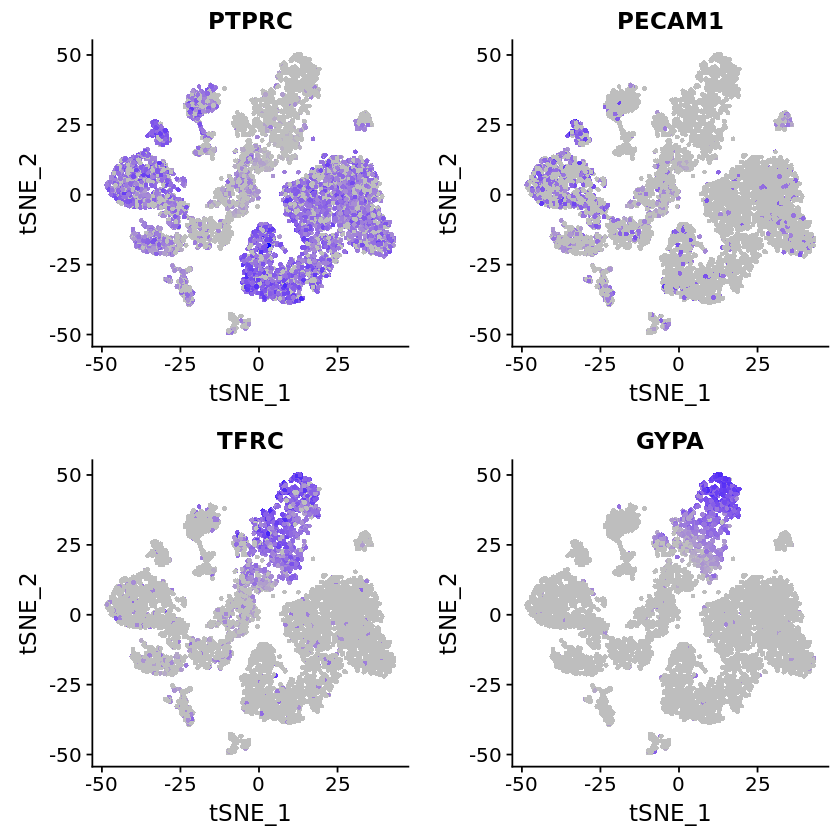

In [49]:
FeaturePlot(object = cells, features.plot = ghaz_surface_neg, cols.use = c("grey", "blue"), reduction.use = "tsne")

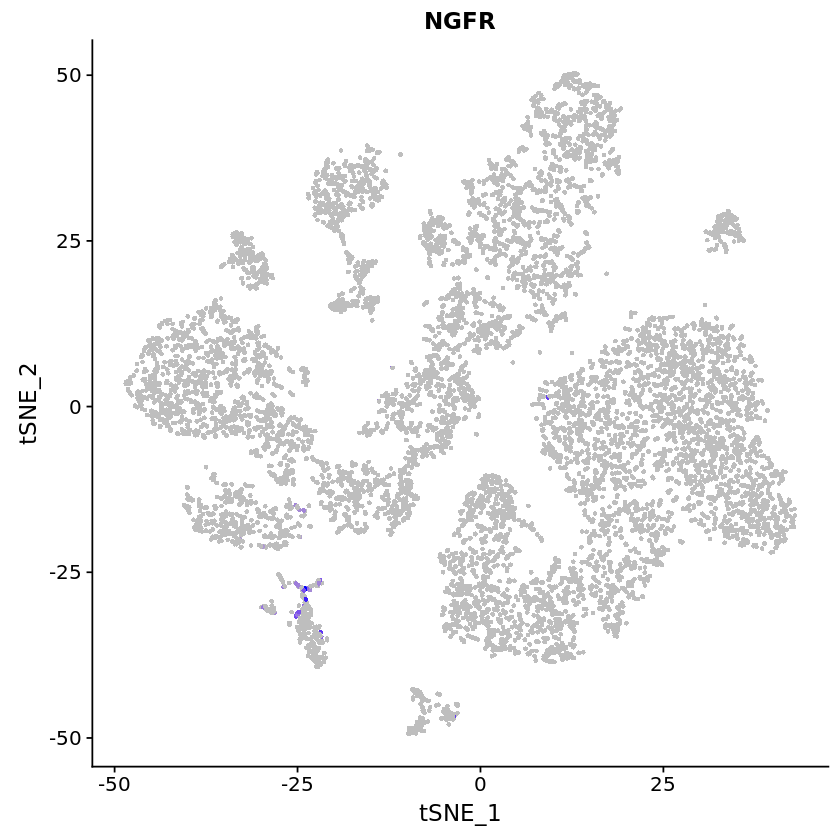

In [50]:
FeaturePlot(object = cells, features.plot = ghaz_surface_pos, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [60]:
ghaz_surface_pos.exp <- cells@data[ghaz_surface_pos, ]
#dim(ghaz_surface_pos.exp)
#ghaz_surface_pos.exp_zeros <- colSums(ghaz_surface_pos.exp == 0)
#ghaz_surface_pos.expgenes <- which(ghaz_surface_pos.exp_zeros == 0)
ghaz_surface_pos.expgenes <- which(ghaz_surface_pos.exp != 0)

In [61]:
ghaz_surface_neg.exp <- cells@data[ghaz_surface_neg, ]
dim(ghaz_surface_neg.exp)
ghaz_surface_neg.exp_zeros <- colSums(ghaz_surface_neg.exp == 0)
ghaz_surface_neg.expgenes <- which(ghaz_surface_neg.exp_zeros == length(ghaz_surface_neg))

[1]    4 9301

In [62]:
ghaz_surface_match <- intersect(ghaz_surface_pos.expgenes, ghaz_surface_neg.expgenes)

In [63]:
length(ghaz_surface_match)

[1] 9

In [136]:
rownames(cells@data)[ghaz_surface_match]

[1] "BATF3"        "FAHD2B"       "TCAIM"        "ALS2CL"       "TWF2"        
[6] "RP11-434H6.7" "HIST1H2AG"    "VEGFA"        "OCM"

In [21]:
ghaz_surf.exp <- matrix(0, nrow = 1, ncol = 2)
row.names(ghaz_surf.exp) <- c(1:1)
colnames(ghaz_surf.exp) <- c("Percent genes expressed (<=)", "Total cells") 
ghaz_surf.exp[,1] <- c(1:1)/1
ghaz_surf.exp

,Percent genes expressed (<=),Total cells
1,1,0


In [33]:
ghaz_surf.ct <- matrix(0, nrow = 0, ncol = 12)
colnames(ghaz_surf.ct) <- c("T Cells", "NK Cells", "B Cells", "Erythrocytes", "Pre-B Cells", 
                      "CD34+ Progenitors", "Monocytes", "FCGR3A+ Monocytes", "Neutrophils", 
                      "B Lymphocytes", "Mature B Lymphocytes", "Monocytes/Dendritic Cells")
ghaz_surf.ct

T Cells,NK Cells,B Cells,Erythrocytes,Pre-B Cells,CD34+ Progenitors,Monocytes,FCGR3A+ Monocytes,Neutrophils,B Lymphocytes,Mature B Lymphocytes,Monocytes/Dendritic Cells


In [34]:
total_counts.ghaz_surf <- c()
for (n in 0) {
    ghaz_surface_pos.expgenes <- which(ghaz_surface_pos.exp != 0)
    ghaz_surface_neg.expgenes <- which(ghaz_surface_neg.exp_zeros == length(ghaz_surface_neg))
    tmp <- intersect(ghaz_surface_pos.expgenes, ghaz_surface_neg.expgenes)
    total_counts.ghaz_surf <- c(total_counts.ghaz_surf, length(tmp))
    tmp2 <- data.frame(table(factor(cells@meta.data[tmp, "new.ident"], levels = unique(cells@meta.data$new.ident))))
    names <- tmp2$Var1
    tmp2.df <- as.data.frame(t(tmp2[,"Freq"]))
    colnames(tmp2.df) <- names
    rownames(tmp2.df) <- n
    ghaz_surf.ct <- rbind(ghaz_surf.ct, tmp2.df)
}

In [88]:
ghaz_surf.exp[,2] <- length(tmp)

In [89]:
ghaz_surf.exp

,Percent genes expressed (<=),Total cells
1,1,9


In [90]:
ghaz_surf.ct

,T Cells,NK Cells,B Cells,Erythrocytes,Pre-B Cells,CD34+ Progenitors,Monocytes,FCGR3A+ Monocytes,Neutrophils,B Lymphocytes,Mature B Lymphocytes,Monocytes/Dendritic Cells
0,0,0,0,0,2,0,0,0,0,0,0,7


In [91]:
ghaz_surf.table <- cbind(ghaz_surf.exp, ghaz_surf.ct)
ghaz_surf.table

Percent genes expressed (<=),Total cells,T Cells,NK Cells,B Cells,Erythrocytes,Pre-B Cells,CD34+ Progenitors,Monocytes,FCGR3A+ Monocytes,Neutrophils,B Lymphocytes,Mature B Lymphocytes,Monocytes/Dendritic Cells
1,9,0,0,0,0,2,0,0,0,0,0,0,7


In [92]:
write.table(ghaz_surf.table, file = "BMAC_noJTW02_GhazSurfPos_counts.txt", quote = FALSE, 
            sep = "\t", row.names = FALSE, col.names = TRUE)

In [64]:
cells@meta.data$Ghaz_surface <- rep("no", nrow(cells@meta.data))
cells@meta.data[ghaz_surface_match,]$Ghaz_surface <- rep("yes", length(ghaz_surface_match))
table(cells@meta.data$Ghaz_surface)
table(cells@meta.data[ghaz_surface_match,]$library_id)


  no  yes 
9292    9 


JTW05 JTW06 JTW10 
    2     4     3 

In [195]:
pghaz_surf <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Ghaz_surface", pt.size = 0.05, do.return = TRUE,
        plot.order = "yes", cols.use = c("light grey", "blue"), no.legend = TRUE)# + ggtitle("Cells matching Ghazanfari et al. MSC surface marker profile") 
tiff(filename = "20190207_Figures/Fig2_Ghaz_surface.tiff",
    width = 1500, height = 1500, units = "px", res = 300)
plot(pghaz_surf)
dev.off()

png 
  2

### Ghazanfari et al. conventional MSC markers (citing a couple other publications)

In [63]:
ghaz_con <- c("NGFR", "VCAM1", "ENG", "ITGAV", "ALPL", "PRNP", "LEPR")
# CD271 and LNGFR -> NGFR
# STRO1/STRO-1 not found
# SSEA4/SSEA-4 not found
# CD51 -> ITGAV
# MSCA-1 -> ALPL
# CD230 -> PRNP
# Not found: MCAM, THY1, FZD9, PDGFRA, SUSD2

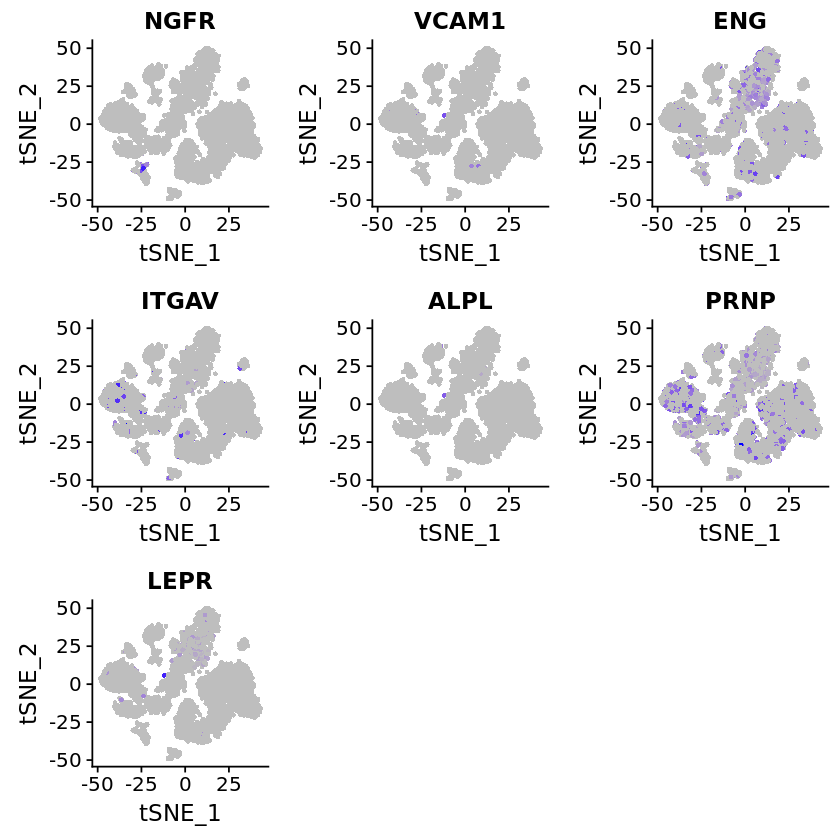

In [64]:
FeaturePlot(object = cells, features.plot = ghaz_con, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [65]:
ghaz_con.exp <- cells@data[ghaz_con, ]
dim(ghaz_con.exp)
ghaz_con.exp_zeros <- colSums(ghaz_con.exp == 0)
ghaz_con.expgenes <- which(ghaz_con.exp_zeros == 0)

[1]    7 9301

In [69]:
ghaz_con.expgenes <- which(ghaz_con.exp_zeros <= 3)
cells@meta.data$Ghaz_con <- rep("no", nrow(cells@meta.data))
cells@meta.data[ghaz_con.expgenes,]$Ghaz_con <- rep("yes", length(ghaz_con.expgenes))
table(cells@meta.data$Ghaz_con)
table(cells@meta.data[ghaz_con.expgenes,]$library_id)


  no  yes 
9294    7 


JTW03 JTW05 JTW06 
    2     4     1 

### Ghazanfari et al. cluster 3 expressed genes

In [ ]:
ghaz_clust3 <- c("CTSC", "TNFRSF1B", "STOM", "APBB1IP", "HLA-E", "FOSB", "PSME1", "APOL3")
ghaz_clust3.2 <- c("ZFP36", "AIM1", "HLA-DRB1", "PAIP2", "MRPS31", "PSAP", "BST2", "NUP88")
ghaz_clust3.3 <- c("LIPA", "EXOSC10", "CCDC130", "CSTF2", "TBP", "SNRNP40", "APOE", "HLA-B", "SDHA")
ghaz_clust3.4 <- c("HNRNPF", "CYBA", "HLA-F", "B2M", "PARP12", "HIST2H2AC", "NXF1", "ITM2B", "LARP4")
ghaz_clust3.5 <- c("PSMB9", "NUP62", "SLC44A1", "OLFML2B", "IFI16", "DUSP1", "PSMB8", "HMGB3")
ghaz_clust3.6 <- c("PPT1", "EIF2B5", "FAU", "CITED4", "GTPBP6", "TMEM218", "EIF4A3", "PTPRA", "NOP58")
ghaz_clust3.7 <- c("FOS", "STK11IP", "NDRG1", "SERPING1", "EML3", "MFSD1", "RFX5", "HLX", "MAPKAPK2")
ghaz_clust3.8 <- c("PPM1G", "WDR86", "HACL1", "DPP4", "CD68", "SEPP1", "RGS2", "FAM96A", "MAPKAPK3") 
ghaz_clust3.9 <- c("C11orf73", "NAV2", "VCAM1", "SNRPB", "EGR1", "PCID2", "OAS2", "PSME2", "ALPL")
ghaz_clust3.10 <- c("GSDMD", "SLC15A3", "HLA-G", "PTK6", "ADD3", "PIM2", "S1PR3", "RHOBTB1")
ghaz_clust3.11 <- c("SMAP2", "CDH7", "CMTM7", "SUPT7L", "TMEM30A", "HIST2H2AA4", "GMDS", "CTSC", "GRWD1")
ghaz_clust3.12 <- c("C19orf48", "UNG", "TMEM69", "HSDL2", "PCCA", "RIBC1", "PTPN12", "DNAJA1")
# Not found: "HLA-DRB6", "ECGF1", "C7orf11", "HLA-H", "FLJ37786", "OR6C76", "HCP5", 
#            "DDX39", "C22orf9", "ARMET", "NPHS2", "ZC3H11B", "KCNJ3", "FLJ42842", 
#            "LINGO4", "UCHL5IP", "LITRK4", "TCEB3C", "MIR658", "FABP5L2", "SLC7A2", "GLDN", "C1QTNF1", "PDGFRA", "PPARG", 

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust3, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.2, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.3, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.4, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.5, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.6, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.7, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.8, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.9, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.10, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.11, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.12, cols.use = c("grey", "blue"), reduction.use = "tsne")

### Ghazanfari et al. cluster 5 expressed genes

In [ ]:
ghaz_clust5 <- c("DKK3", "CSRP1", "COL8A1", "LDLR", "LIMS2", "ASNS", "HOMER2", "LOX", "ITGA11")
ghaz_clust5.2 <- c("PDE7B", "PSAT1", "ASNS", "TAGLN", "LOXL1", "LMCD1", "COL1A2", "DACT1", "MTHFD2")
ghaz_clust5.3 <- c("CRYAB", "DSTN", "CRIP2", "CDH2", "CD151", "SDC2", "SLC1A5")
#ghaz_clust5.4 <- c()
ghaz_clust5.5 <- c("WSB2", "PLAA", "IARS", "COL1A1", "DSTN", "THBS1", "AFAP1")
# Not found: "STC2", "COL12A1", "HAS1", "CRABP2", "PPP1R3C", "POSTN", "KRT7", "FLNC", "MFAP2", "FOXD1", "HAPLN1",
#            "COL5A2", "CNN1", 

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.2, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.3, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
#FeaturePlot(object = cells, features.plot = ghaz_clust5.4, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.5, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
ghaz_clust5.6 <- c("DACT1", "CKB", "CARS", "THBS3", "B4GALT2", "CALD1", "TRIB3", "NUPR1")
ghaz_clust5.7 <- c("MFAP5", "MYL9", "MTHFD2", "PYCR1", "NDUFA10", "DAG1", "MTCH1", "MYL6")
ghaz_clust5.8 <- c("FRMD6", "LBH", "RAB23", "MYL6", "PALM", "MID1", "SLC16A5")
ghaz_clust5.9 <- c("TAGLN", "HCFC1R1", "COL5A1", "SPARC", "PCBD1")
ghaz_clust5.10 <- c("TGDS", "SYT11", "C9orf3", "PHGDH", "FARP1", "ZFPL1", "BEND6", "PCBP4", "PEA15")
# Not found: "KIAA164", "C11orf41",  "C16orf7", "KIAA0363", "COL4A1", "HAPLN1", "TUBB2B", "POSTN", "HSPB7", "CBS", 
#            "FLRT2", "DPYSL3"

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.6, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.7, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.8, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.9, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.10, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
ghaz_clust5.11 <- c("SH3BP4", "FRMD6", "LIMA1", "BCAR3", "CHST14", "ENAH", "CLTB", "TULP4", "MLH3")
ghaz_clust5.12 <- c("SLC2A1", "PTPRF", "LOXL3", "PALLD", "TPM1", "ACTB")
ghaz_clust5.13 <- c("HCFC1R1", "MAP1A", "FAM69A", "LARGE", "ANXA5", "CARS", "RIMS3", "ARHGDIA", "TNS1")
ghaz_clust5.14 <- c("TUFT1", "C1orf198", "PCK2",  "LRSAM1", "FAT1", "ATF4", "EIF1")
ghaz_clust5.15 <- c("TP53I11", "EHD2", "TPM1", "EVL", "VLDLR")
# Not found: "C5orf23", "TMEM90B", "FER1L3", "ALPK2", "KCNK2", "NUAK1", "LYPD1", "EFS", "COMP", "LMOD1", 
#            "SLIT3", "TRNP1", 

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.11, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.12, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.13, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.14, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.15, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
ghaz_clust5.16 <- c("GALNT10", "TSPO", "TBC1D20", "RUSC2", "DACT3", "KCTD15", "TBCB", "ATXN2", "SCARF2")
ghaz_clust5.17 <- c("KLHL9",  "ESYT1", "RNH1", "UBE2D4", "SLC6A8", "MYLK", "TMEM184B", "TNK2")
ghaz_clust5.18 <- c("SLC38A2", "CBR3", "MYOF", "RAB23", "ITGBL1", "NFE2L1", "NDUFB7", "PDLIM1")
ghaz_clust5.19 <- c("ADCY4", "SNTA1", "CYB5R3", "COPZ2", "FLNA", "CNTNAP1")
ghaz_clust5.20 <- c("MATN2", "CABLES1", "LARGE", "UHRF1BP1", "NTN4")
# Not found: "ANXA2P1", "FLJ35258","GPER", "FKBP9L", "C2orf24", "MGC42630", "MGC102966", "ANXA2P1",
#            "GREM1", "CPA4", "LRRC15", "FBXL7", "FNDC1", "COL4A2", "KRT81", "HAS3", "LRRC32", 

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.16, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.17, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.18, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.19, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.20, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
ghaz_clust5.21 <- c("FBXL5", "TBC1D20", "CDC14A", "GCC1", "GDPD1", "B3GALT6")
ghaz_clust5.22 <- c("POFUT2", "S100A11", "KIFAP3", "LHPP", "SLC7A1", "ACLY", "PCK2")
ghaz_clust5.23 <- c("SCRG1", "SLC7A5", "ZFHX3",  "POFUT2", "MYLK", "SEMA4F")
ghaz_clust5.24 <- c("SPTAN1", "ARL2", "TPM2", "RNF150", "ATP6V0E2", "MEX3B", "SYTL2")
ghaz_clust5.25 <- c("PENK", "TPD52L1", "NAV1", "ECM1", "PFKP", "TMUB1", "P4HA3")
# Not found: "JUB", "C5orf53", "PIP3-E", "KRT78", "C1QTNF5", "NTM", "UNC5B", "INHBE",  "STBD1", "PTN", "HSPB2",
#            "FNDC1", "CRLF1", "NTM", "FAM180A", "FKSG30", "P2RX6",

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.21, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.22, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.23, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.24, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.25, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
ghaz_clust5.26 <- c("SMPD1", "PTPRF", "ABLIM1", "CXXC5", "PPP1R14B", "CALD1", "BCAS4", "IGFBP7", "RAB11FIP2")
ghaz_clust5.27 <- c("GLS", "GDI1", "PIP5K1C", "PDGFC", "FUBP3", "GALNT1", "FSTL3", "WARS")
ghaz_clust5.28 <- c("ID3", "DYNLRB1", "SLC3A2", "ID2", "COL8A2", "LSS",  "TPD52L1")
ghaz_clust5.29 <- c("ATOH8", "RAP1B", "CDC42EP1", "ST8SIA4", "COL8A2", "LIMCH1", "TTC3", "PFN1")
ghaz_clust5.30 <- c("PXDN", "RBCK1", "RHOBTB1", "RTN4", "TCEA2", "ZCCHC14")
# Not found: "TMEM166", "KIAA0427", "C14orf78", "SC4MOL", "C20orf30", "MIR889", "LEPRE1", "CXCR7", "MCAM", "GPR1", 
#            "BAMBI", "CAP2", "HSPB8", "THY1", "EYA2",

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.26, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.27, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.28, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.29, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.30, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
ghaz_clust5.30 <- c("BOK", "FAM171A1", "KCNMA1", "DAB2", "LMF1", "SIPA1L1", "WARS", "CREB3L2", "MYH9")
ghaz_clust5.31 <- c("FBXW4", "CTGF", "ALCAM", "ENC1", "VCL", "CTGF", "CYB5R3", "FZD2", "C7orf50")
#ghaz_clust5.32 <- c()
ghaz_clust5.33 <- c("PRSS23", "ADM2", "NLRX1", "GRPEL2", "SOX4", "SEC61A1", "ZNF197", "CNN2", "KCTD11")
ghaz_clust5.34 <- c("PLS3", "EIF4EBP1", "CLSTN1", "YIF1B", "C6orf48", "NAGK", "LAYN", "MYH9", "SLC1A4")
ghaz_clust5.35 <- c("SORBS2", "SASH1", "SIRPA", "TP53INP2")
# Not Found: "MGC72080", "C5orf13", "SCAND2", "PPAP2A", "FLJ40504", "DCI", "C18orf1", "PARVA", "COL16A1", 
#            "TMEM47", "NUAK1", "ABI3BP", "CSPG4", "BGN", "ISLR", "MET", "IL11"

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.30, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.31, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
#FeaturePlot(object = cells, features.plot = ghaz_clust5.32, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.33, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.34, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.35, cols.use = c("grey", "blue"), reduction.use = "tsne")

### Ghazanfari et al. transcription factors relevant to BM-MSCs
The list of genes was taken from Table 1 of the main text. "Next, to more specifically identify possible regulatory molecules relevant to BM-MSC properties, transcription factors were identified among the genes in clusters 3 and 5 (Table 1). Some of these transcription factors have been reported to play a role in the regulation of BM-MSCs or other stem cells, including: FOS, FOSB, HMGB3, EGR1, PPARG, ATF4, NFE2L1 and SOX4." Ghazanfari et al. 2017

In [ ]:
ghaz_clust3_TFs <- c("FOS", "FOSB", "TBP", "HMGB3", "RFX5", "HLX", "EGR1")
ghaz_clust5_TFs <- c("ATF4", "NFE2L1", "ZFHX3", "ID3", "ID2", "ATOH8", "CREB3L2", "SOX4", "ZNF197")
# Not found: TULP, PPARG, FOXD1

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust3_TFs, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [ ]:
FeaturePlot(object = cells, features.plot = ghaz_clust5_TFs, cols.use = c("grey", "blue"), reduction.use = "tsne",
            png.file = "ghaz_clust5_TFs.png")

In [ ]:
#?FeaturePlot

In [ ]:
TSNEPlot(cells, do.label = T, do.return = T, pt.size = 0.5)

### Ghazanfari et al. highly expressed genes in primary MSCs

In [109]:
highexp_ghaz <- c("ADCY3", "ALOX5AP", "ARHGDIB", "BPI", "CAMP", "CD74", "CXCL12", "CXCL16", "DEFA1B")

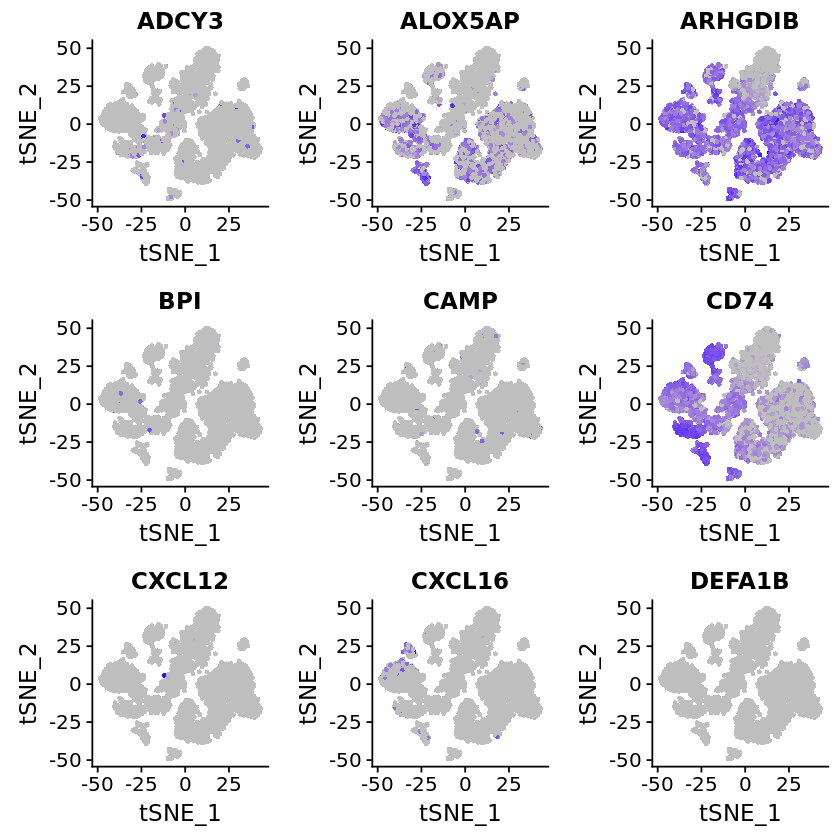

In [110]:
FeaturePlot(object = cells, features.plot = highexp_ghaz, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [117]:
ghaz_con_all <- c("NGFR", "VCAM1", "ENG", "ITGAV", "ALPL", "PRNP", "LEPR")
#Not expressed: "MCAM", "THY1", "FZD9", "PDGFRA", "SUSD2",
which(ghaz_con_all %in% row.names(cells@data))

In [118]:
which(ghaz_con_all %in% row.names(cells@data))

[1] 1 2 3 4 5 6 7

In [120]:
ghaz_con_all.exp <- cells@data[ghaz_con_all, ]
dim(ghaz_con_all.exp)
ghaz_con_all.exp_zeros <- colSums(ghaz_con_all.exp == 0)
ghaz_con_all.expgenes <- which(ghaz_con_all.exp_zeros == 0)

[1]    7 9301

In [125]:
ghaz_con_all.expgenes <- which(ghaz_con_all.exp_zeros <= 3)
cells@meta.data$Ghaz_con <- rep("no", nrow(cells@meta.data))
cells@meta.data[ghaz_con_all.expgenes,]$Ghaz_con <- rep("yes", length(ghaz_con_all.expgenes))
table(cells@meta.data$Ghaz_con)
table(cells@meta.data[ghaz_con_all.expgenes,]$library_id)


  no  yes 
9294    7 


JTW03 JTW05 JTW06 
    2     4     1 

In [129]:
pghaz_con <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Ghaz_con", pt.size = 0.5, do.return = TRUE,
        plot.order = "yes", cols.use = c("light grey", "blue")) + ggtitle("BMAC expressing 33% (4/12) Ghazanfari et al. conventional primary BM-MSC markers")
pghaz_con <- pghaz_con + theme(plot.title = element_text(size = 6))
png(filename = "Ghaz_conventional33_binary_BMAC_noJTW02.png",
    width = 1500, height = 1500, units = "px", res = 300)
plot(pghaz_con)
dev.off()

png 
  2

## Ghazanfari genes from clusters 3 and 5

In [22]:
ghaz_c3c5 <- c('CTSC', 'TNFRSF1B', 'STOM', 'APBB1IP', 'HLA-E', 'FOSB', 'PSME1', 'SLC7A2', 'APOL3', 'ZFP36', 'GLDN', 'AIM1', 'HLA-DRB1', 'PAIP2', 'MRPS31', 'PSAP', 'BST2', 'NUP88', 'LIPA', 'EXOSC10', 'CCDC130', 'CSTF2', 'TBP', 'SNRNP40', 'APOE', 'HLA-B', 'SDHA', 'HNRNPF', 'CYBA', 'HLA-F', 'B2M', 'PARP12', 'HIST2H2AC', 'NXF1', 'ITM2B', 'LARP4', 'PSMB9', 'NUP62', 'SLC44A1', 'C1QTNF1', 'OLFML2B', 'IFI16', 'DUSP1', 'PSMB8', 'HMGB3', 'PPT1', 'EIF2B5', 'FAU', 'CITED4', 'GTPBP6', 'TMEM218', 'EIF4A3', 'PTPRA', 'NOP58', 'FOS', 'STK11IP', 'NDRG1', 'SERPING1', 'EML3', 'MFSD1', 'RFX5', 'HLX', 'MAPKAPK2', 'PPM1G', 'WDR86', 'HACL1', 'DPP4', 'CD68', 'SEPP1', 'RGS2', 'FAM96A', 'MAPKAPK3', 'C11orf73', 'NAV2', 'VCAM1', 'SNRPB', 'EGR1', 'PCID2', 'OAS2', 'PSME2', 'ALPL', 'GSDMD', 'SLC15A3', 'HLA-G', 'PDGFRA', 'PTK6', 'ADD3', 'PIM2', 'S1PR3', 'RHOBTB1', 'SMAP2', 'CDH7', 'CMTM7', 'SUPT7L', 'TMEM30A', 'HIST2H2AA4', 'GMDS', 'CTSC', 'GRWD1', 'C19orf48', 'UNG', 'TMEM69', 'HSDL2', 'PPARG', 'PCCA', 'RIBC1', 'PTPN12', 'DNAJA1', 'DKK3', 'CSRP1', 'COL8A1', 'LDLR', 'LIMS2', 'STC2', 'ASNS', 'POSTN', 'HOMER2', 'LOX', 'ITGA11', 'PDE7B', 'PSAT1', 'ASNS', 'COL12A1', 'TAGLN', 'KRT7', 'HAPLN1', 'LOXL1', 'LMCD1', 'COL1A2', 'DACT1', 'HAS1', 'MTHFD2', 'CRYAB', 'FLNC', 'COL5A2', 'CRABP2', 'DSTN', 'CRIP2', 'MFAP2', 'CDH2', 'CD151', 'SDC2', 'CNN1', 'SLC1A5', 'WSB2', 'PPP1R3C', 'PLAA', 'IARS', 'COL1A1', 'DSTN', 'FOXD1', 'THBS1', 'AFAP1', 'DACT1', 'CKB', 'CARS', 'THBS3', 'B4GALT2', 'COL4A1', 'CALD1', 'TRIB3', 'NUPR1', 'MFAP5', 'MYL9', 'MTHFD2', 'HAPLN1', 'PYCR1', 'NDUFA10', 'DAG1', 'MTCH1', 'MYL6', 'FRMD6', 'TUBB2B', 'LBH', 'HSPB7', 'RAB23', 'MYL6', 'PALM', 'MID1', 'SLC16A5', 'POSTN', 'TAGLN', 'CBS', 'HCFC1R1', 'FLRT2', 'COL5A1', 'SPARC', 'PCBD1', 'DPYSL3', 'TGDS', 'SYT11', 'C9orf3', 'PHGDH', 'FARP1', 'ZFPL1', 'BEND6', 'PCBP4', 'PEA15', 'SH3BP4', 'FRMD6', 'LIMA1', 'BCAR3', 'CHST14', 'ENAH', 'CLTB', 'TULP4', 'MLH3', 'SLC2A1', 'PTPRF', 'ALPK2', 'NUAK1', 'LOXL3', 'PALLD', 'TPM1', 'ACTB', 'LYPD1', 'HCFC1R1', 'MAP1A', 'FAM69A', 'LARGE', 'ANXA5', 'CARS', 'RIMS3', 'ARHGDIA', 'TNS1', 'TUFT1', 'C1orf198', 'PCK2', 'KCNK2', 'LRSAM1', 'FAT1', 'EFS', 'ATF4', 'EIF1', 'TP53I11', 'COMP', 'LMOD1', 'EHD2', 'SLIT3', 'TRNP1', 'TPM1', 'EVL', 'VLDLR', 'GALNT10', 'TSPO', 'TBC1D20', 'RUSC2', 'DACT3', 'KCTD15', 'TBCB', 'GREM1', 'KLHL9', 'ESYT1', 'RNH1', 'UBE2D4', 'SLC6A8', 'MYLK', 'SLC38A2', 'CBR3', 'CPA4', 'MYOF', 'RAB23', 'ITGBL1', 'NFE2L1', 'NDUFB7', 'PDLIM1', 'ADCY4', 'LRRC15', 'FNDC1', 'SNTA1', 'CYB5R3', 'COPZ2', 'FLNA', 'CNTNAP1', 'FBXL7', 'MATN2', 'CABLES1', 'KRT81', 'HAS3', 'LARGE', 'UHRF1BP1', 'LRRC32', 'SCARF2', 'LYPD6B', 'ATXN2', 'TMEM184B', 'TNK2', 'COL4A2', 'NTN4', 'FBXL5', 'TBC1D20', 'CDC14A', 'NTM', 'GCC1', 'HSPB2', 'GDPD1', 'FNDC1', 'POFUT2', 'S100A11', 'UNC5B', 'KIFAP3', 'LHPP', 'SLC7A1', 'ACLY', 'SCRG1', 'SLC7A5', 'ZFHX3', 'POFUT2', 'INHBE', 'MYLK', 'FAM180A', 'SPTAN1', 'ARL2', 'TPM2', 'NTM', 'RNF150', 'ATP6V0E2', 'MEX3B', 'SYTL2', 'PENK', 'TPD52L1', 'PTN', 'NAV1', 'ECM1', 'PFKP', 'TMUB1', 'P4HA3', 'B3GALT6', 'PCK2', 'P2RX6', 'SEMA4F', 'CRLF1', 'SMPD1', 'PTPRF', 'ABLIM1', 'CXXC5', 'PPP1R14B', 'CALD1', 'BCAS4', 'GLS', 'GDI1', 'PIP5K1C', 'PDGFC', 'FUBP3', 'GALNT1', 'FSTL3', 'MCAM', 'ID3', 'DYNLRB1', 'GPR1', 'HSPB8', 'SLC3A2', 'ID2', 'COL8A2', 'ATOH8', 'RAP1B', 'BAMBI', 'CDC42EP1', 'ST8SIA4', 'COL8A2', 'LIMCH1', 'PXDN', 'RBCK1', 'CAP2', 'THY1', 'EYA2', 'RHOBTB1', 'RTN4', 'TCEA2', 'WARS', 'LSS', 'IGFBP7', 'RAB11FIP2', 'TTC3', 'ZCCHC14', 'TPD52L1', 'PFN1', 'BOK', 'FAM171A1', 'KCNMA1', 'PARVA', 'DAB2', 'LMF1', 'SIPA1L1', 'WARS', 'CREB3L2', 'FBXW4', 'CTGF', 'ALCAM', 'ENC1', 'VCL', 'CTGF', 'CYB5R3', 'COL16A1', 'MYH9', 'CNN2', 'KCTD11', 'CSPG4', 'MYH9', 'SLC1A4', 'MET', 'TMEM47', 'PRSS23', 'ADM2', 'NLRX1', 'GRPEL2', 'SOX4', 'SEC61A1', 'BGN', 'NUAK1', 'PLS3', 'ISLR', 'EIF4EBP1', 'CLSTN1', 'YIF1B', 'FZD2', 'C7orf50', 'IL11', 'ZNF197', 'C6orf48', 'NAGK', 'LAYN', 'ABI3BP', 'SORBS2', 'SASH1', 'SIRPA', 'TP53INP2')

In [23]:
ghaz_c3c5 <- unique(ghaz_c3c5)

In [24]:
length(ghaz_c3c5)
length(which(ghaz_c3c5 %in% row.names(cells@data)))

[1] 396

[1] 327

In [25]:
ghaz_c3c5 <- ghaz_c3c5[which(ghaz_c3c5 %in% row.names(cells@data))]

In [26]:
ghaz_c3c5.exp <- cells@data[ghaz_c3c5, ]
dim(ghaz_c3c5.exp)

[1]  327 9301

In [85]:
# run AFTER assigning new cell-type IDs
table(cells@ident)


                Monocytes                   T Cells              Erythrocytes 
                     1160                      3510                      1422 
        CD34+ Progenitors               Neutrophils Monocytes/Dendritic Cells 
                      811                       419                       659 
                  B Cells                  NK Cells             B Lymphocytes 
                      363                       319                       185 
        FCGR3A+ Monocytes               Pre-B Cells      Mature B Lymphocytes 
                      178                       152                       123 

In [86]:
# Store gene expression based on cluster membership
ghaz_c3c5.clustexp <- matrix(0, nrow = 327, ncol = 12)
row.names(ghaz_c3c5.clustexp) <- row.names(ghaz_c3c5.exp)
colnames(ghaz_c3c5.clustexp) <- c("T Cells", "NK Cells", "B Cells", "Erythrocytes", "Pre-B Cells", 
                                  "CD34+ Progenitors", "Monocytes", "FCGR3A+ Monocytes", "Neutrophils", 
                                  "B Lymphocytes", "Mature B Lymphocytes", "Monocytes/Dendritic Cells") 
#paste("Cluster", 0:16, sep = "_")
head(ghaz_c3c5.clustexp)
dim(ghaz_c3c5.clustexp)
# percentage of cells in each cluster that express a given gene

,T Cells,NK Cells,B Cells,Erythrocytes,Pre-B Cells,CD34+ Progenitors,Monocytes,FCGR3A+ Monocytes,Neutrophils,B Lymphocytes,Mature B Lymphocytes,Monocytes/Dendritic Cells
CTSC,0,0,0,0,0,0,0,0,0,0,0,0
TNFRSF1B,0,0,0,0,0,0,0,0,0,0,0,0
STOM,0,0,0,0,0,0,0,0,0,0,0,0
APBB1IP,0,0,0,0,0,0,0,0,0,0,0,0
HLA-E,0,0,0,0,0,0,0,0,0,0,0,0
FOSB,0,0,0,0,0,0,0,0,0,0,0,0


[1] 327  12

In [87]:
# Calculate percentage of cluster gene expression and fill ghaz_c3c5.clustexp
for (cluster in colnames(ghaz_c3c5.clustexp)) {
    membership <- which(cells@ident == cluster)
    for (gene in row.names(ghaz_c3c5.clustexp)) {
        #ghaz_c3c5.clustexp[gene, paste("Cluster", cluster, sep = "_")] <- length(which(ghaz_c3c5.exp[gene, membership] > 0))/length(membership)
        ghaz_c3c5.clustexp[gene, cluster] <- length(which(ghaz_c3c5.exp[gene, membership] > 0))/length(membership)
    }
}
head(ghaz_c3c5.clustexp)

,T Cells,NK Cells,B Cells,Erythrocytes,Pre-B Cells,CD34+ Progenitors,Monocytes,FCGR3A+ Monocytes,Neutrophils,B Lymphocytes,Mature B Lymphocytes,Monocytes/Dendritic Cells
CTSC,0.20056980,0.51097179,0.08264463,0.14627286,0.17105263,0.47842170,0.3275862,0.69101124,0.37708831,0.15135135,0.14634146,0.6069803
TNFRSF1B,0.09629630,0.22257053,0.05785124,0.14486639,0.04605263,0.03699137,0.3887931,0.75280899,0.09069212,0.01621622,0.04065041,0.2230653
STOM,0.08518519,0.29153605,0.03030303,0.62798875,0.12500000,0.36498150,0.1336207,0.07303371,0.13603819,0.04864865,0.08943089,0.1183612
APBB1IP,0.19487179,0.24451411,0.19834711,0.16315049,0.54605263,0.35018496,0.2732759,0.29213483,0.20047733,0.50810811,0.07317073,0.4719272
HLA-E,0.89857550,0.97492163,0.89807163,0.13713080,0.82894737,0.76695438,0.7568966,0.88202247,0.39379475,0.83243243,0.88617886,0.7814871
FOSB,0.02250712,0.01880878,0.04683196,0.02953586,0.01973684,0.18618989,0.3120690,0.06179775,0.21718377,0.02702703,0.49593496,0.2003035


In [89]:
ghaz_c3c5.clustexp.df <- data.frame(ghaz_c3c5.clustexp)
head(ghaz_c3c5.clustexp.df)

,T.Cells,NK.Cells,B.Cells,Erythrocytes,Pre.B.Cells,CD34..Progenitors,Monocytes,FCGR3A..Monocytes,Neutrophils,B.Lymphocytes,Mature.B.Lymphocytes,Monocytes.Dendritic.Cells
CTSC,0.20056980,0.51097179,0.08264463,0.14627286,0.17105263,0.47842170,0.3275862,0.69101124,0.37708831,0.15135135,0.14634146,0.6069803
TNFRSF1B,0.09629630,0.22257053,0.05785124,0.14486639,0.04605263,0.03699137,0.3887931,0.75280899,0.09069212,0.01621622,0.04065041,0.2230653
STOM,0.08518519,0.29153605,0.03030303,0.62798875,0.12500000,0.36498150,0.1336207,0.07303371,0.13603819,0.04864865,0.08943089,0.1183612
APBB1IP,0.19487179,0.24451411,0.19834711,0.16315049,0.54605263,0.35018496,0.2732759,0.29213483,0.20047733,0.50810811,0.07317073,0.4719272
HLA-E,0.89857550,0.97492163,0.89807163,0.13713080,0.82894737,0.76695438,0.7568966,0.88202247,0.39379475,0.83243243,0.88617886,0.7814871
FOSB,0.02250712,0.01880878,0.04683196,0.02953586,0.01973684,0.18618989,0.3120690,0.06179775,0.21718377,0.02702703,0.49593496,0.2003035


Cluster 0 - CD14, LYZ - Monocytes
Cluster 1 - CD3D, CD3E, CD4, CD8A - T cells
Cluster 2 - CD3D, CD3E, CD4, CD8A - T cells
Cluster 3 - HBA1, HBA2 - Erythrocytes
Cluster 4 - CD3D, CD3E, CD4, CD8A - T cells
Cluster 5 - CD34 - CD34+ progenitors
Cluster 6 - CD3D, CD3E, CD4, CD8A - T cells
Cluster 7 - HBA1, HBA2 - Erythrocytes
Cluster 8 - -
Cluster 9 - -
Cluster 10 - CD79A, CD79B - B cells
Cluster 11 - GNLY, NKG7 - NK cells
Cluster 12 - -
Cluster 13 - -
Cluster 14 - FCGR3A, MS4A7 - FCGR3A+ Monocytes
Cluster 15 - -
Cluster 16 - -

In [ ]:
#cells_thresh <- 0.5
#other_thresh <- 0.1
#candidate_ghazgenes <- subset(ghaz_c3c5.clustexp.df, Cluster_0 > cells_thresh & Cluster_1 > cells_thresh & Cluster_2 > cells_thresh &
 #                            Cluster_3 > cells_thresh & Cluster_4 > cells_thresh & Cluster_5 < other_thresh & Cluster_6 < other_thresh &
 #                            Cluster_7 < other_thresh & Cluster_10 < other_thresh & Cluster_11 < other_thresh & Cluster_14 < other_thresh &
 #                            Cluster_8 < other_thresh & Cluster_9 < other_thresh & Cluster_12 < other_thresh & Cluster_13 < other_thresh &
 #                            Cluster_15 < other_thresh & Cluster_16 < other_thresh)

In [90]:
colnames(ghaz_c3c5.clustexp.df)

[1] "T.Cells"                   "NK.Cells"                 
 [3] "B.Cells"                   "Erythrocytes"             
 [5] "Pre.B.Cells"               "CD34..Progenitors"        
 [7] "Monocytes"                 "FCGR3A..Monocytes"        
 [9] "Neutrophils"               "B.Lymphocytes"            
[11] "Mature.B.Lymphocytes"      "Monocytes.Dendritic.Cells"

In [93]:
# Look for genes that are expressed in < 10% of all cell types
thold <- 0.1
candidate_ghazgenes <- subset(ghaz_c3c5.clustexp.df, 
                              T.Cells < thold & 
                              NK.Cells < thold & 
                              B.Cells < thold &
                              Erythrocytes < thold & 
                              Pre.B.Cells < thold & 
                              CD34..Progenitors < thold &
                              Monocytes < thold &
                              FCGR3A..Monocytes < thold &
                              Neutrophils < thold & 
                              B.Lymphocytes < thold &
                              Mature.B.Lymphocytes < thold &
                              Monocytes.Dendritic.Cells < thold
                             )
dim(candidate_ghazgenes)

[1] 104  12

In [94]:
rownames(candidate_ghazgenes)

[1] "CSTF2"      "PARP12"     "OLFML2B"    "STK11IP"    "WDR86"     
  [6] "DPP4"       "NAV2"       "VCAM1"      "ALPL"       "HLA-G"     
 [11] "PTK6"       "S1PR3"      "RHOBTB1"    "CDH7"       "HIST2H2AA4"
 [16] "PCCA"       "RIBC1"      "DKK3"       "COL8A1"     "LDLR"      
 [21] "LIMS2"      "ASNS"       "LOX"        "ITGA11"     "PDE7B"     
 [26] "LOXL1"      "LMCD1"      "DACT1"      "CRIP2"      "MFAP2"     
 [31] "CDH2"       "AFAP1"      "THBS3"      "CALD1"      "TRIB3"     
 [36] "NUPR1"      "MYL9"       "FRMD6"      "RAB23"      "PALM"      
 [41] "MID1"       "SLC16A5"    "SYT11"      "C9orf3"     "FARP1"     
 [46] "BEND6"      "PCBP4"      "SH3BP4"     "BCAR3"      "ENAH"      
 [51] "PTPRF"      "LOXL3"      "PALLD"      "LARGE"      "RIMS3"     
 [56] "TUFT1"      "LRSAM1"     "FAT1"       "EHD2"       "VLDLR"     
 [61] "RUSC2"      "DACT3"      "KCTD15"     "ITGBL1"     "ADCY4"     
 [66] "SNTA1"      "CNTNAP1"    "MATN2"      "CABLES1"    "SCARF2"    
 [71] "TMEM184B"   "NTN4"       "CDC14A"     "GCC1"       "POFUT2"    
 [76] "UNC5B"      "SCRG1"      "RNF150"     "TPD52L1"    "ECM1"      
 [81] "P4HA3"      "P2RX6"      "SEMA4F"     "PIP5K1C"    "FSTL3"     
 [86] "COL8A2"     "ATOH8"      "CDC42EP1"   "LIMCH1"     "LSS"       
 [91] "ZCCHC14"    "BOK"        "FAM171A1"   "ENC1"       "KCTD11"    
 [96] "ADM2"       "NLRX1"      "PLS3"       "FZD2"       "ZNF197"    
[101] "LAYN"       "SORBS2"     "SASH1"      "TP53INP2"

In [95]:
cand_ghaz1 <- c('CSTF2', 'PARP12', 'OLFML2B', 'STK11IP', 'WDR86', 'DPP4', 'NAV2', 'VCAM1', 'ALPL')
cand_ghaz2 <- c('HLA-G', 'PTK6', 'S1PR3', 'RHOBTB1', 'CDH7', 'HIST2H2AA4', 'PCCA', 'RIBC1', 'DKK3')
cand_ghaz3 <- c('COL8A1', 'LDLR', 'LIMS2', 'ASNS', 'LOX', 'ITGA11', 'PDE7B', 'LOXL1', 'LMCD1')
cand_ghaz4 <- c('DACT1', 'CRIP2', 'MFAP2', 'CDH2', 'AFAP1', 'THBS3', 'CALD1', 'TRIB3', 'NUPR1')
cand_ghaz5 <- c('MYL9', 'FRMD6', 'RAB23', 'PALM', 'MID1', 'SLC16A5', 'SYT11', 'C9orf3', 'FARP1')
cand_ghaz6 <- c('BEND6', 'PCBP4', 'SH3BP4', 'BCAR3', 'ENAH', 'PTPRF', 'LOXL3', 'PALLD', 'LARGE')
cand_ghaz7 <- c('RIMS3', 'TUFT1', 'LRSAM1', 'FAT1', 'EHD2', 'VLDLR', 'RUSC2', 'DACT3', 'KCTD15')
cand_ghaz8 <- c('ITGBL1', 'ADCY4', 'SNTA1', 'CNTNAP1', 'MATN2', 'CABLES1', 'SCARF2', 'TMEM184B', 'NTN4')
cand_ghaz9 <- c('CDC14A', 'GCC1', 'POFUT2', 'UNC5B', 'SCRG1', 'RNF150', 'TPD52L1', 'ECM1', 'P4HA3')
cand_ghaz10 <- c('P2RX6', 'SEMA4F', 'PIP5K1C', 'FSTL3', 'COL8A2', 'ATOH8', 'CDC42EP1', 'LIMCH1', 'LSS')
cand_ghaz11 <- c('ZCCHC14', 'BOK', 'FAM171A1', 'ENC1', 'KCTD11', 'ADM2', 'NLRX1', 'PLS3', 'FZD2')
cand_ghaz12 <- c('ZNF197', 'LAYN', 'SORBS2', 'SASH1', 'TP53INP2')

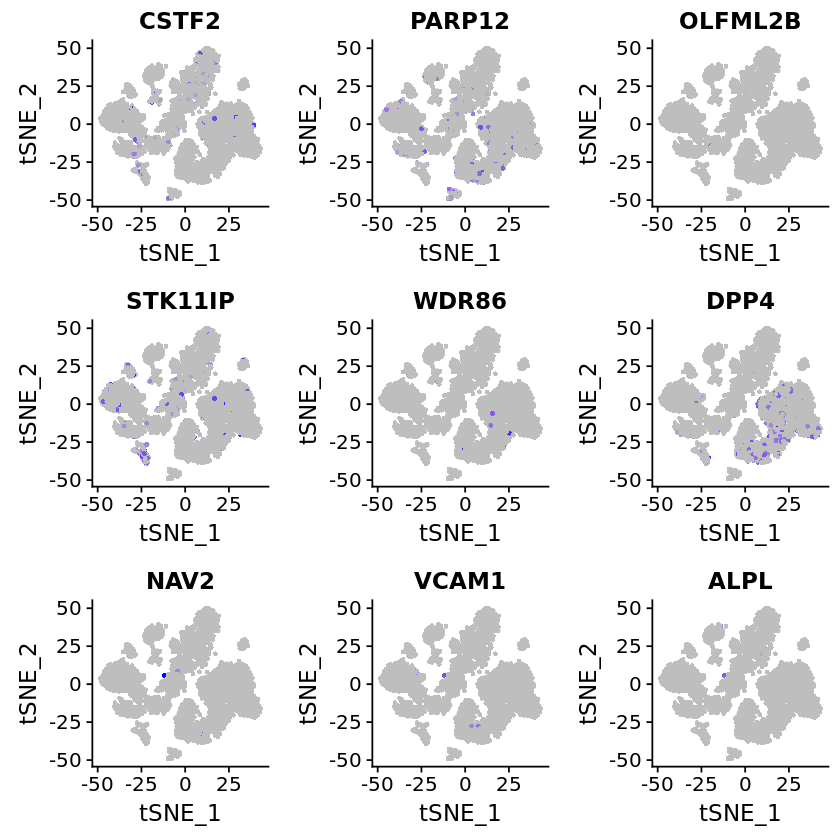

In [96]:
FeaturePlot(object = cells, features.plot = cand_ghaz1, cols.use = c("grey", "blue"), reduction.use = "tsne")

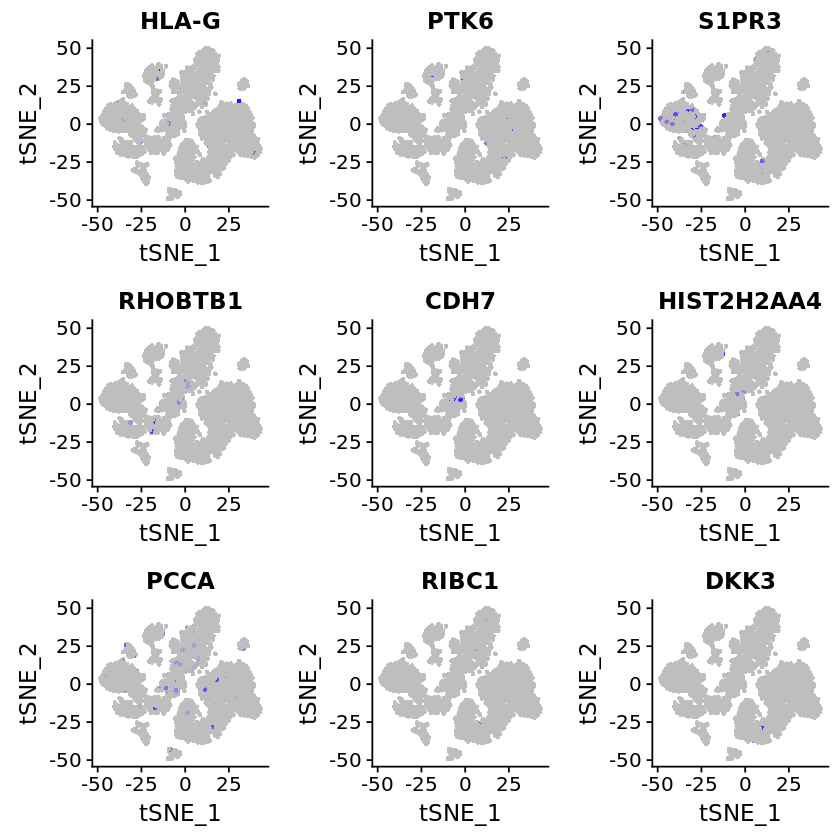

In [97]:
FeaturePlot(object = cells, features.plot = cand_ghaz2, cols.use = c("grey", "blue"), reduction.use = "tsne")

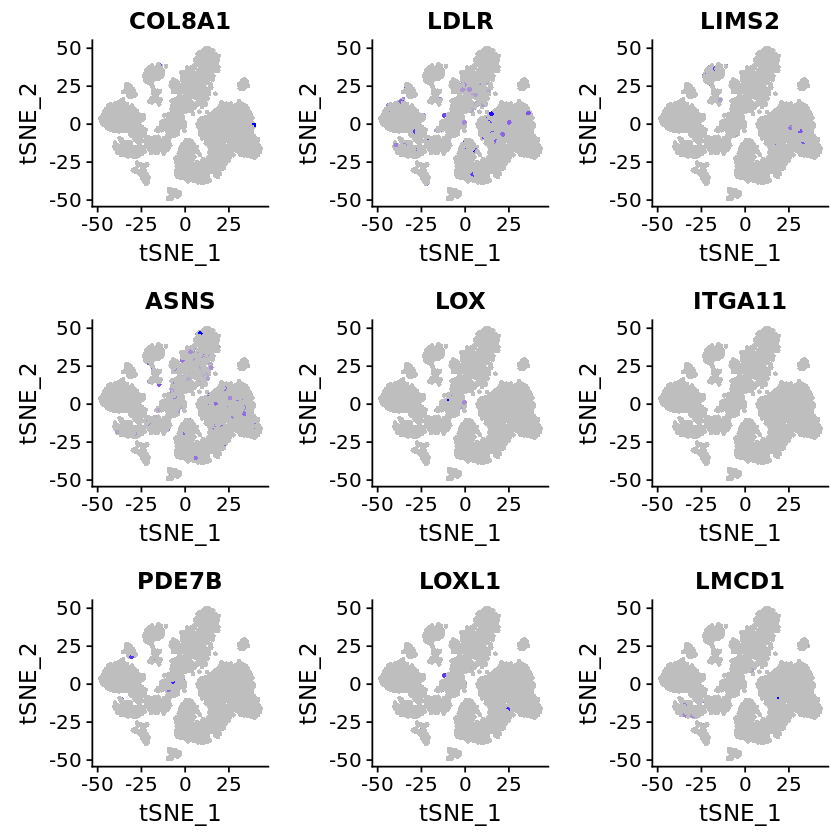

In [98]:
FeaturePlot(object = cells, features.plot = cand_ghaz3, cols.use = c("grey", "blue"), reduction.use = "tsne")

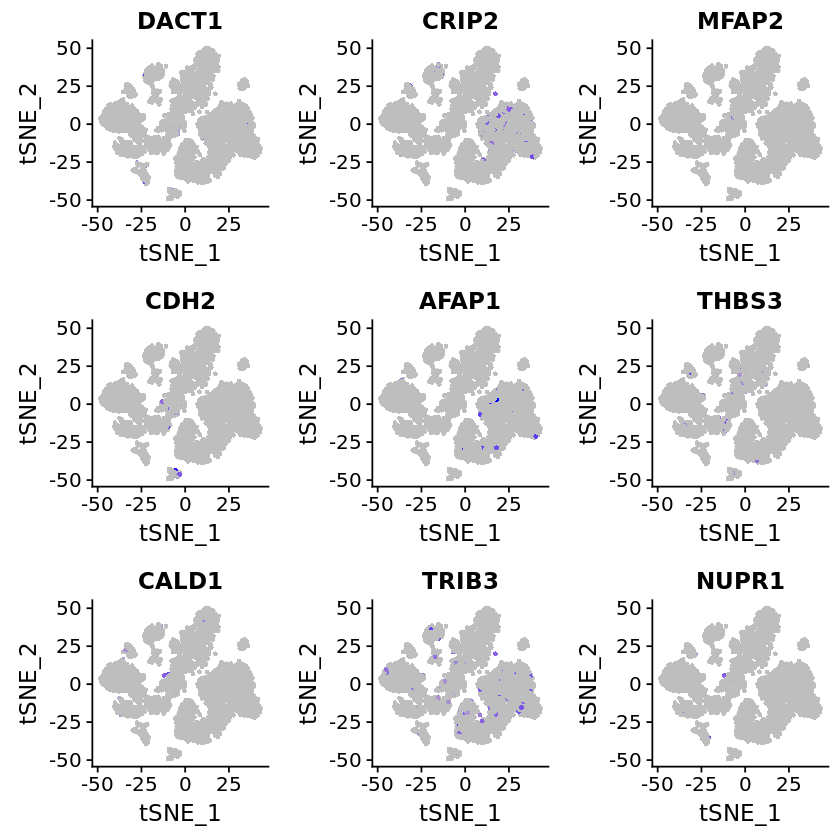

In [99]:
FeaturePlot(object = cells, features.plot = cand_ghaz4, cols.use = c("grey", "blue"), reduction.use = "tsne")

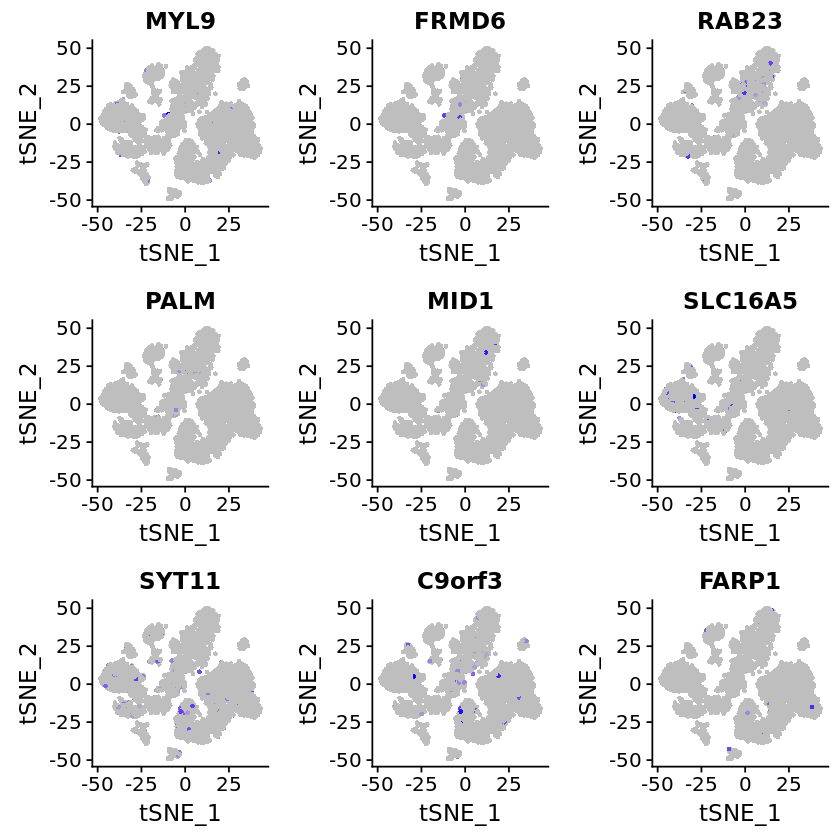

In [100]:
FeaturePlot(object = cells, features.plot = cand_ghaz5, cols.use = c("grey", "blue"), reduction.use = "tsne")

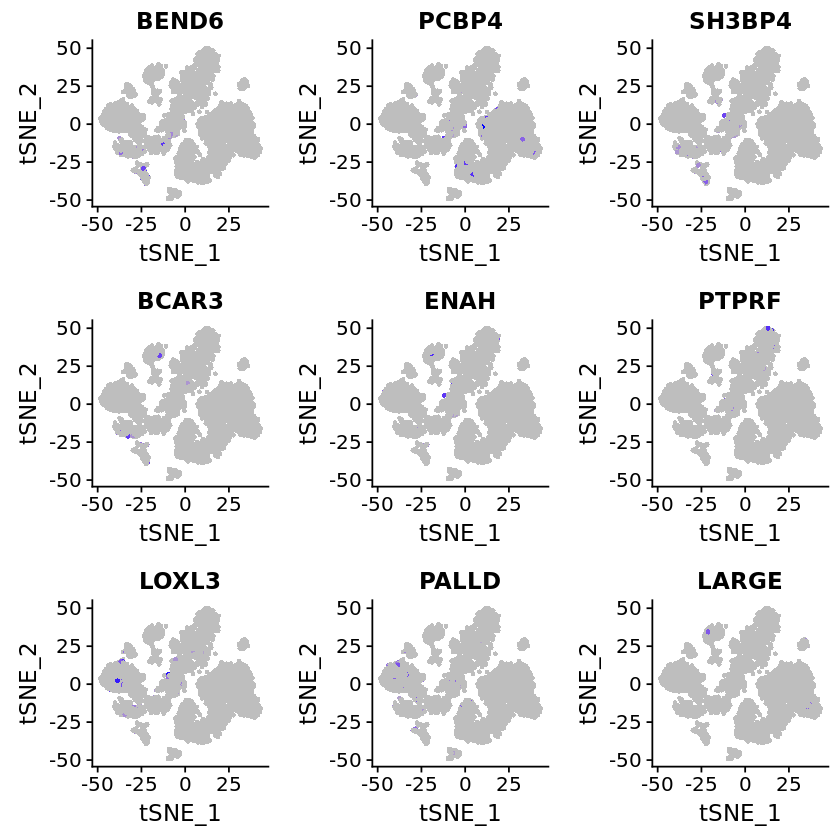

In [101]:
FeaturePlot(object = cells, features.plot = cand_ghaz6, cols.use = c("grey", "blue"), reduction.use = "tsne")

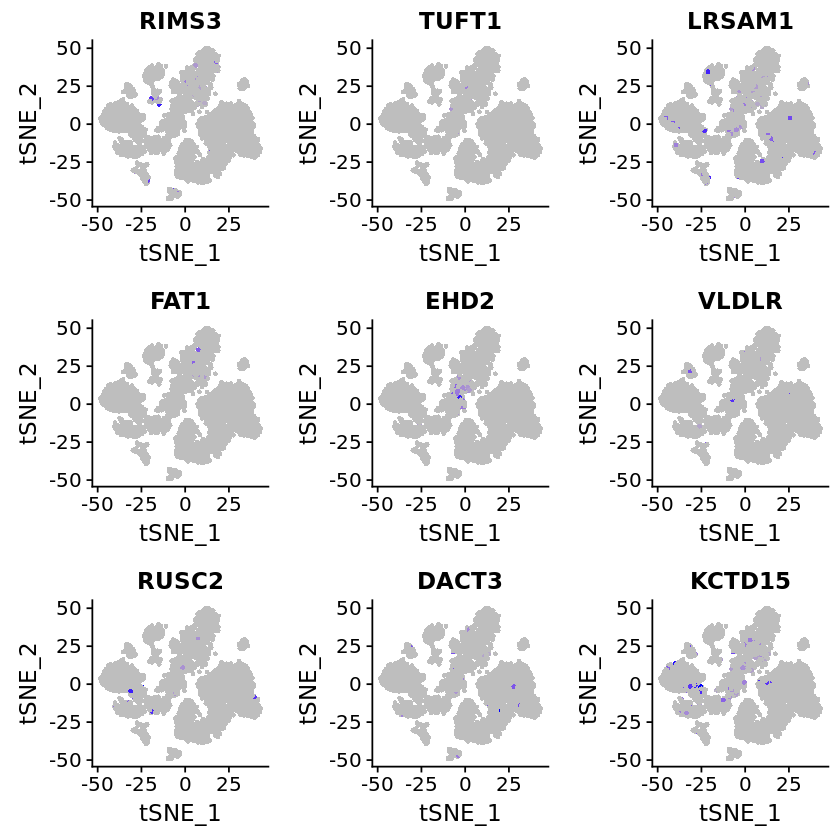

In [102]:
FeaturePlot(object = cells, features.plot = cand_ghaz7, cols.use = c("grey", "blue"), reduction.use = "tsne")

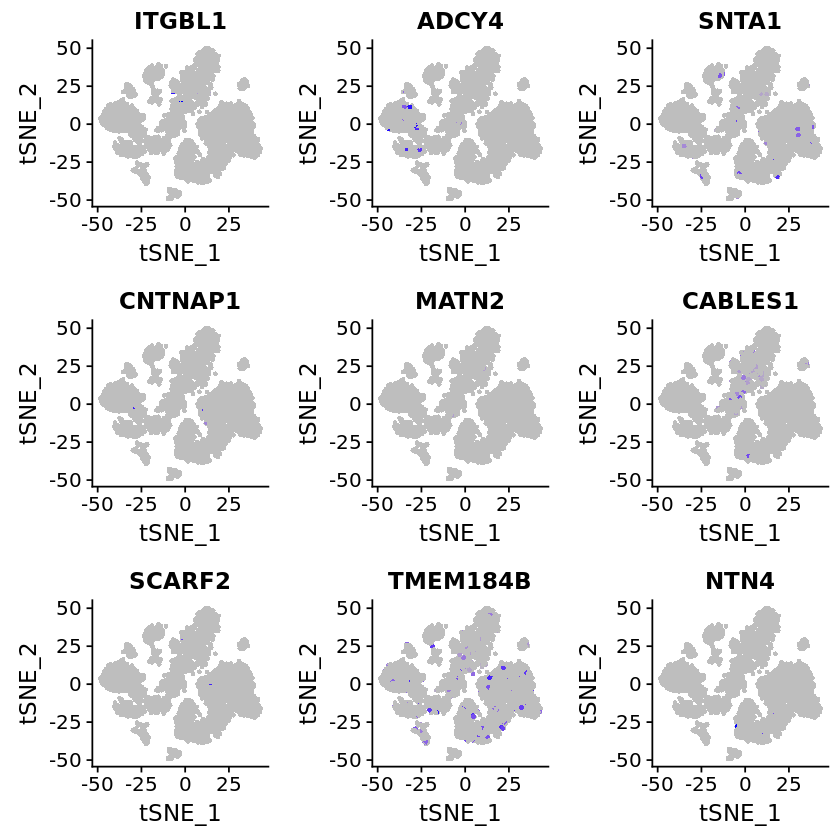

In [103]:
FeaturePlot(object = cells, features.plot = cand_ghaz8, cols.use = c("grey", "blue"), reduction.use = "tsne")

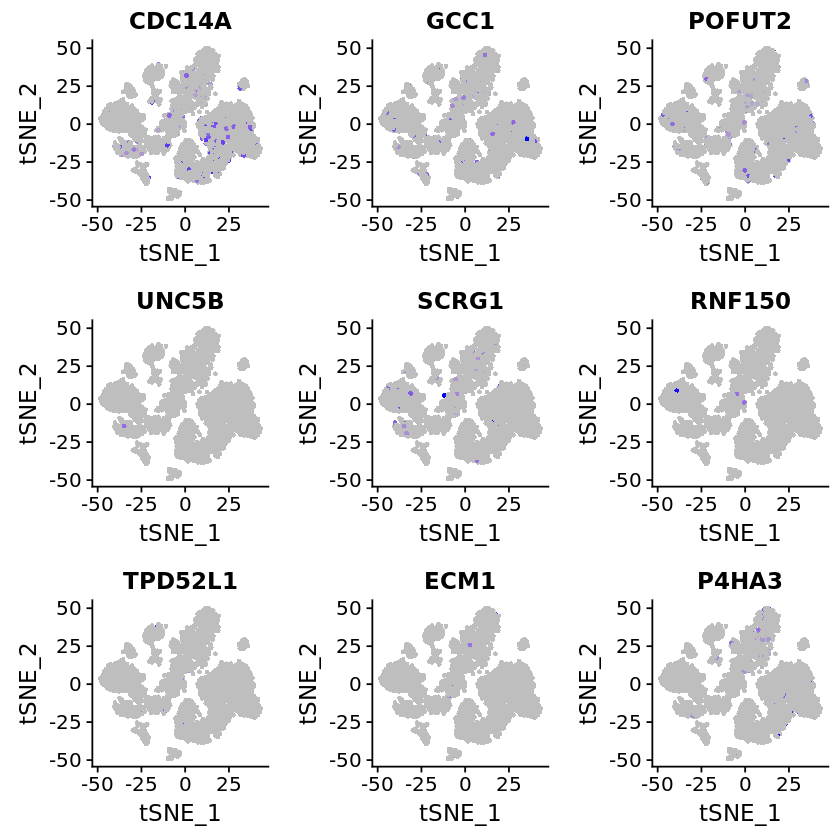

In [104]:
FeaturePlot(object = cells, features.plot = cand_ghaz9, cols.use = c("grey", "blue"), reduction.use = "tsne")

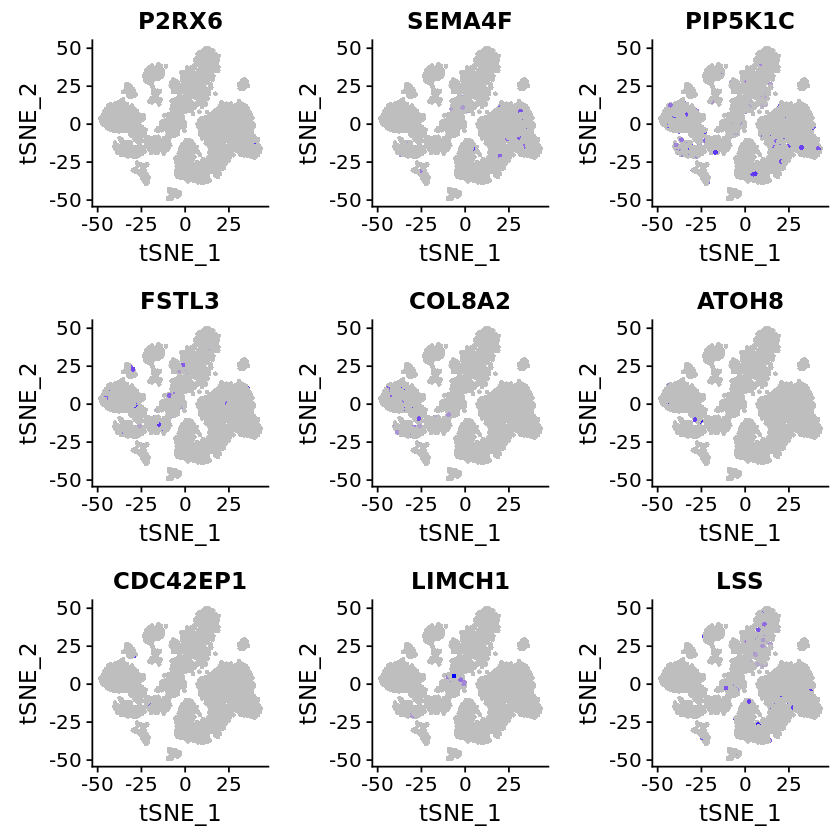

In [105]:
FeaturePlot(object = cells, features.plot = cand_ghaz10, cols.use = c("grey", "blue"), reduction.use = "tsne")

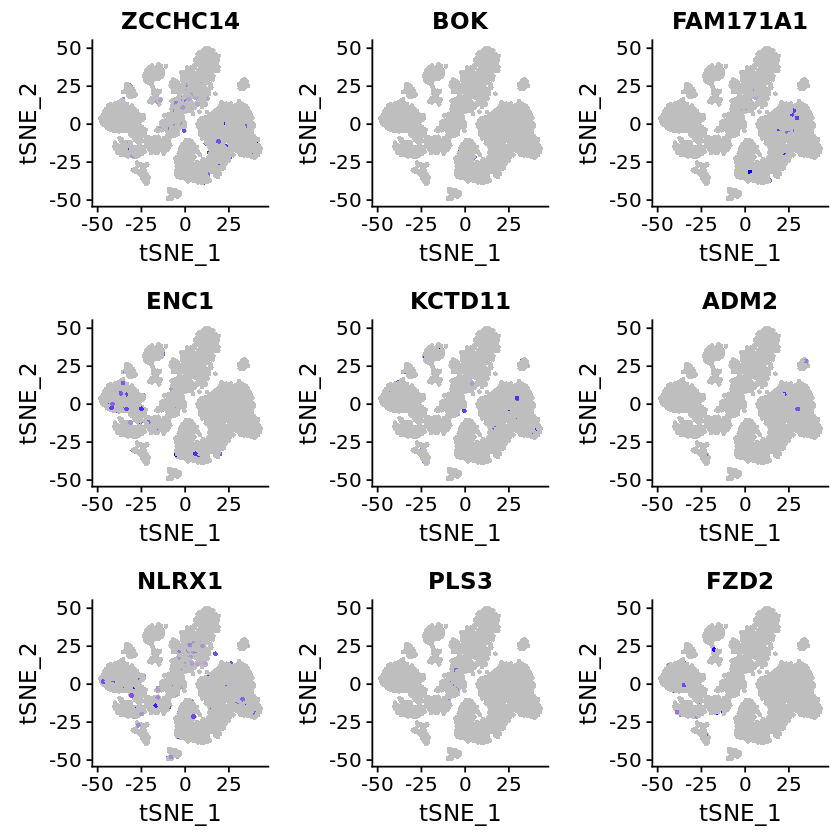

In [106]:
FeaturePlot(object = cells, features.plot = cand_ghaz11, cols.use = c("grey", "blue"), reduction.use = "tsne")

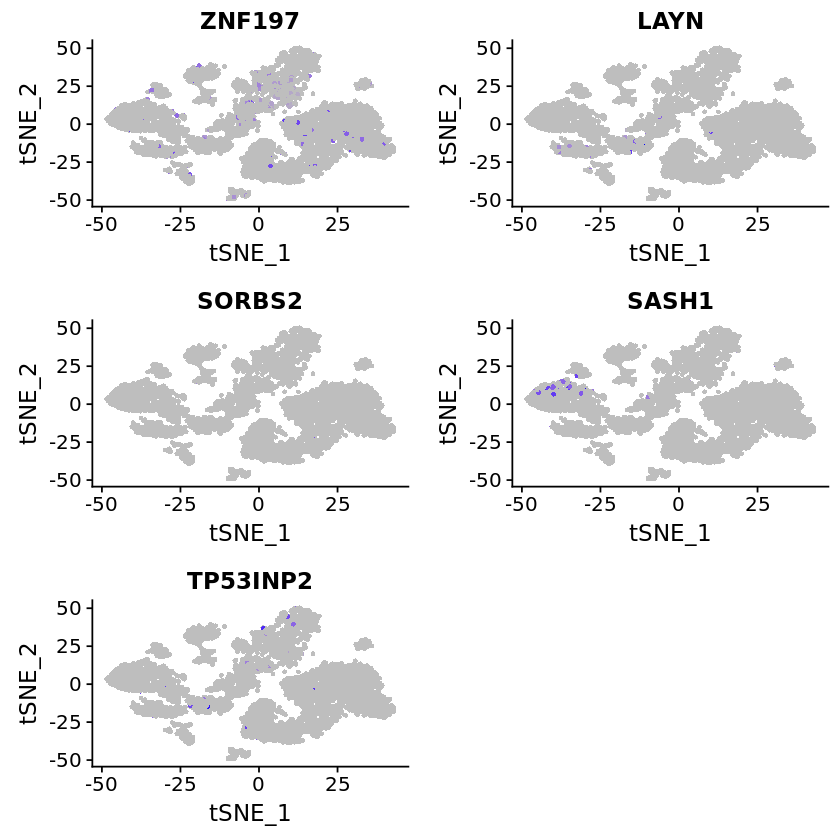

In [107]:
FeaturePlot(object = cells, features.plot = cand_ghaz12, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [100]:
#write.csv(ghaz_c3c5.clustexp.df, file = "BMAC_noJTW02_ghazc3c5.csv")

## Ghazanfari genes that mark MSCs (from BMAC_MSC_noJTW02 notebook)

In [225]:
# updated list applying looser criteria
cand_ghaz_updated <- c('SLC7A2', 'GLDN', 'CSTF2', 'PARP12', 'C1QTNF1', 'OLFML2B', 'STK11IP', 'WDR86', 'DPP4', 'NAV2', 'VCAM1', 'EGR1', 'ALPL', 'HLA-G', 'PDGFRA', 'PTK6', 'S1PR3', 'RHOBTB1', 'CDH7', 'HIST2H2AA4', 'PPARG', 'PCCA', 'RIBC1', 'DKK3', 'COL8A1', 'LDLR', 'LIMS2', 'STC2', 'POSTN', 'LOX', 'ITGA11', 'PDE7B', 'PSAT1', 'COL12A1', 'KRT7', 'HAPLN1', 'LOXL1', 'LMCD1', 'COL1A2', 'DACT1', 'HAS1', 'CRYAB', 'FLNC', 'COL5A2', 'CRABP2', 'CRIP2', 'MFAP2', 'CDH2', 'SDC2', 'CNN1', 'PPP1R3C', 'COL1A1', 'FOXD1', 'AFAP1', 'THBS3', 'COL4A1', 'CALD1', 'TRIB3', 'NUPR1', 'MFAP5', 'MYL9', 'FRMD6', 'TUBB2B', 'HSPB7', 'PALM', 'MID1', 'SLC16A5', 'CBS', 'FLRT2', 'COL5A1', 'DPYSL3', 'SYT11', 'C9orf3', 'FARP1', 'BEND6', 'PCBP4', 'SH3BP4', 'BCAR3', 'ENAH', 'TULP4', 'PTPRF', 'ALPK2', 'NUAK1', 'LOXL3', 'PALLD', 'LYPD1', 'FAM69A', 'LARGE', 'RIMS3', 'TUFT1', 'KCNK2', 'LRSAM1', 'FAT1', 'EFS', 'TP53I11', 'COMP', 'LMOD1', 'EHD2', 'SLIT3', 'TRNP1', 'VLDLR', 'RUSC2', 'DACT3', 'KCTD15', 'GREM1', 'CBR3', 'CPA4', 'ITGBL1', 'ADCY4', 'LRRC15', 'FNDC1', 'SNTA1', 'COPZ2', 'CNTNAP1', 'FBXL7', 'MATN2', 'KRT81', 'HAS3', 'LRRC32', 'SCARF2', 'LYPD6B', 'TMEM184B', 'COL4A2', 'NTN4', 'CDC14A', 'NTM', 'GCC1', 'HSPB2', 'POFUT2', 'UNC5B', 'SCRG1', 'INHBE', 'FAM180A', 'TPM2', 'RNF150', 'PENK', 'TPD52L1', 'PTN', 'ECM1', 'P4HA3', 'P2RX6', 'SEMA4F', 'CRLF1', 'PIP5K1C', 'FSTL3', 'MCAM', 'GPR1', 'HSPB8', 'COL8A2', 'ATOH8', 'BAMBI', 'CDC42EP1', 'LIMCH1', 'PXDN', 'CAP2', 'THY1', 'EYA2', 'LSS', 'ZCCHC14', 'BOK', 'FAM171A1', 'KCNMA1', 'PARVA', 'LMF1', 'CTGF', 'ENC1', 'COL16A1', 'KCTD11', 'CSPG4', 'SLC1A4', 'MET', 'TMEM47', 'ADM2', 'NLRX1', 'BGN', 'PLS3', 'ISLR', 'FZD2', 'IL11', 'ZNF197', 'LAYN', 'ABI3BP', 'SORBS2', 'SASH1', 'TP53INP2')

In [226]:
length(cand_ghaz_updated)
cand_ghaz_updated_in <- cand_ghaz_updated[which(cand_ghaz_updated %in% rownames(cells@scale.data))]
length(cand_ghaz_updated_in)

[1] 185

[1] 116

In [227]:
cand_ghaz_updated_in

[1] "CSTF2"      "PARP12"     "OLFML2B"    "STK11IP"    "WDR86"     
  [6] "DPP4"       "NAV2"       "VCAM1"      "EGR1"       "ALPL"      
 [11] "HLA-G"      "PTK6"       "S1PR3"      "RHOBTB1"    "CDH7"      
 [16] "HIST2H2AA4" "PCCA"       "RIBC1"      "DKK3"       "COL8A1"    
 [21] "LDLR"       "LIMS2"      "LOX"        "ITGA11"     "PDE7B"     
 [26] "PSAT1"      "LOXL1"      "LMCD1"      "DACT1"      "CRIP2"     
 [31] "MFAP2"      "CDH2"       "AFAP1"      "THBS3"      "CALD1"     
 [36] "TRIB3"      "NUPR1"      "MYL9"       "FRMD6"      "PALM"      
 [41] "MID1"       "SLC16A5"    "COL5A1"     "SYT11"      "C9orf3"    
 [46] "FARP1"      "BEND6"      "PCBP4"      "SH3BP4"     "BCAR3"     
 [51] "ENAH"       "TULP4"      "PTPRF"      "LOXL3"      "PALLD"     
 [56] "FAM69A"     "LARGE"      "RIMS3"      "TUFT1"      "LRSAM1"    
 [61] "FAT1"       "TP53I11"    "EHD2"       "VLDLR"      "RUSC2"     
 [66] "DACT3"      "KCTD15"     "CBR3"       "ITGBL1"     "ADCY4"     
 [71] "SNTA1"      "COPZ2"      "CNTNAP1"    "MATN2"      "SCARF2"    
 [76] "LYPD6B"     "TMEM184B"   "NTN4"       "CDC14A"     "GCC1"      
 [81] "POFUT2"     "UNC5B"      "SCRG1"      "TPM2"       "RNF150"    
 [86] "TPD52L1"    "ECM1"       "P4HA3"      "P2RX6"      "SEMA4F"    
 [91] "PIP5K1C"    "FSTL3"      "COL8A2"     "ATOH8"      "CDC42EP1"  
 [96] "LIMCH1"     "PXDN"       "LSS"        "ZCCHC14"    "BOK"       
[101] "FAM171A1"   "KCNMA1"     "LMF1"       "CTGF"       "ENC1"      
[106] "KCTD11"     "SLC1A4"     "ADM2"       "NLRX1"      "PLS3"      
[111] "FZD2"       "ZNF197"     "LAYN"       "SORBS2"     "SASH1"     
[116] "TP53INP2"

In [224]:
# Are the 42 genes previously subsetted in cand_ghaz_updated_in?
ghaz_42genes <- c("VCAM1", "PDGFRA", "COL8A1", "STC2", "POSTN", "LOX", "ITGA11", "PSAT1", "COL12A1", "LOXL1", "COL1A2", "CRYAB", "COL5A2", "CRIP2", "CDH2", "SDC2", "COL1A1", "COL4A1", "CALD1", "NUPR1", "MFAP5", "MYL9", "FRMD6", "COL5A1", "DPYSL3", "ENAH", "PALLD", "COMP", "SLIT3", "ITGBL1", "FNDC1", "COL4A2", "NTM", "PENK", "PTN", "PXDN", "THY1", "PARVA", "CTGF", "COL16A1", "BGN", "ISLR")
length(which(ghaz_42genes %in% cand_ghaz_updated_in))

[1] 18

In [116]:
rownames(candidate_ghazgenes)[which(!(rownames(candidate_ghazgenes) %in% cand_ghaz_updated_in))]

[1] "ASNS"    "RAB23"   "CABLES1"

# Cells expressing Ghazanfari et al. cluster 3 and 5 genes
* List of candidate transcripts pruned to 116 from 396. Most genes were not expressed in any of the cells.
* gene list stored in "cand_ghaz_updated_in" variable

In [232]:
ghaz_c3c5_all.exp <- cells@data[cand_ghaz_updated_in, ]
dim(ghaz_c3c5_all.exp)

[1]  116 9301

In [233]:
ghaz_c3c5.exp <- matrix(0, nrow = 116, ncol = 2)
row.names(ghaz_c3c5.exp) <- c(0:115)
colnames(ghaz_c3c5.exp) <- c("Percent genes expressed (<=)", "Total cells") 
ghaz_c3c5.exp[,1] <- c(116:1)/116
ghaz_c3c5.exp

,Percent genes expressed (<=),Total cells
0,1.0000000,0
1,0.9913793,0
2,0.9827586,0
3,0.9741379,0
4,0.9655172,0
5,0.9568966,0
6,0.9482759,0
7,0.9396552,0
8,0.9310345,0
9,0.9224138,0


In [44]:
ghaz_c3c5.ct <- matrix(0, nrow = 0, ncol = 12)
colnames(ghaz_c3c5.ct) <- c("T Cells", "NK Cells", "B Cells", "Erythrocytes", "Pre-B Cells", 
                      "CD34+ Progenitors", "Monocytes", "FCGR3A+ Monocytes", "Neutrophils", 
                      "B Lymphocytes", "Mature B Lymphocytes", "Monocytes/Dendritic Cells")
ghaz_c3c5.ct

T Cells,NK Cells,B Cells,Erythrocytes,Pre-B Cells,CD34+ Progenitors,Monocytes,FCGR3A+ Monocytes,Neutrophils,B Lymphocytes,Mature B Lymphocytes,Monocytes/Dendritic Cells


In [234]:
length(unique(cells@meta.data$res.0.6))

[1] 17

In [236]:
# run on 2/14/19 - change to cluster name instead of cell type
ghaz_c3c5.ct <- matrix(0, nrow = 0, ncol = 17)
colnames(ghaz_c3c5.ct) <- c(0:16)
ghaz_c3c5.ct

0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16


In [237]:
ghaz_c3c5_all.exp_zeros <- colSums(ghaz_c3c5_all.exp == 0)

In [238]:
total_counts.ghaz_c3c5 <- c()
for (n in 0:115) {
    tmp <- which(ghaz_c3c5_all.exp_zeros <= n)
    total_counts.ghaz_c3c5 <- c(total_counts.ghaz_c3c5, length(tmp))
    #tmp2 <- data.frame(table(factor(cells@meta.data[tmp, "new.ident"], levels = unique(cells@meta.data$new.ident))))
    tmp2 <- data.frame(table(factor(cells@meta.data[tmp, "res.0.6"], levels = unique(cells@meta.data$res.0.6))))
    names <- tmp2$Var1
    tmp2.df <- as.data.frame(t(tmp2[,"Freq"]))
    colnames(tmp2.df) <- names
    rownames(tmp2.df) <- n
    ghaz_c3c5.ct <- rbind(ghaz_c3c5.ct, tmp2.df)
}

In [239]:
ghaz_c3c5.exp[,2] <- total_counts.ghaz_c3c5

In [240]:
ghaz_c3c5.exp

,Percent genes expressed (<=),Total cells
0,1.0000000,0
1,0.9913793,0
2,0.9827586,0
3,0.9741379,0
4,0.9655172,0
5,0.9568966,0
6,0.9482759,0
7,0.9396552,0
8,0.9310345,0
9,0.9224138,0


In [241]:
ghaz_c3c5.ct

,1,2,11,10,4,3,6,7,15,5,0,14,8,13,16,9,12
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [242]:
ghaz_c3c5.table <- cbind(ghaz_c3c5.exp, ghaz_c3c5.ct)
ghaz_c3c5.table

,Percent genes expressed (<=),Total cells,1,2,11,10,4,3,6,7,15,5,0,14,8,13,16,9,12
0,1.0000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0.9913793,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0.9827586,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0.9741379,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0.9655172,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0.9568966,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0.9482759,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0.9396552,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0.9310345,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0.9224138,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [243]:
write.table(ghaz_c3c5.table, file = "BMAC_noJTW02_Ghazc3c5_counts.txt", quote = FALSE, 
            sep = "\t", row.names = FALSE, col.names = TRUE)

In [255]:
ghaz_c3c5.expgenes <- which(ghaz_c3c5_all.exp_zeros <= 106)

In [256]:
cells@meta.data$Ghaz_c3c5_lib <- rep("no", nrow(cells@meta.data))
cells@meta.data[ghaz_c3c5.expgenes,]$Ghaz_c3c5_lib <- rep("yes", length(ghaz_c3c5.expgenes))
table(cells@meta.data$Ghaz_c3c5_lib)


  no  yes 
9284   17 

In [258]:
# Select set of genes
p <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Ghaz_c3c5_lib", pt.size = 0.05, do.return = TRUE,
             plot.order = "yes", cols.use = c("light grey", "blue"), no.legend = TRUE)
tiff(filename = "20190214_Figures/Fig2_ghazc3c5_lib_10-116.tiff",
    width = 1500, height = 1500, units = "px", res = 300)
plot(p)
dev.off()

png 
  2

In [254]:
# Expressing all genes (all grey) set which(ghaz_c3c5_all.exp_zeros <= 0)
p <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Ghaz_c3c5_lib", pt.size = 0.05, do.return = TRUE,
             plot.order = "no", cols.use = c("light grey"), no.legend = TRUE)
tiff(filename = "20190214_Figures/Fig2_ghazc3c5_31-116.tiff",
    width = 1500, height = 1500, units = "px", res = 300)
plot(p)
dev.off()

png 
  2

In [262]:
# must establish pos_mscs
pos_mscs
ghazc3c5_lib <- ghaz_c3c5.expgenes

[1] "AGGGTGAAGCACCGCT-2" "TTTACTGGTAATCACC-2" "ACGCCGACAGGTGCCT-3"
 [4] "GTCAAGTTCAGCTGGC-3" "GTGGGTCAGACGACGT-3" "CCGGTAGGTTAAGTAG-4"
 [7] "GACTGCGTCTACCAGA-4" "AAATGCCCACCTGGTG-5" "CACAGGCTCAGAGCTT-7"
[10] "CGACTTCGTGCTAGCC-7" "CGACCTTGTCTAGTGT-9"

In [263]:
cells@meta.data$Ghazc3c5_lib <- rep("no", nrow(cells@meta.data))
cells@meta.data[ghazc3c5_lib,]$Ghazc3c5_lib <- rep("yes", length(ghazc3c5_lib))
table(cells@meta.data$Ghazc3c5_lib)
table(cells@meta.data[ghazc3c5_lib,]$library_id)


  no  yes 
9284   17 


JTW03 JTW05 JTW06 JTW07 JTW10  MG02 
    3     7     2     2     2     1 

In [264]:
cells@meta.data[pos_mscs,]$Ghazc3c5_lib
cells@meta.data[pos_mscs,]$Ghazc3c5_lib[c(1, 4, 5, 6, 11)]

[1] "yes" "no"  "no"  "yes" "yes" "yes" "no"  "no"  "no"  "no"  "yes"

[1] "yes" "yes" "yes" "yes" "yes"

In [265]:
# Change index of 2nd line to match "yes"
cells@meta.data[pos_mscs,]$Ghazc3c5_lib <- rep("Possible MSCs", length(cells@meta.data[pos_mscs,]$Dom_lib))
cells@meta.data[pos_mscs,]$Ghazc3c5_lib[c(1, 4, 5, 6, 11)] <- "Possible MSC + yes"
table(cells@meta.data$Ghazc3c5_lib)


                no Possible MSC + yes      Possible MSCs                yes 
              9278                  5                  6                 12 

In [267]:
#2/14/19 fig 3s
pjia <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Ghazc3c5_lib", pt.size = 0.05, do.return = TRUE,
                plot.order = c("yes", "no", "Possible MSCs", "Possible MSC + yes"), cols.use = c("red", "green", "light grey", "blue"), no.legend = TRUE)
        #plot.order = "yes", cols.use = c("green", "red", "light grey", "blue"))# + ggtitle("BMAC expressing 9/116 Ghazanfari et al. Cluster 3+5 genes")
#pjia <- pjia + theme(plot.title = element_text(size = 9))
tiff(filename = "20190214_Figures/Fig3_Ghazc3c5_liberal_withPosMSCs_10-116.tiff",
    width = 1500, height = 1500, units = "px", res = 300)
plot(pjia)
dev.off()

png 
  2

In [48]:
cand_ghaz1 <- c('CSTF2', 'PARP12', 'OLFML2B', 'STK11IP', 'WDR86', 'DPP4', 'NAV2', 'VCAM1', 'EGR1')
cand_ghaz2 <- c('ALPL', 'HLA-G', 'PTK6', 'S1PR3', 'RHOBTB1', 'CDH7', 'HIST2H2AA4', 'PCCA', 'RIBC1')
cand_ghaz3 <- c('DKK3', 'COL8A1', 'LDLR', 'LIMS2', 'LOX', 'ITGA11', 'PDE7B', 'PSAT1', 'LOXL1')
cand_ghaz4 <- c('LMCD1', 'DACT1', 'CRIP2', 'MFAP2', 'CDH2', 'AFAP1', 'THBS3', 'CALD1', 'TRIB3')
cand_ghaz5 <- c('NUPR1', 'MYL9', 'FRMD6', 'PALM', 'MID1', 'SLC16A5', 'COL5A1', 'SYT11', 'C9orf3')
cand_ghaz6 <- c('FARP1', 'BEND6', 'PCBP4', 'SH3BP4', 'BCAR3', 'ENAH', 'TULP4', 'PTPRF', 'LOXL3')
cand_ghaz7 <- c('PALLD', 'FAM69A', 'LARGE', 'RIMS3', 'TUFT1', 'LRSAM1', 'FAT1', 'TP53I11', 'EHD2')
cand_ghaz8 <- c('VLDLR', 'RUSC2', 'DACT3', 'KCTD15', 'CBR3', 'ITGBL1', 'ADCY4', 'SNTA1', 'COPZ2')
cand_ghaz9 <- c('CNTNAP1', 'MATN2', 'SCARF2', 'LYPD6B', 'TMEM184B', 'NTN4', 'CDC14A', 'GCC1', 'POFUT2')
cand_ghaz10 <- c('UNC5B', 'SCRG1', 'TPM2', 'RNF150', 'TPD52L1', 'ECM1', 'P4HA3', 'P2RX6', 'SEMA4F')
cand_ghaz11 <- c('PIP5K1C', 'FSTL3', 'COL8A2', 'ATOH8', 'CDC42EP1', 'LIMCH1', 'PXDN', 'LSS', 'ZCCHC14')
cand_ghaz12 <- c('BOK', 'FAM171A1', 'KCNMA1', 'LMF1', 'CTGF', 'ENC1', 'KCTD11', 'SLC1A4', 'ADM2')
cand_ghaz13 <- c('NLRX1', 'PLS3', 'FZD2', 'ZNF197', 'LAYN', 'SORBS2', 'SASH1', 'TP53INP2')

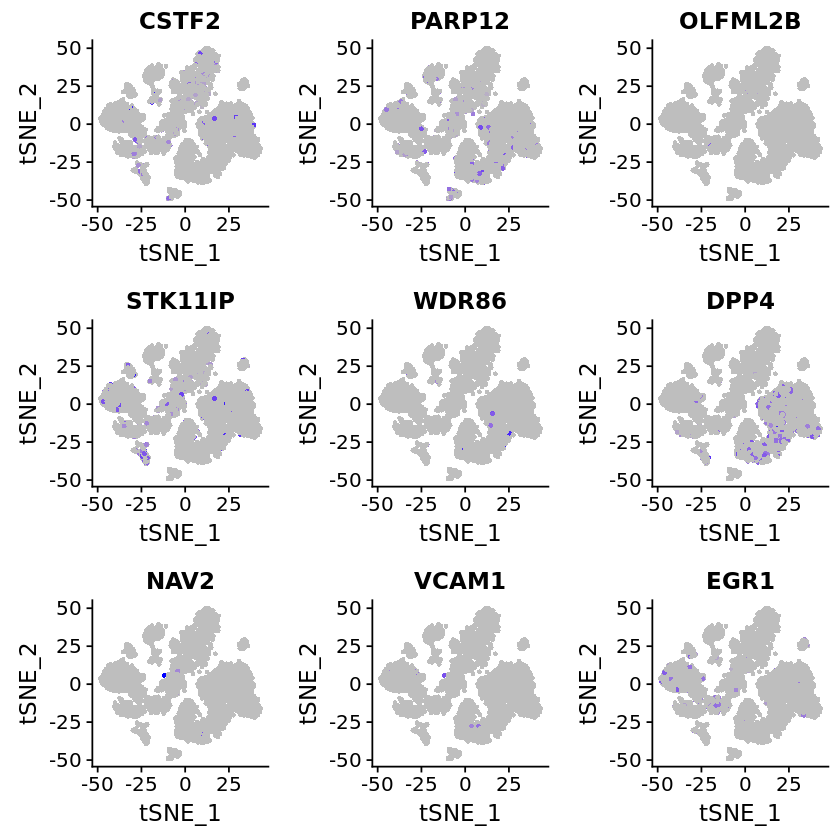

In [49]:
FeaturePlot(object = cells, features.plot = cand_ghaz1, cols.use = c("grey", "blue"), reduction.use = "tsne")

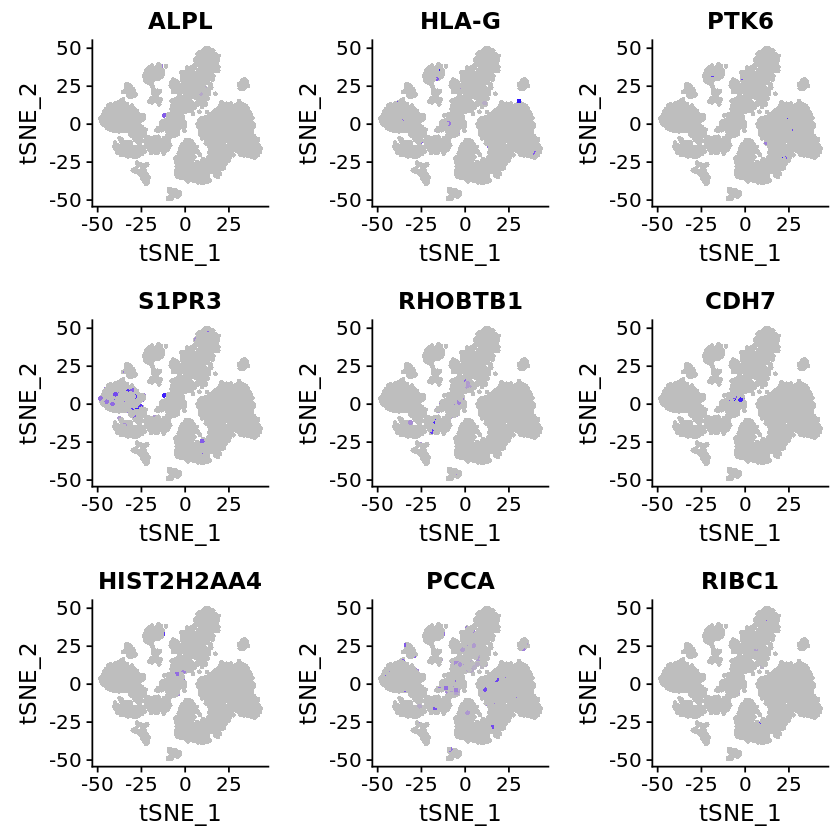

In [50]:
FeaturePlot(object = cells, features.plot = cand_ghaz2, cols.use = c("grey", "blue"), reduction.use = "tsne")

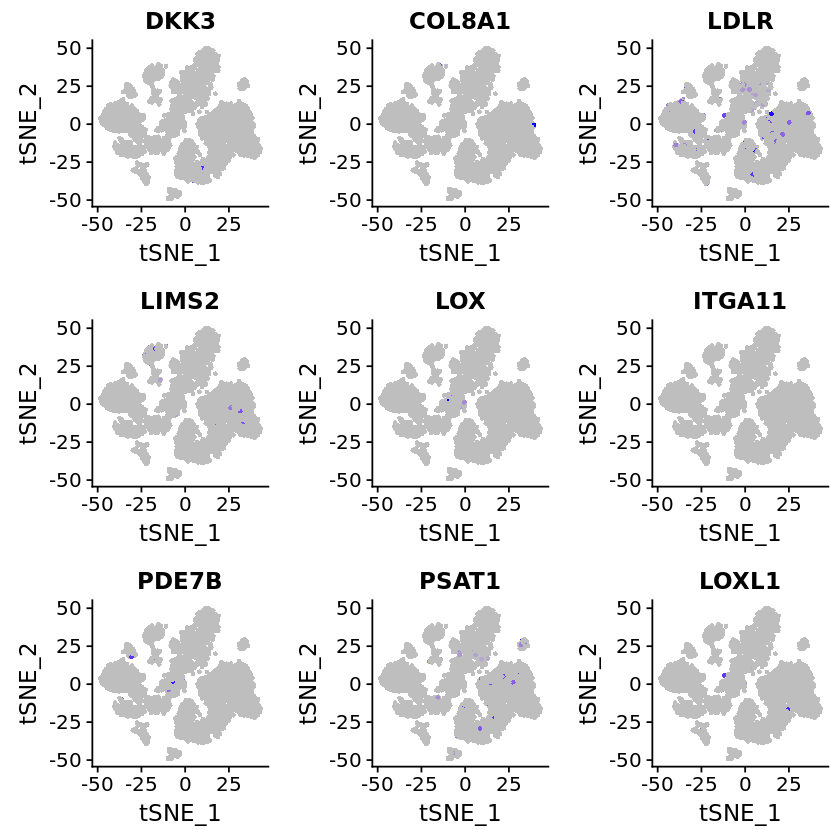

In [51]:
FeaturePlot(object = cells, features.plot = cand_ghaz3, cols.use = c("grey", "blue"), reduction.use = "tsne")

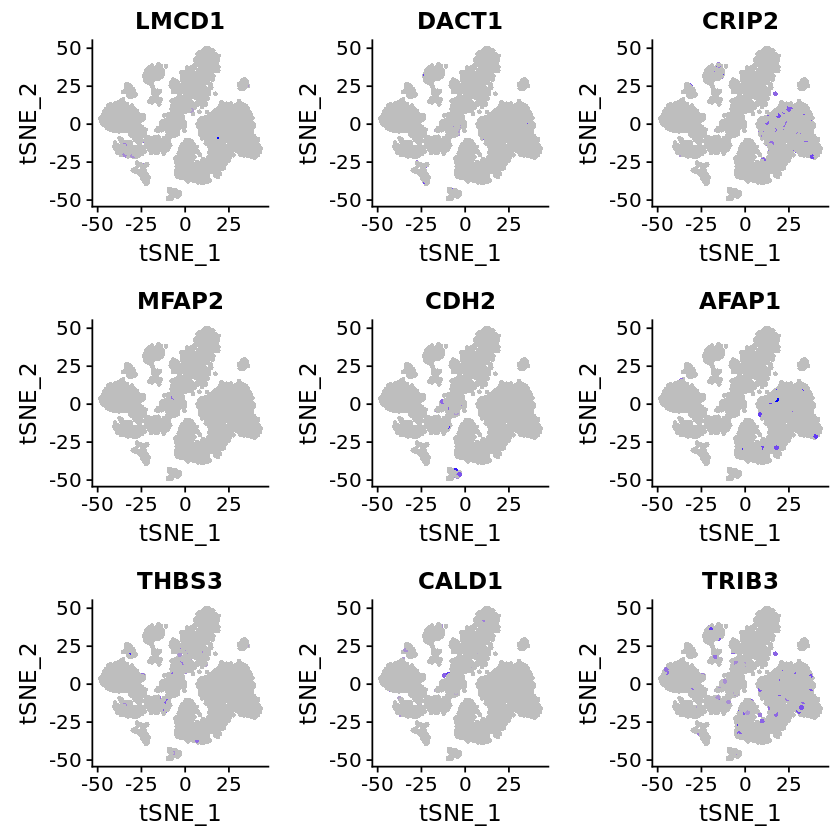

In [52]:
FeaturePlot(object = cells, features.plot = cand_ghaz4, cols.use = c("grey", "blue"), reduction.use = "tsne")

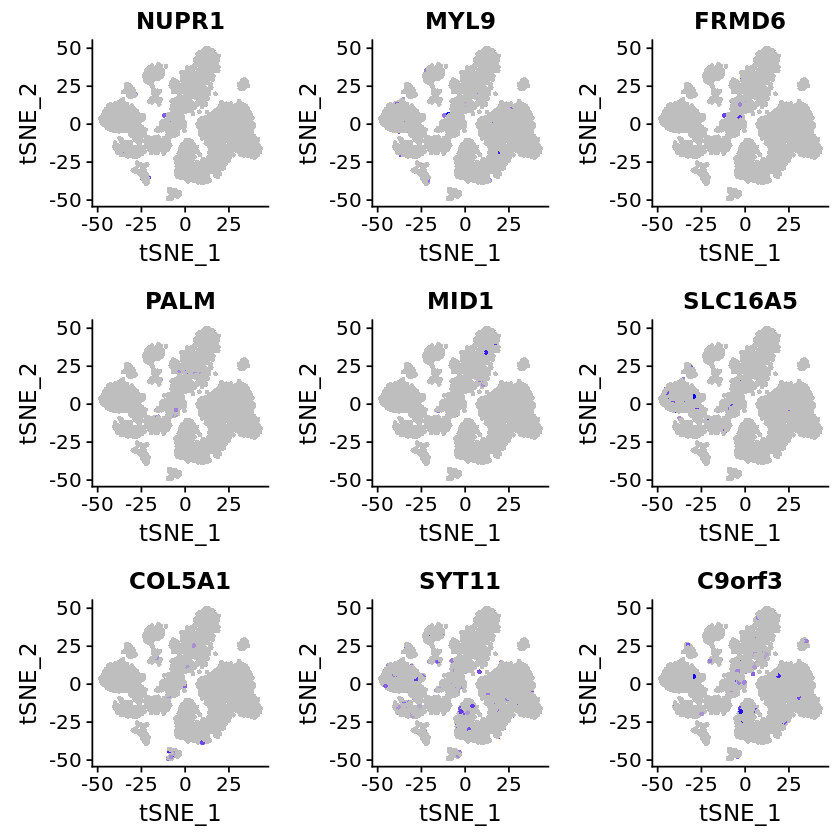

In [53]:
FeaturePlot(object = cells, features.plot = cand_ghaz5, cols.use = c("grey", "blue"), reduction.use = "tsne")

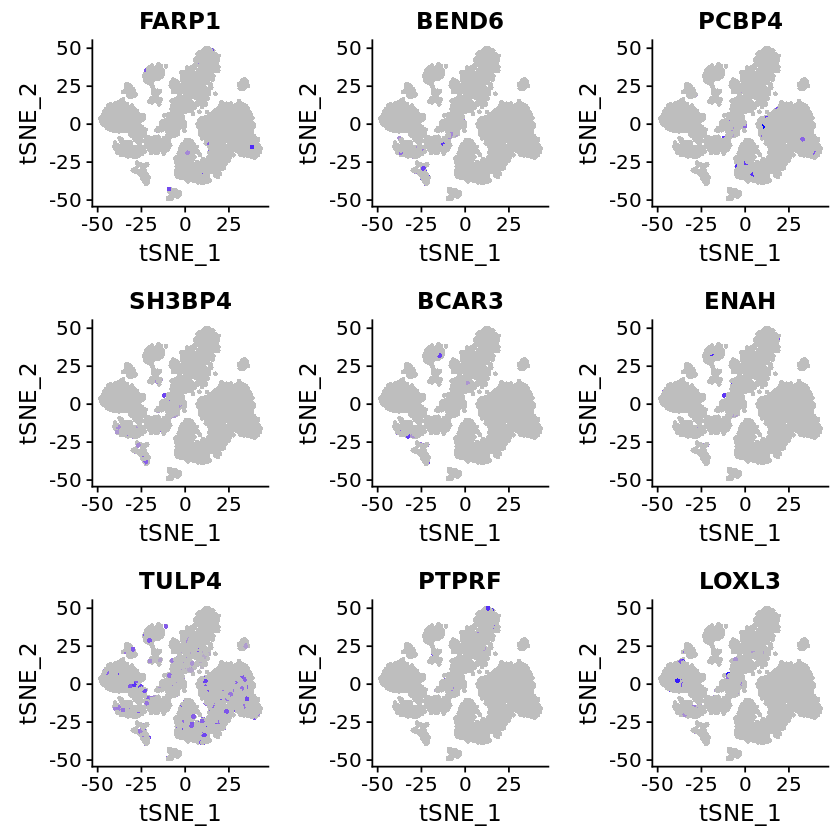

In [54]:
FeaturePlot(object = cells, features.plot = cand_ghaz6, cols.use = c("grey", "blue"), reduction.use = "tsne")

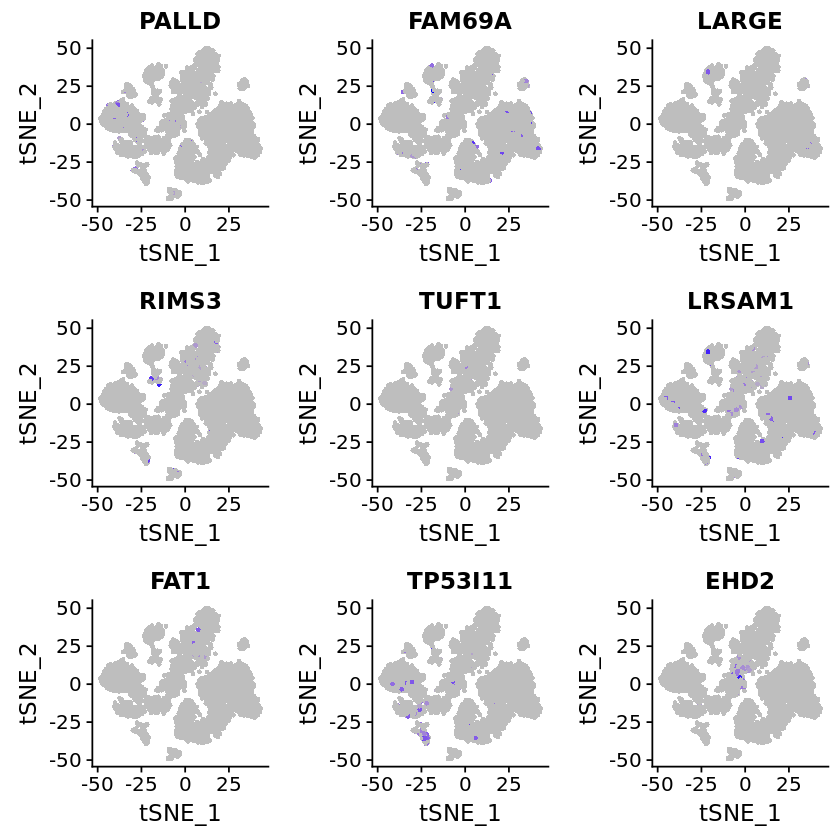

In [55]:
FeaturePlot(object = cells, features.plot = cand_ghaz7, cols.use = c("grey", "blue"), reduction.use = "tsne")

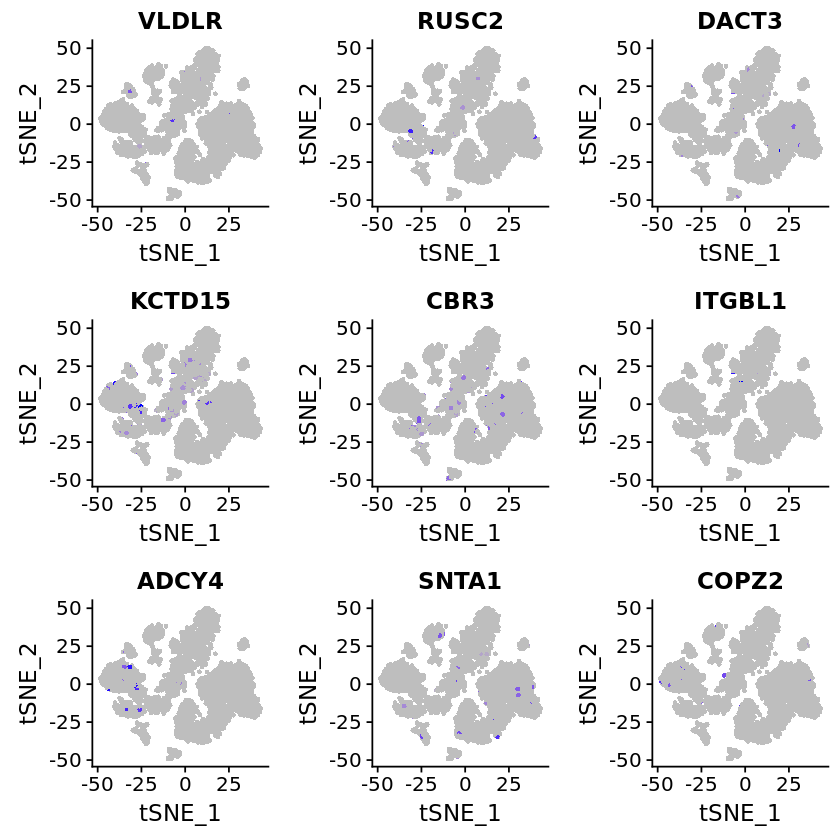

In [56]:
FeaturePlot(object = cells, features.plot = cand_ghaz8, cols.use = c("grey", "blue"), reduction.use = "tsne")

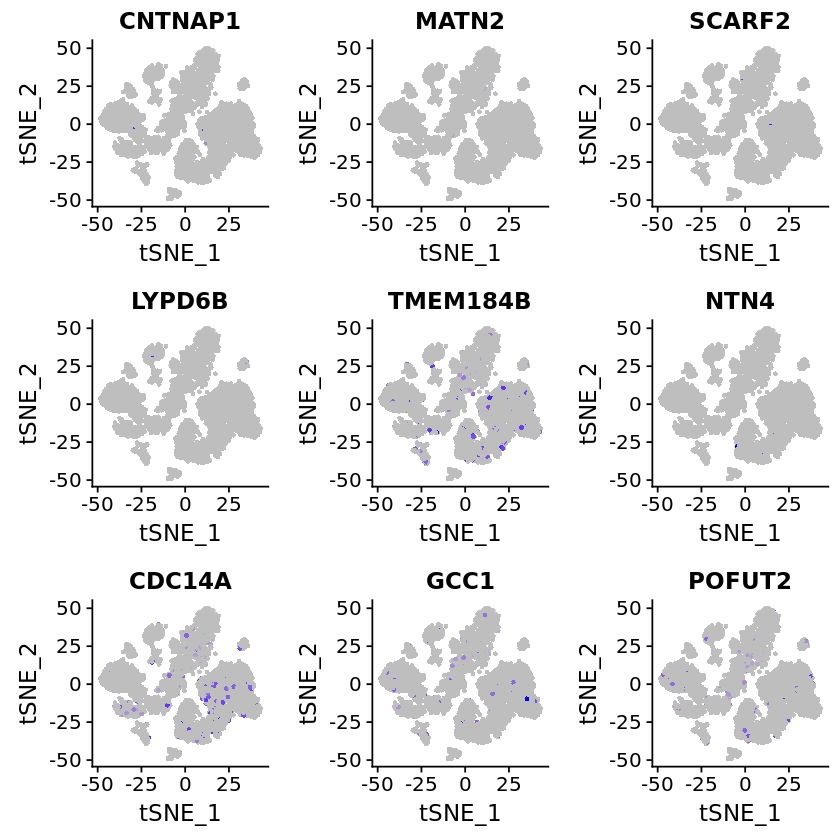

In [57]:
FeaturePlot(object = cells, features.plot = cand_ghaz9, cols.use = c("grey", "blue"), reduction.use = "tsne")

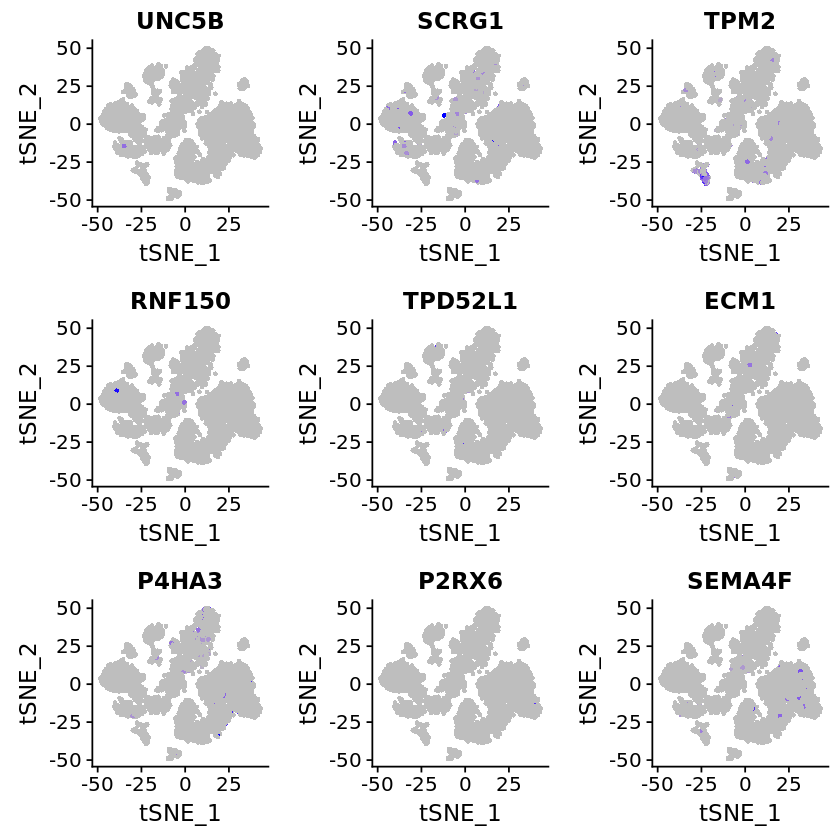

In [58]:
FeaturePlot(object = cells, features.plot = cand_ghaz10, cols.use = c("grey", "blue"), reduction.use = "tsne")

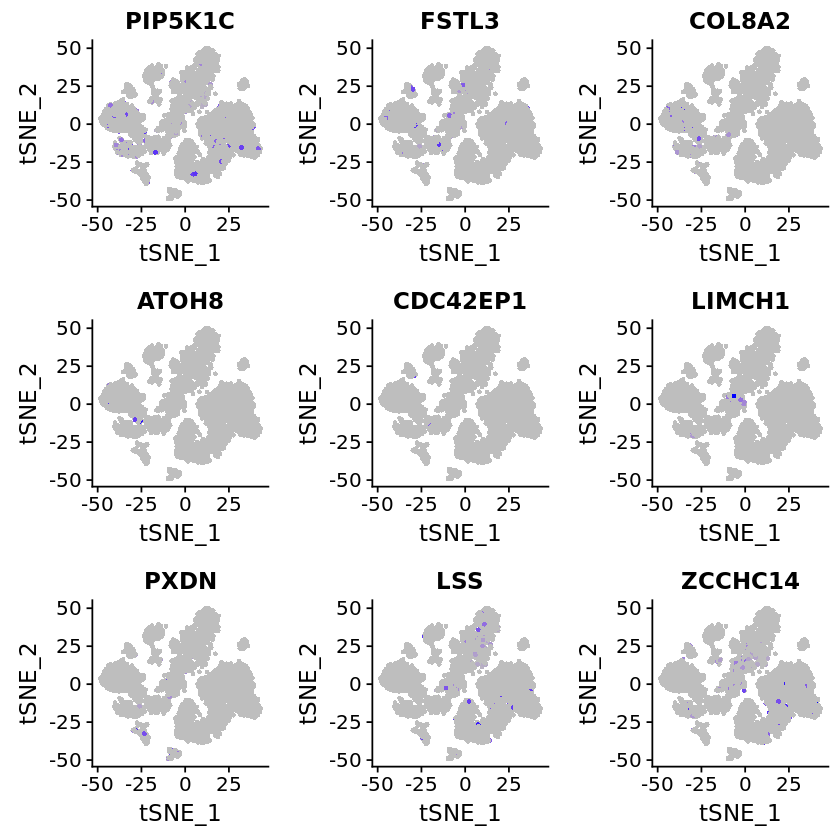

In [59]:
FeaturePlot(object = cells, features.plot = cand_ghaz11, cols.use = c("grey", "blue"), reduction.use = "tsne")

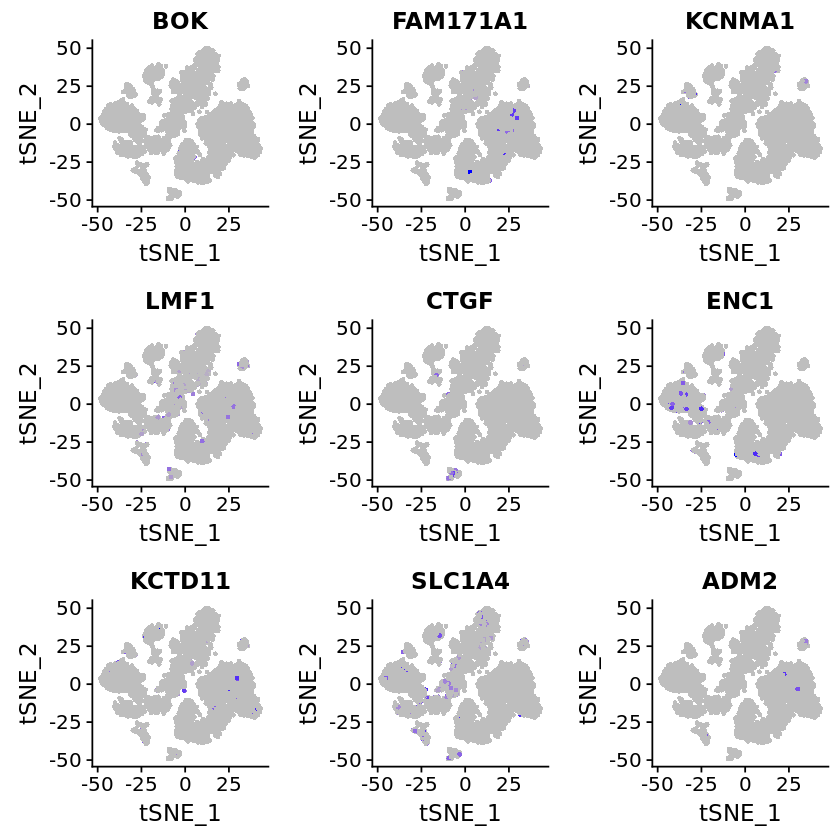

In [60]:
FeaturePlot(object = cells, features.plot = cand_ghaz12, cols.use = c("grey", "blue"), reduction.use = "tsne")

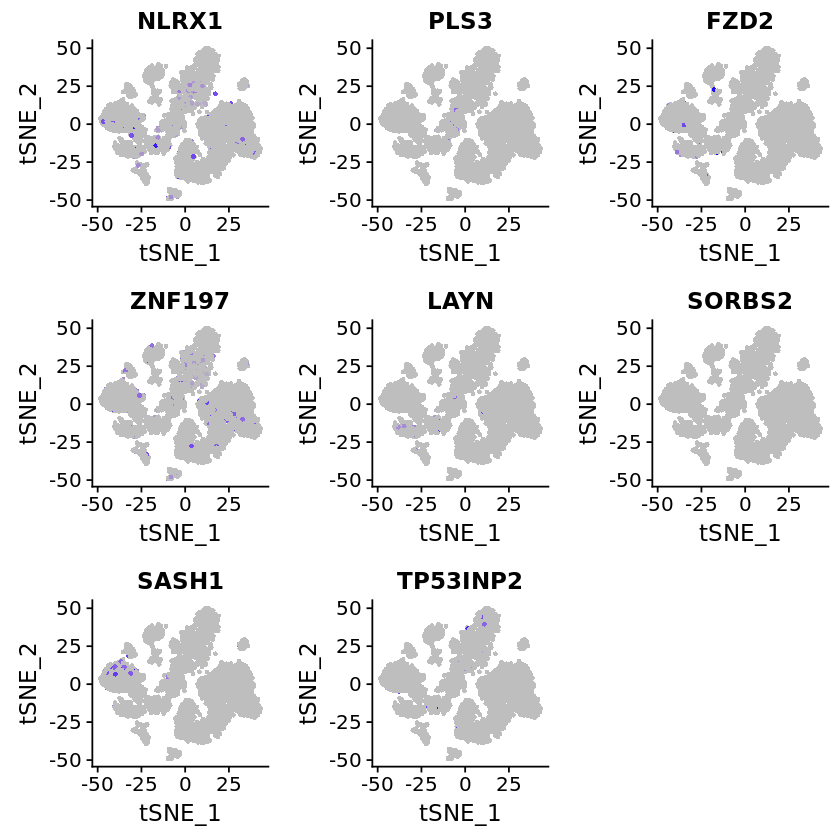

In [61]:
FeaturePlot(object = cells, features.plot = cand_ghaz13, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [127]:
head(cells@meta.data)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,Jia,Jia71,Silva,Dominici,Ghaz_surface,Ghaz_con
AAACCTGCACCCATGG-2,1034,4919,bmac,JTW03,0.02359162,1,1,1,1,5,no,no,no,no,no,no
AAACCTGCAGGGTTAG-2,899,3459,bmac,JTW03,0.02862099,1,1,1,1,0,no,no,no,no,no,no
AAACCTGGTGCTCTTC-2,1263,4938,bmac,JTW03,0.04193679,2,2,2,2,7,no,no,no,no,no,no
AAACCTGGTGGCTCCA-2,1255,3066,bmac,JTW03,0.05058747,11,11,11,11,15,no,no,no,no,no,no
AAACCTGTCACCGGGT-2,1316,4441,bmac,JTW03,0.02974313,2,2,2,2,7,no,no,no,no,no,no
AAACGGGTCAGCACAT-2,927,3956,bmac,JTW03,0.03413401,1,1,1,1,0,no,no,no,no,no,no


In [129]:
library(IRdisplay)
p7 <- FeaturePlot(object = cells, features.plot = c("VCAM1"), cols.use = c("grey", "blue"), reduction.use = "tsne", 
                  do.hover = TRUE, data.hover = c("ident", "library_id"))
htmlwidgets::saveWidget(p7, "p7.html")
#display_html('<iframe src="p7.html" width=100% height=450></iframe>')

ERROR: Error in htmlwidgets::saveWidget(p7, "p7.html"): Saving a widget with selfcontained = TRUE requires pandoc. For details see:
https://github.com/rstudio/rmarkdown/blob/master/PANDOC.md


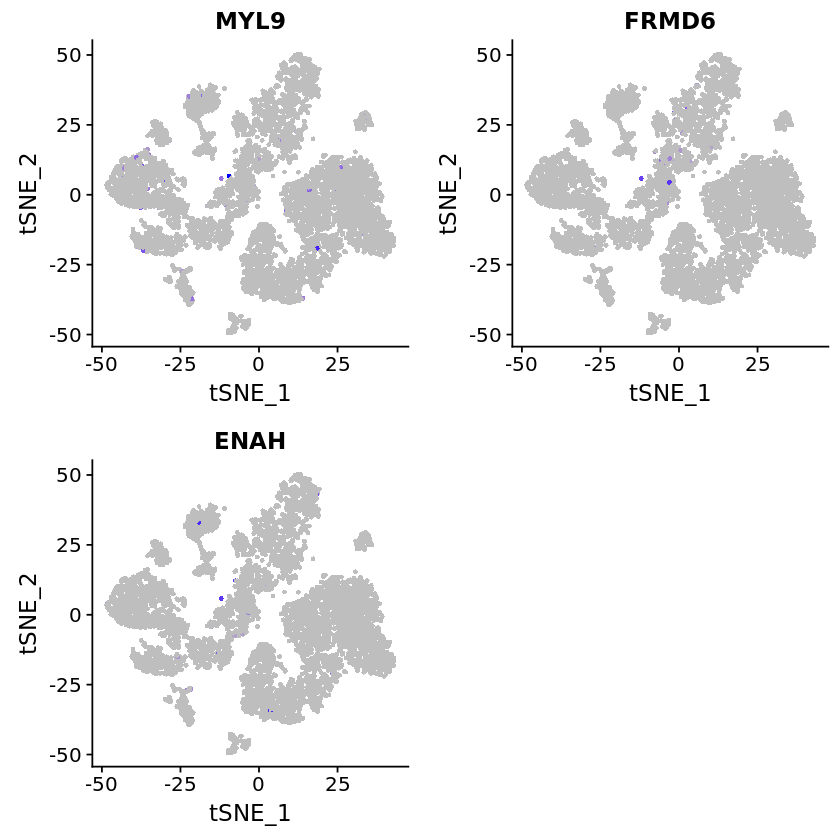

In [109]:
FeaturePlot(object = cells, features.plot = c("MYL9", "FRMD6", "ENAH"), cols.use = c("grey", "blue"), reduction.use = "tsne")

In [110]:
# Cells that express c("VCAM1", "LOXL1", "MYL9", "FRMD6", "CALD1", "NUPR1", "ENAH")
ghaz_interest <- c("VCAM1", "LOXL1", "MYL9", "FRMD6", "CALD1", "NUPR1", "ENAH")
pos_mscs <- cells@data[ghaz_interest,]
head(pos_mscs)

   [[ suppressing 9301 column names ‘AAACCTGCACCCATGG-2’, ‘AAACCTGCAGGGTTAG-2’, ‘AAACCTGGTGCTCTTC-2’ ... ]]


6 x 9301 sparse Matrix of class "dgCMatrix"
                                                                               
VCAM1 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
LOXL1 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
MYL9  . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
FRMD6 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
CALD1 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
NUPR1 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
                                                                             
VCAM1 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
LOXL1 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
MYL9  . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
FRMD6 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
CALD1 

In [111]:
pos_mscs.exp_zeros <- colSums(pos_mscs == 0)

In [123]:
pos_mscs.expgenes <- which(pos_mscs.exp_zeros <= 1)

In [124]:
cells@meta.data[pos_mscs.expgenes,]

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,Jia,Jia71,Silva,Dominici,Ghaz_surface,Ghaz_con
AGGGTGAAGCACCGCT-2,2527,8559,bmac,JTW03,0.04142371,5,5,5,7,8,yes,yes,yes,no,no,yes
CCGGTAGGTTAAGTAG-4,2514,6608,bmac,JTW06,0.02253836,5,5,5,7,8,yes,yes,yes,yes,no,yes
CGACCTTGTCTAGTGT-9,1674,3733,bmac,MG02,0.03266685,5,5,5,7,8,no,no,no,no,no,no


## Observations
* Based on transcriptional profiles provided by Jia et al. 2002, Silva et al. 2003, and Dominici et al. 2006, no clusters exhibit transcriptional characteristics of MSCs.
* Many genes previously expressed in the count matrix that includes sample JTW01 (MSCs) were not found in this group of samples.
* A few cells in the middle of cluster 5 express some genes that are characteristic of MSCs according to the 4 publications. However, the small set of cells do not address the Dominici et al. definition because they do not express THY1, NT5E, or 

In [ ]:
DimPlot(object = cells, reduction.use = "tsne", group.by = "library_id", pt.size = 0.5, do.return = TRUE)

In [2]:
#save(cells, file = "bmac_cells.RData")
load(file = "bmac_cells.RData")

In [74]:
# Subtracted 1 from each suffix index because JTW01 was removed from this notebook
#pos_mscs <- c('AAGGCAGAGAATCTCC-1', 'ACCTTTATCCCTAACC-1', 'CAGCGACCAGGAATGC-1', 'GACGTGCCATTCGACA-1', 'GCAGTTATCTCTAGGA-1',
#              'AGGGTGAAGCACCGCT-2', 'TTTACTGGTAATCACC-2', 'ACGCCGACAGGTGCCT-3', 'GTCAAGTTCAGCTGGC-3', 'GTGGGTCAGACGACGT-3',
#              'CCGGTAGGTTAAGTAG-4', 'GACTGCGTCTACCAGA-4', 'AAATGCCCACCTGGTG-5', 'CACAGGCTCAGAGCTT-7', 'CGACTTCGTGCTAGCC-7',
#              'GACCTGGGTCACTGGC-7', 'CGACCTTGTCTAGTGT-9')
pos_mscs <- c('AGGGTGAAGCACCGCT-2', 'TTTACTGGTAATCACC-2', 'ACGCCGACAGGTGCCT-3', 'GTCAAGTTCAGCTGGC-3', 'GTGGGTCAGACGACGT-3',
              'CCGGTAGGTTAAGTAG-4', 'GACTGCGTCTACCAGA-4', 'AAATGCCCACCTGGTG-5', 'CACAGGCTCAGAGCTT-7', 'CGACTTCGTGCTAGCC-7', 
              'CGACCTTGTCTAGTGT-9')

In [ ]:
head(cells@scale.data[,pos_mscs])
dim(cells@scale.data[,pos_mscs])

In [ ]:
library(limma)
plotMDS(cells@scale.data[,pos_mscs], labels = pos_mscs)

In [76]:
cells@meta.data$pos_msc <- cells@meta.data$library_id
head(cells@meta.data)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,Jia,Jia71,Silva,Dominici,Ghaz_surface,Ghaz_con,pos_msc
AAACCTGCACCCATGG-2,1034,4919,bmac,JTW03,0.02359162,1,1,1,1,5,no,no,no,no,no,no,JTW03
AAACCTGCAGGGTTAG-2,899,3459,bmac,JTW03,0.02862099,1,1,1,1,0,no,no,no,no,no,no,JTW03
AAACCTGGTGCTCTTC-2,1263,4938,bmac,JTW03,0.04193679,2,2,2,2,7,no,no,no,no,no,no,JTW03
AAACCTGGTGGCTCCA-2,1255,3066,bmac,JTW03,0.05058747,11,11,11,11,15,no,no,no,no,no,no,JTW03
AAACCTGTCACCGGGT-2,1316,4441,bmac,JTW03,0.02974313,2,2,2,2,7,no,no,no,no,no,no,JTW03
AAACGGGTCAGCACAT-2,927,3956,bmac,JTW03,0.03413401,1,1,1,1,0,no,no,no,no,no,no,JTW03


In [83]:
cells@meta.data[pos_mscs,]$pos_msc <- rep("Possible MSCs", length(cells@meta.data[pos_mscs,]$pos_msc))
head(cells@meta.data[pos_mscs,])
table(cells@meta.data$pos_msc)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,Jia,Jia71,Silva,Dominici,Ghaz_surface,Ghaz_con,pos_msc,ptsize
AGGGTGAAGCACCGCT-2,2527,8559,bmac,JTW03,0.04142371,5,5,5,7,8,no,yes,no,no,no,yes,Possible MSCs,0.05
TTTACTGGTAATCACC-2,3597,17555,bmac,JTW03,0.03698216,2,2,2,2,7,no,no,no,no,no,no,Possible MSCs,0.05
ACGCCGACAGGTGCCT-3,2044,5053,bmac,JTW05,0.14002380,4,4,4,3,1,no,no,no,no,no,no,Possible MSCs,0.05
GTCAAGTTCAGCTGGC-3,2109,5111,bmac,JTW05,0.02679860,15,15,15,17,19,no,yes,no,no,no,yes,Possible MSCs,0.05
GTGGGTCAGACGACGT-3,2701,7180,bmac,JTW05,0.04684976,15,15,15,17,19,no,yes,no,no,yes,yes,Possible MSCs,0.05
CCGGTAGGTTAAGTAG-4,2514,6608,bmac,JTW06,0.02253836,5,5,5,7,8,no,yes,no,no,no,yes,Possible MSCs,0.05



      Not MSC Possible MSCs 
         9290            11 

In [84]:
tmp <- which(cells@meta.data$pos_msc != "Possible MSCs")
cells@meta.data[tmp,]$pos_msc <- rep("Not MSC", length(cells@meta.data[tmp,]$pos_msc))
table(cells@meta.data$pos_msc)


      Not MSC Possible MSCs 
         9290            11 

In [ ]:
head(cells@meta.data)

In [91]:
?DimPlot

In [85]:
cells@meta.data$ptsize <- rep(0.05, nrow(cells@meta.data))
head(cells@meta.data)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,Jia,Jia71,Silva,Dominici,Ghaz_surface,Ghaz_con,pos_msc,ptsize
AAACCTGCACCCATGG-2,1034,4919,bmac,JTW03,0.02359162,1,1,1,1,5,no,no,no,no,no,no,Not MSC,0.05
AAACCTGCAGGGTTAG-2,899,3459,bmac,JTW03,0.02862099,1,1,1,1,0,no,no,no,no,no,no,Not MSC,0.05
AAACCTGGTGCTCTTC-2,1263,4938,bmac,JTW03,0.04193679,2,2,2,2,7,no,no,no,no,no,no,Not MSC,0.05
AAACCTGGTGGCTCCA-2,1255,3066,bmac,JTW03,0.05058747,11,11,11,11,15,no,no,no,no,no,no,Not MSC,0.05
AAACCTGTCACCGGGT-2,1316,4441,bmac,JTW03,0.02974313,2,2,2,2,7,no,no,no,no,no,no,Not MSC,0.05
AAACGGGTCAGCACAT-2,927,3956,bmac,JTW03,0.03413401,1,1,1,1,0,no,no,no,no,no,no,Not MSC,0.05


In [88]:
cells@meta.data$ptsize[which(cells@meta.data$pos_msc == "Possible MSCs")] <- rep(2, length(cells@meta.data$ptsize[which(cells@meta.data$pos_msc == "Possible MSCs")]))

In [89]:
table(cells@meta.data$ptsize)


0.05    2 
9290   11 

In [219]:
p1 <- DimPlot(object = cells, reduction.use = "tsne", group.by = "pos_msc", pt.size = 0.05, do.return = TRUE,
        plot.order = "Possible MSCs", cols.use = c("light grey", "blue"), no.legend = TRUE) #+ ggtitle("Cells that clustered with cultured MSCs") 
tiff(filename = "20190207_Figures/Fig4_BMAC_possible_MSCs.tiff",
    width = 1500, height = 1500, units = "px", res = 300)
plot(p1)
dev.off()

png 
  2

In [ ]:
# Cluster memberships of possible MSCs
table(cells@meta.data[pos_mscs,]$res.0.8)

# Identifying Cell Types
From "2018-03-14 BMAC update.pdf"
* Monocyte - CD14, LYZ
* T cells - CD3D, CD3E, CD4
* B cells - CD79A, CD79B
* NK cells - GNLY, NKG7
* Erythrocytes - HBA1/2

From [Satija Lab Tutorial](https://satijalab.org/seurat/pbmc3k_tutorial.html)
* CD4 T cells - IL7R
* CD14+ Monocytes CD14, LYZ
* B cells - MS4A1
* CD8 T cells - CD8A
* FCGR3A+ Monocytes - FCGR3A, MS4A7
* NK cells - GNLY, NKG7
* Dendritic cells - FCER1A, CST3
* Megakaryocytes - PPBP

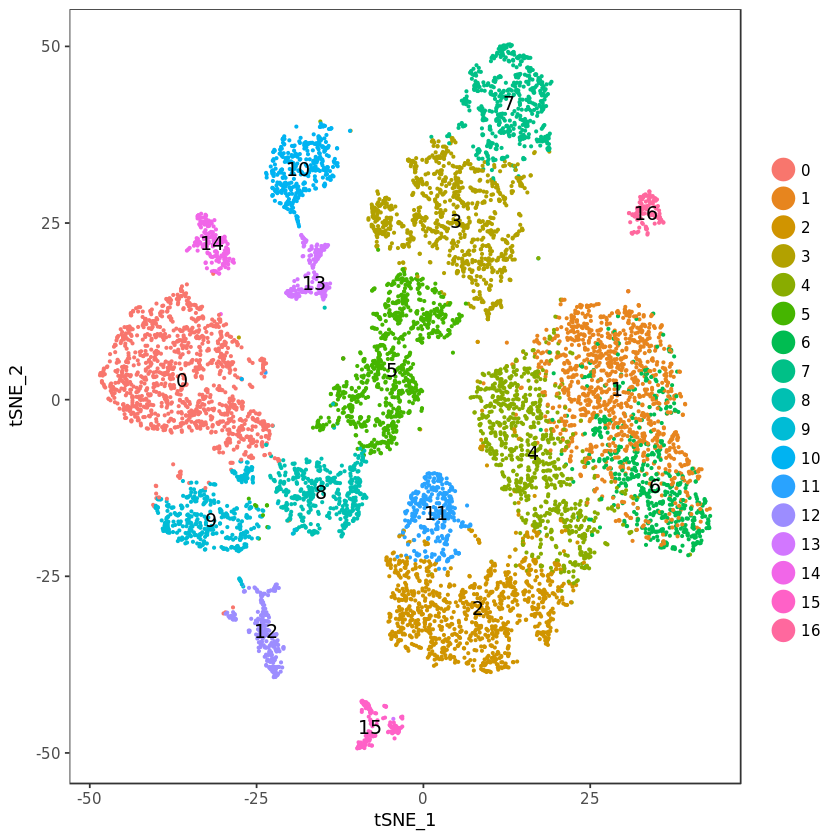

In [62]:
#png(filename = "BMAC_Clusters_numerical.png",
#    width = 1500, height = 1500, units = "px", res = 300)
TSNEPlot(cells, do.label = T, do.return = T, pt.size = 0.5)
#dev.off()

In [82]:
cells.markers <- FindAllMarkers(object = cells, only.pos = TRUE, min.pct = 0.25, thresh.use = 0.25,
                               random.seed = 7)

ERROR: Error in cells.markers %>% group_by(cluster) %>% top_n(2, avg_logFC): could not find function "%>%"


In [85]:
library(dplyr)
library(magrittr)


Attaching package: ‘dplyr’

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



In [95]:
cells.markers %>% group_by(cluster) %>% top_n(3, avg_logFC)

p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
0.000000e+00,3.4539340,0.995,0.305,0.000000e+00,0,S100A9
0.000000e+00,3.2226157,0.989,0.304,0.000000e+00,0,S100A8
0.000000e+00,2.7256785,0.909,0.073,0.000000e+00,0,S100A12
0.000000e+00,0.9724677,0.569,0.094,0.000000e+00,1,CCR7
3.050660e-307,0.9040898,0.917,0.355,4.948780e-303,1,LTB
7.296692e-191,0.8362214,0.737,0.391,1.183669e-186,1,NOSIP
0.000000e+00,2.5605423,0.954,0.100,0.000000e+00,2,CCL5
0.000000e+00,1.8204853,0.917,0.187,0.000000e+00,2,NKG7
1.141745e-252,1.8692906,0.495,0.114,1.852138e-248,2,KLRB1
0.000000e+00,1.8181568,0.992,0.177,0.000000e+00,3,AHSP


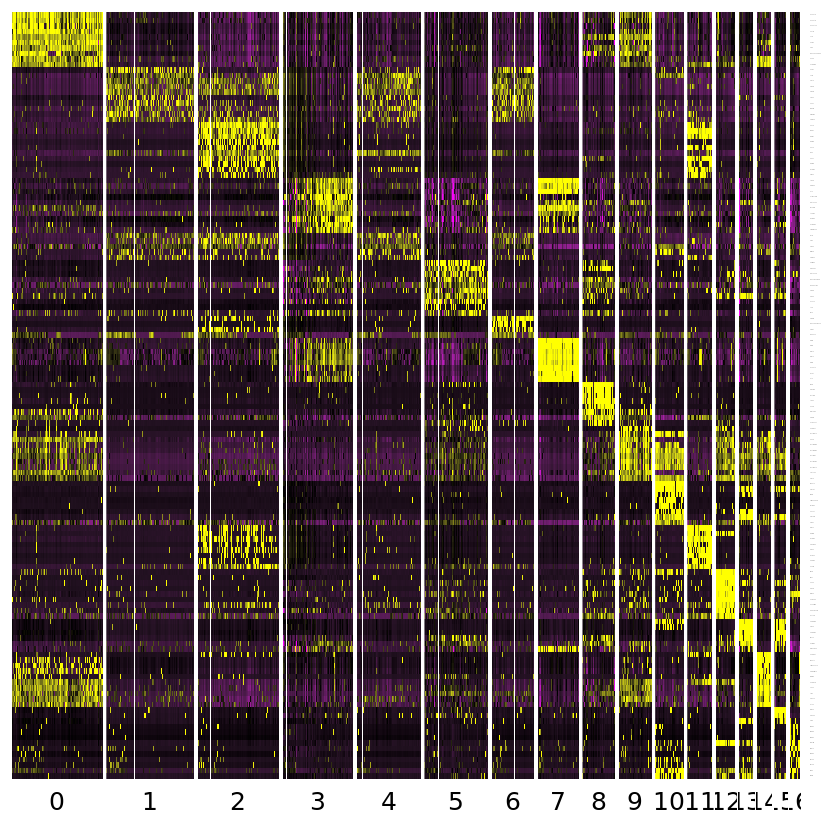

In [89]:
top10 <- cells.markers %>% group_by(cluster) %>% top_n(10, avg_logFC)

In [149]:
# setting slim.col.label to TRUE will print just the cluster IDS instead of every cell name
png(filename = "top10_clust_heatmap_BMAC_noJTW02.png",
    width = 1500, height = 1500, units = "px", res = 300)
DoHeatmap(object = cells, genes.use = top10$gene, slim.col.label = TRUE, remove.key = TRUE, 
          cex.row = 1.9, group.cex = 3)
dev.off()

png 
  2

In [145]:
?DoHeatmap

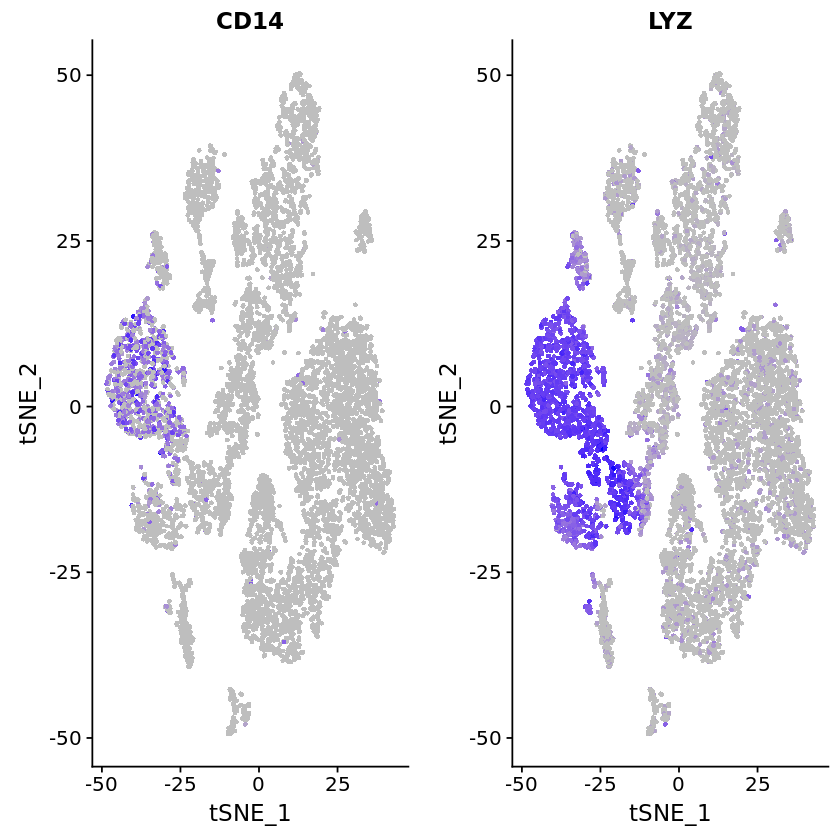

In [70]:
# Monocytes
FeaturePlot(object = cells, features.plot = c("CD14", "LYZ"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

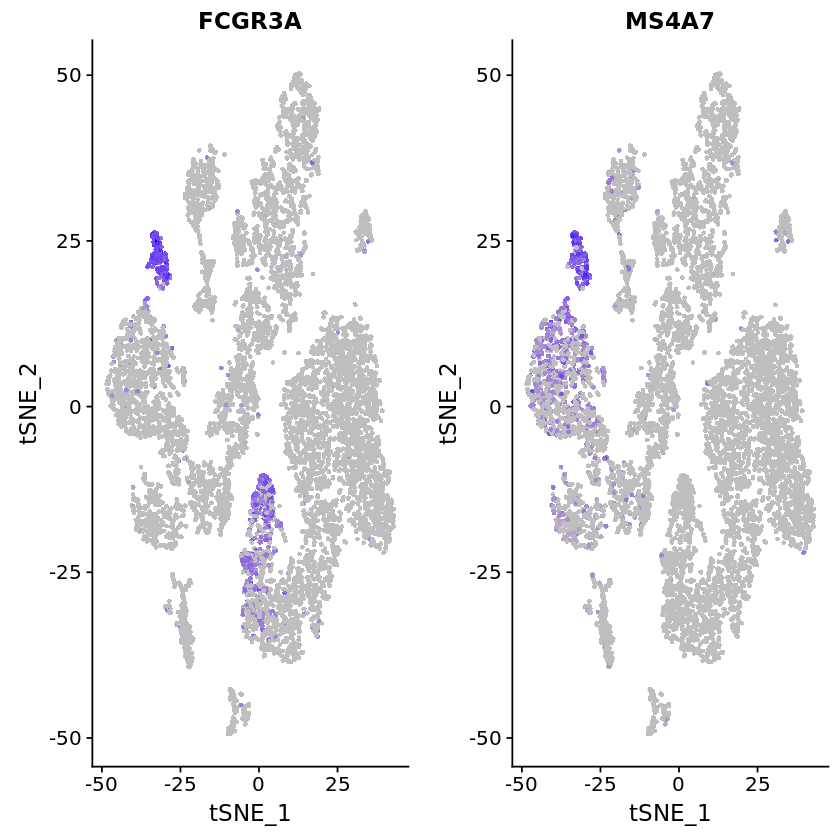

In [120]:
# FCGR3A+ Monocytes
FeaturePlot(object = cells, features.plot = c("FCGR3A", "MS4A7"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

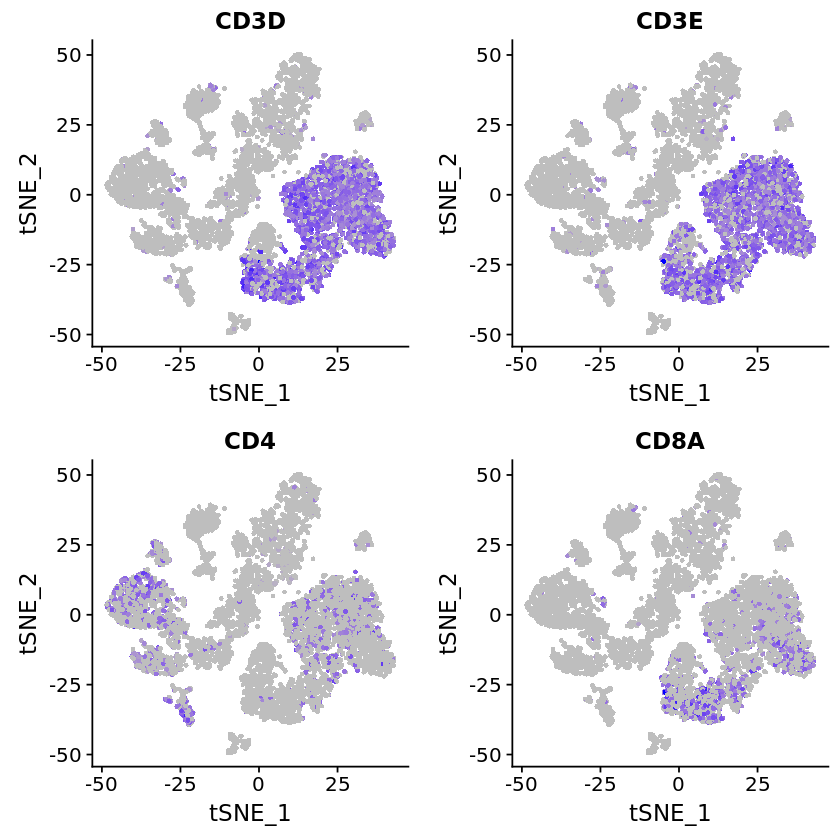

In [77]:
# T cells
FeaturePlot(object = cells, features.plot = c("CD3D", "CD3E", "CD4", "CD8A"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

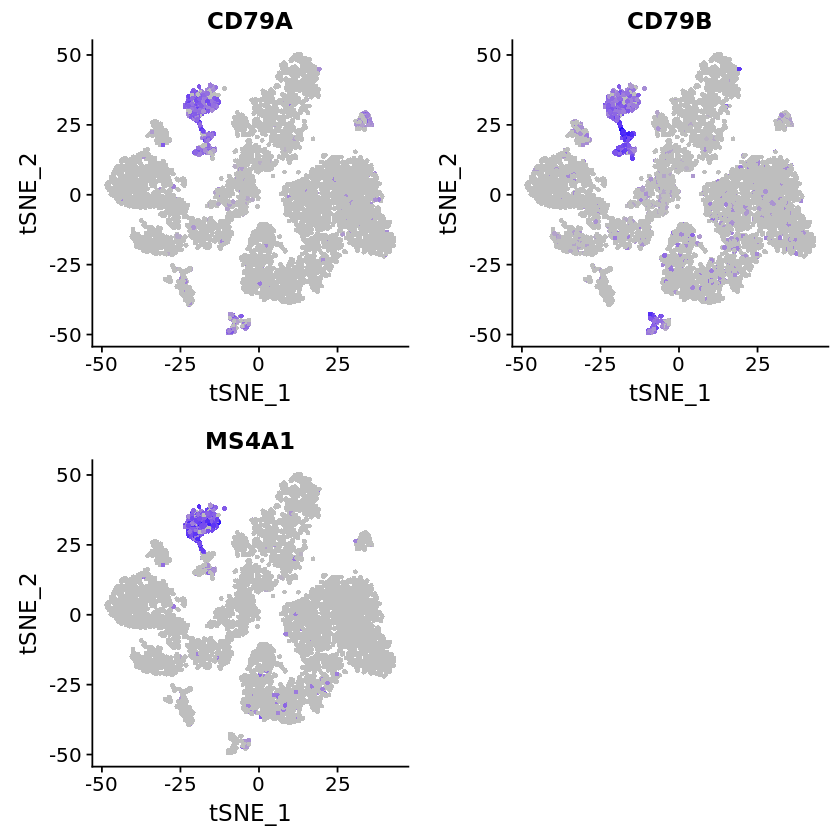

In [78]:
# B cells
FeaturePlot(object = cells, features.plot = c("CD79A", "CD79B", "MS4A1"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

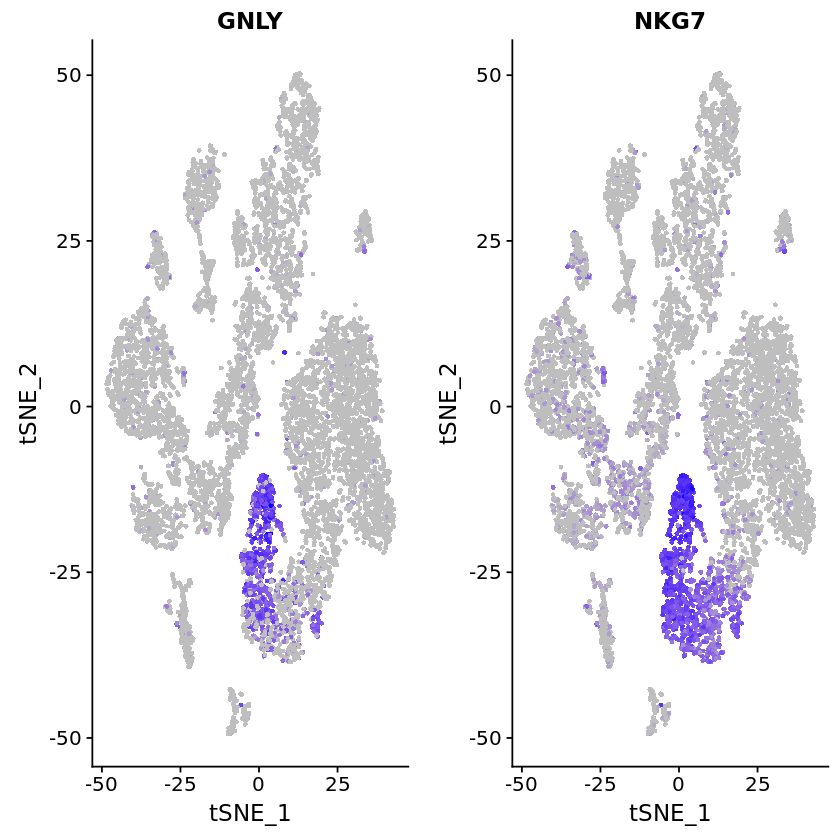

In [73]:
# NK cells
FeaturePlot(object = cells, features.plot = c("GNLY", "NKG7"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

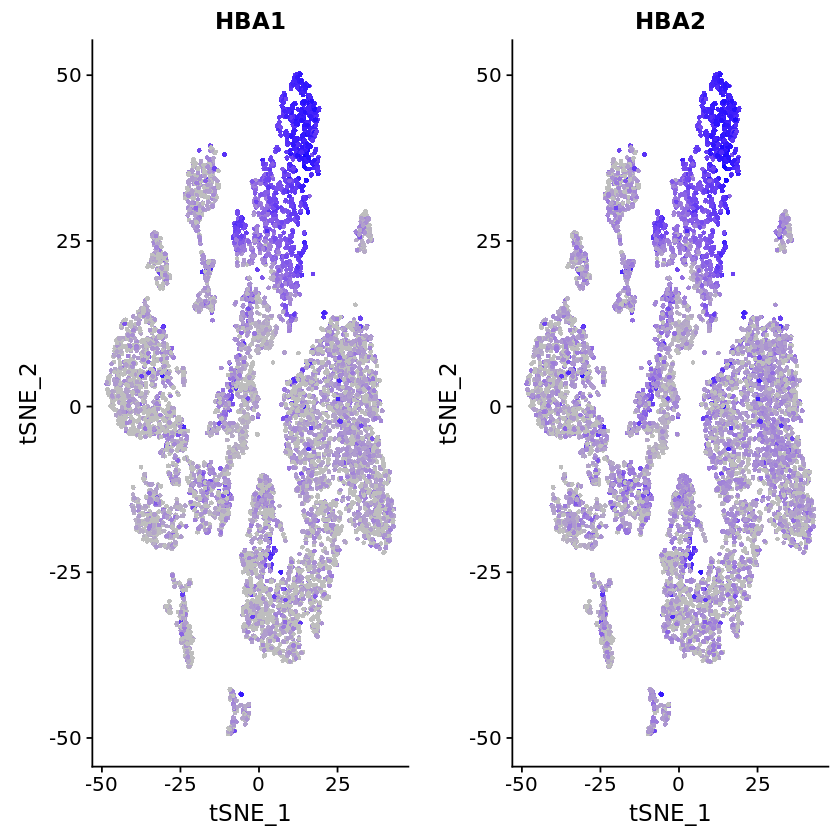

In [74]:
# Erythrocytes
FeaturePlot(object = cells, features.plot = c("HBA1", "HBA2"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

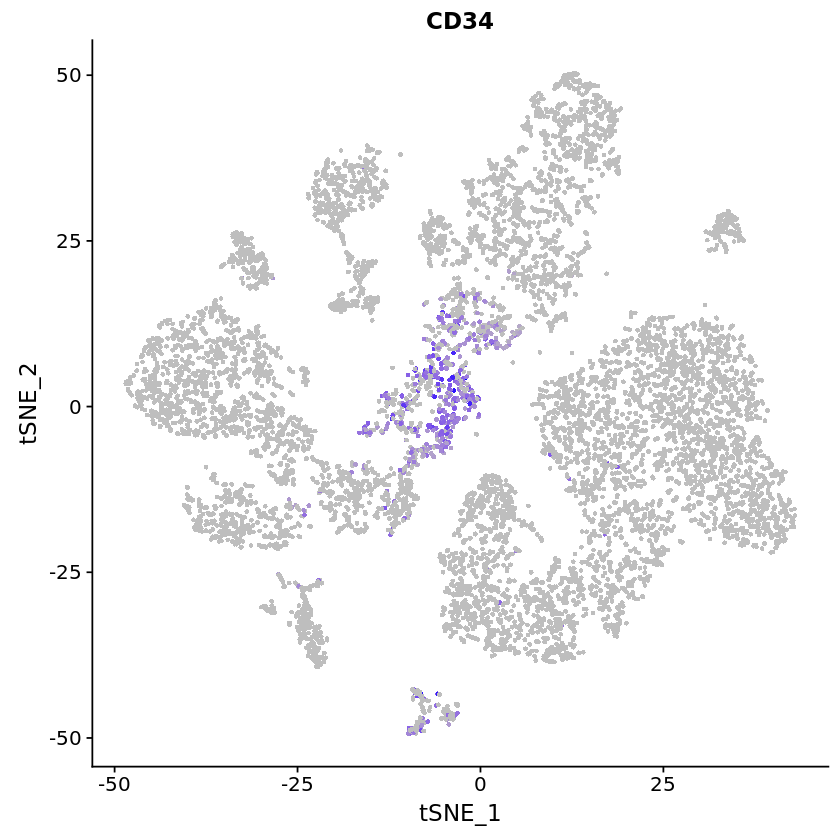

In [75]:
FeaturePlot(object = cells, features.plot = c("CD34"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

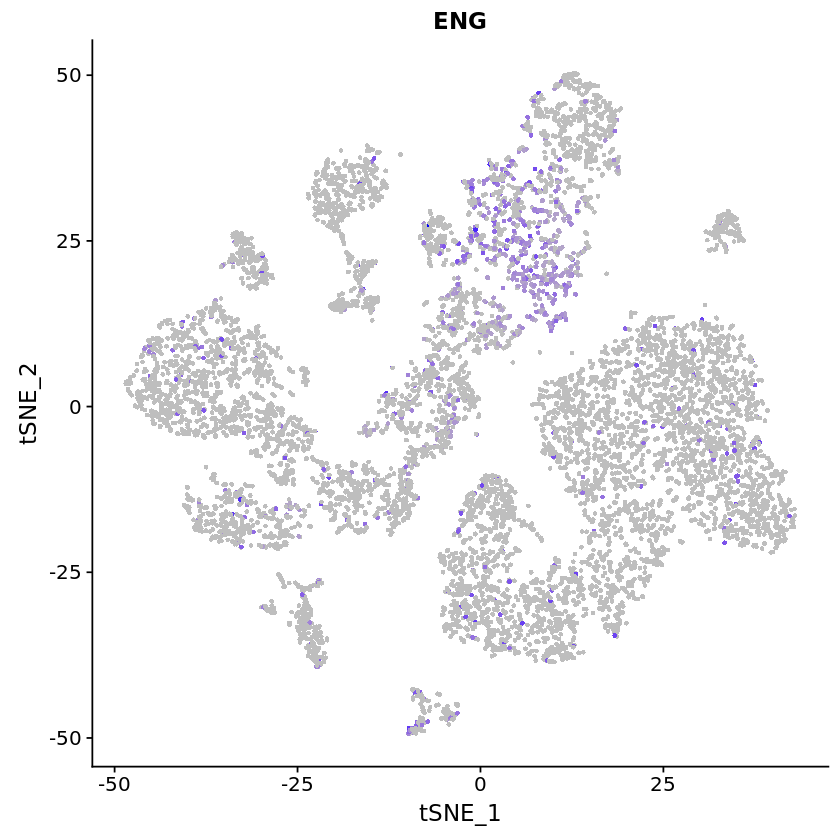

In [76]:
FeaturePlot(object = cells, features.plot = c("ENG"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

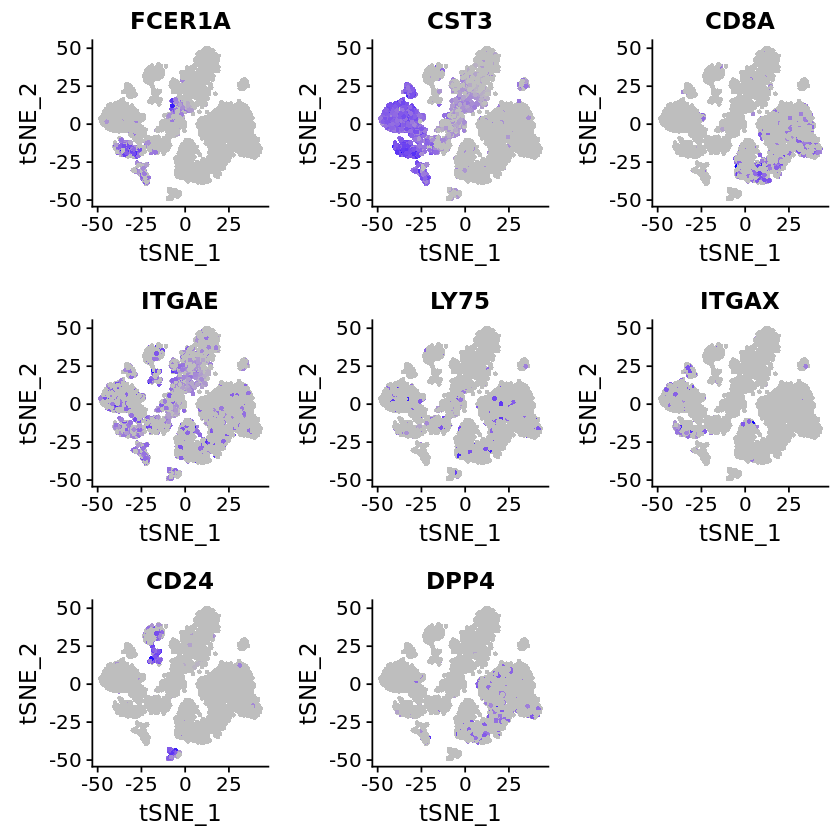

In [126]:
# Dendritic cells
FeaturePlot(object = cells, features.plot = c("FCER1A", "CST3", "CD8A", "ITGAE", "LY75", "ITGAX", "CD24", "DPP4"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")
#CD103 = ITGAE
#CD205 = LY75
#CD11C = ITGAX
#CD26 = DPP4

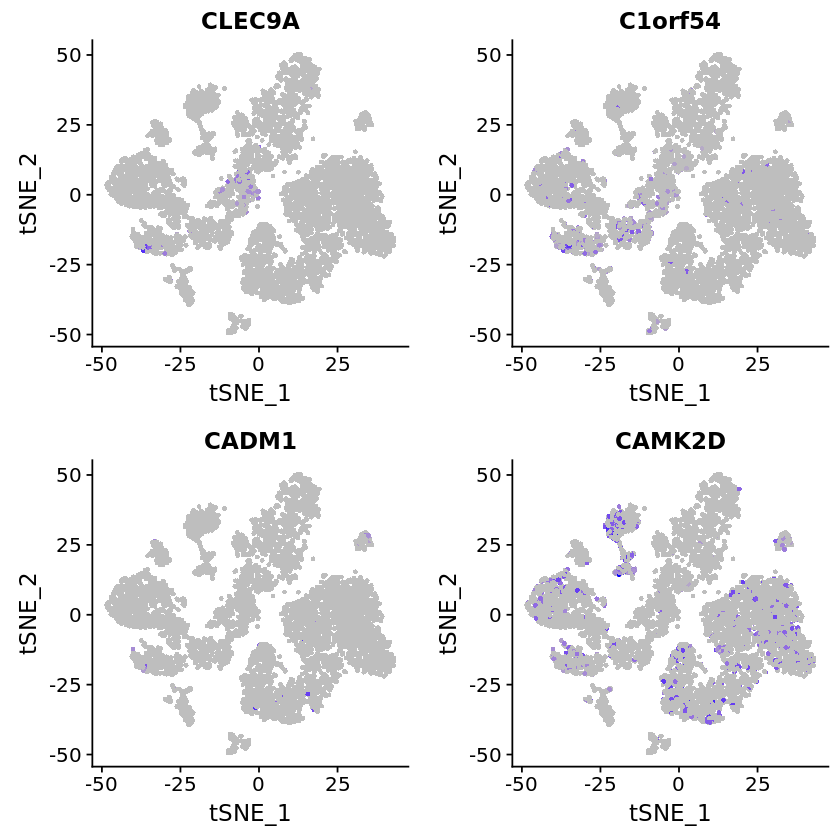

In [138]:
# Dendritic cells (DC1) https://portals.broadinstitute.org/single_cell/study/atlas-of-human-blood-dendritic-cells-and-monocytes
FeaturePlot(object = cells, features.plot = c("CLEC9A", "C1orf54", "CADM1", "CAMK2D"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")
# Not found: IDO1, XCR1

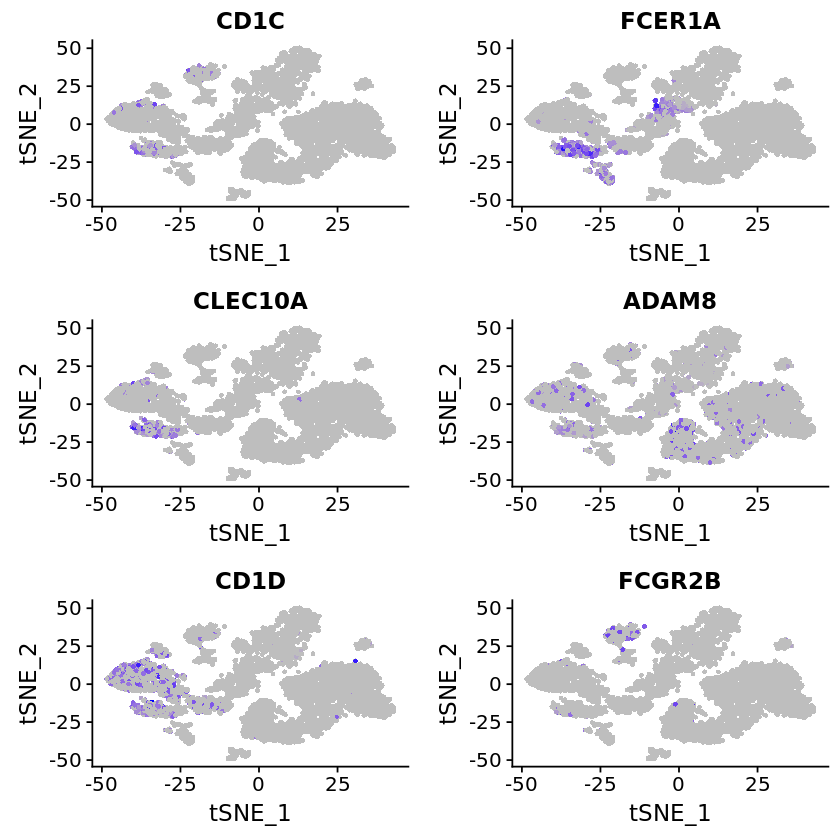

In [139]:
# DC2 https://portals.broadinstitute.org/single_cell/study/atlas-of-human-blood-dendritic-cells-and-monocytes
FeaturePlot(object = cells, features.plot = c("CD1C", "FCER1A", "CLEC10A", "ADAM8", "CD1D", "FCGR2B"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

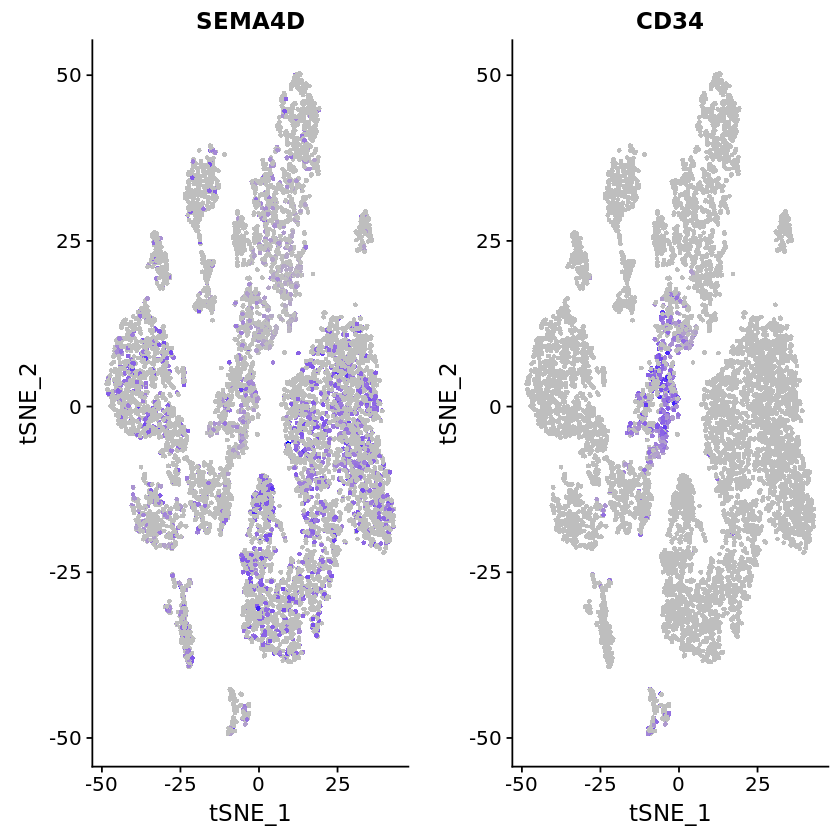

In [141]:
# cDC progenitor https://portals.broadinstitute.org/single_cell/study/atlas-of-human-blood-dendritic-cells-and-monocytes
FeaturePlot(object = cells, features.plot = c("SEMA4D", "CD34"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")
# CD100 = SEMA4D

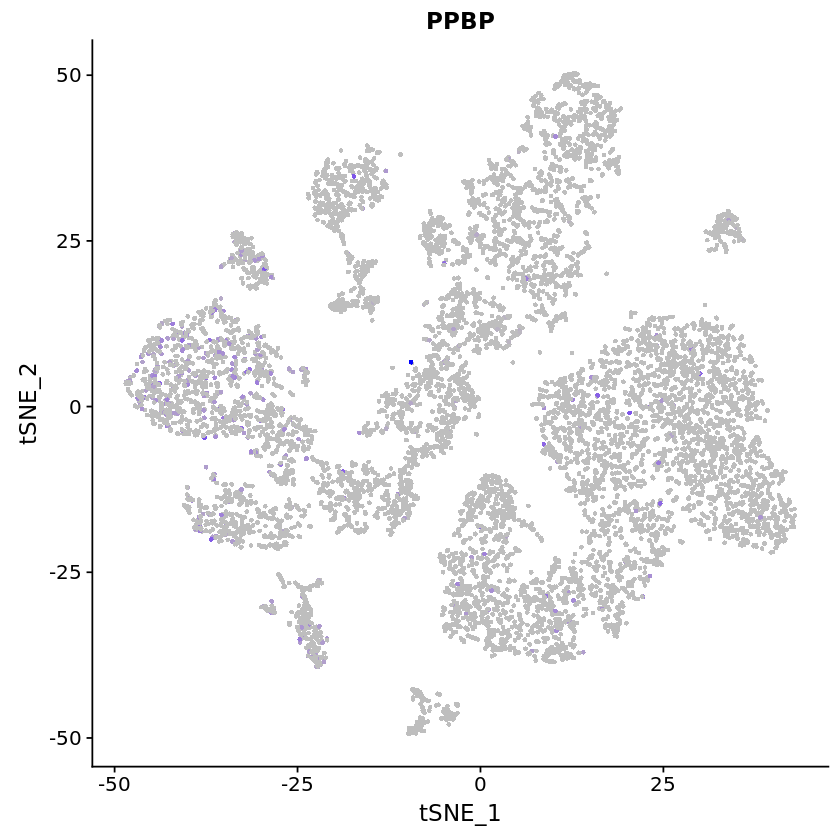

In [80]:
# Megakaryocytes
FeaturePlot(object = cells, features.plot = c("PPBP"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

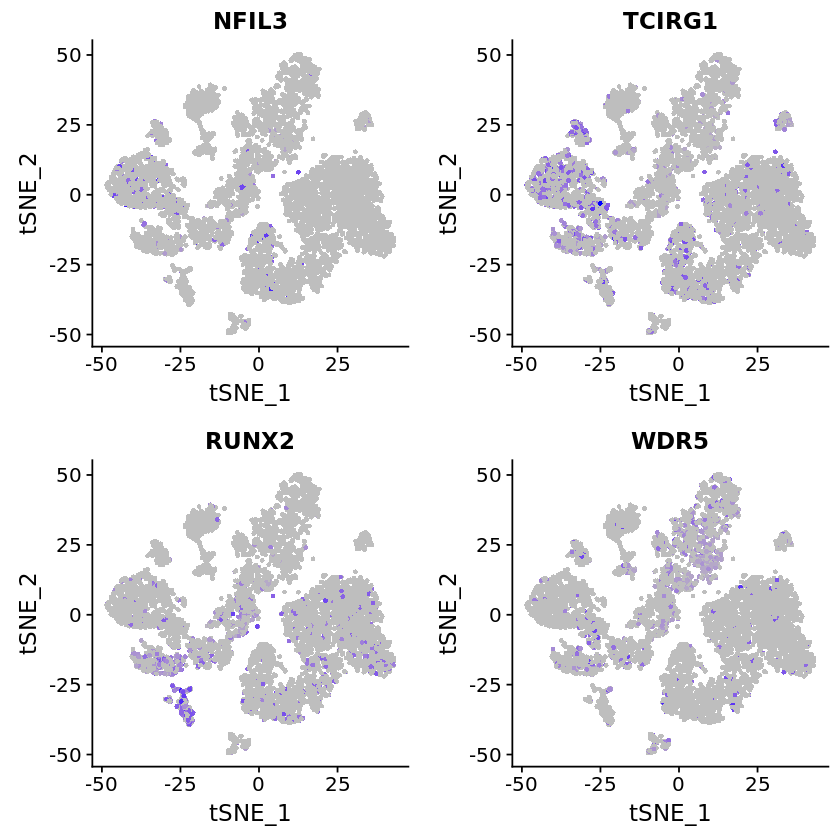

In [167]:
# Osteoblast/Osteoclast https://www.rndsystems.com/research-area/osteoblast-and-osteoclast-markers
# Intracellular markers
FeaturePlot(object = cells, features.plot = c("NFIL3", "TCIRG1", "RUNX2", "WDR5"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

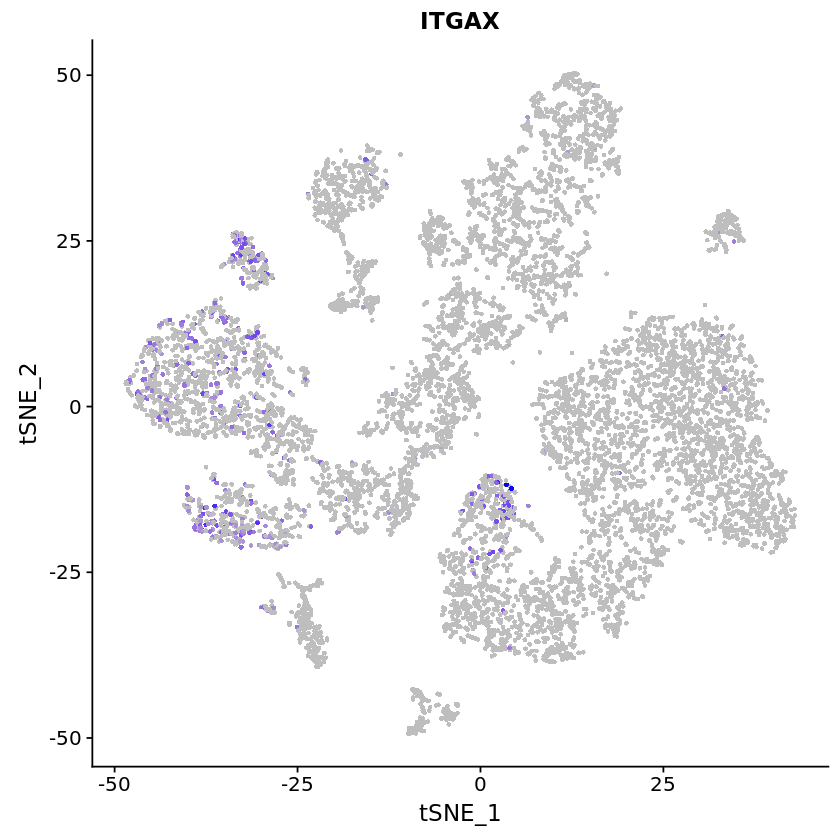

In [69]:
FeaturePlot(object = cells, features.plot = c("ITGAX"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

### Cluster - Markers - Label
* Cluster 0 - CD14, LYZ - Monocytes
* Cluster 1 - CD3D, CD3E, CD4, CD8A - T cells
* Cluster 2 - CD3D, CD3E, CD4, CD8A - T cells
* Cluster 3 - HBA1, HBA2 - Erythrocytes
* Cluster 4 - CD3D, CD3E, CD4, CD8A - T cells
* Cluster 5 - CD34 - CD34+ progenitors
* Cluster 6 - CD3D, CD3E, CD4, CD8A - T cells
* Cluster 7 - HBA1, HBA2 - Erythrocytes
* Cluster 8 - MPO - Neutrophils
* Cluster 9 - Monocytes/Dendritic cells
* Cluster 10 - CD79A, CD79B - B cells
* Cluster 11 - GNLY, NKG7 - NK cells
* Cluster 12 - IRF8/7 – Dendritic cells/Monocyte precursor
* Cluster 13 - Pre-B/B-cells VPREB1/3, TCL1A, CD24 (B lymphocyte)
* Cluster 14 - FCGR3A, MS4A7 - FCGR3A+ Monocytes
* Cluster 15 - Pre-B/B-cells EBF1, VPREB1/3
* Cluster 16 - Lymphoblasts/Bcells/Dendritic/Mature B lymphocyte? Using marker TNFRSF17 – mature b lymphocytes http://biogps.org/#goto=genereport&id=608


In [3]:
head(cells@meta.data)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,Jia,Jia71,Silva,Dominici,Ghaz_surface,Ghaz_con
AAACCTGCACCCATGG-2,1034,4919,bmac,JTW03,0.02359162,1,1,1,1,5,no,no,no,no,no,no
AAACCTGCAGGGTTAG-2,899,3459,bmac,JTW03,0.02862099,1,1,1,1,0,no,no,no,no,no,no
AAACCTGGTGCTCTTC-2,1263,4938,bmac,JTW03,0.04193679,2,2,2,2,7,no,no,no,no,no,no
AAACCTGGTGGCTCCA-2,1255,3066,bmac,JTW03,0.05058747,11,11,11,11,15,no,no,no,no,no,no
AAACCTGTCACCGGGT-2,1316,4441,bmac,JTW03,0.02974313,2,2,2,2,7,no,no,no,no,no,no
AAACGGGTCAGCACAT-2,927,3956,bmac,JTW03,0.03413401,1,1,1,1,0,no,no,no,no,no,no


In [65]:
# Run this before changing cluster IDs
cells <- SetAllIdent(cells, id = "res.0.6")

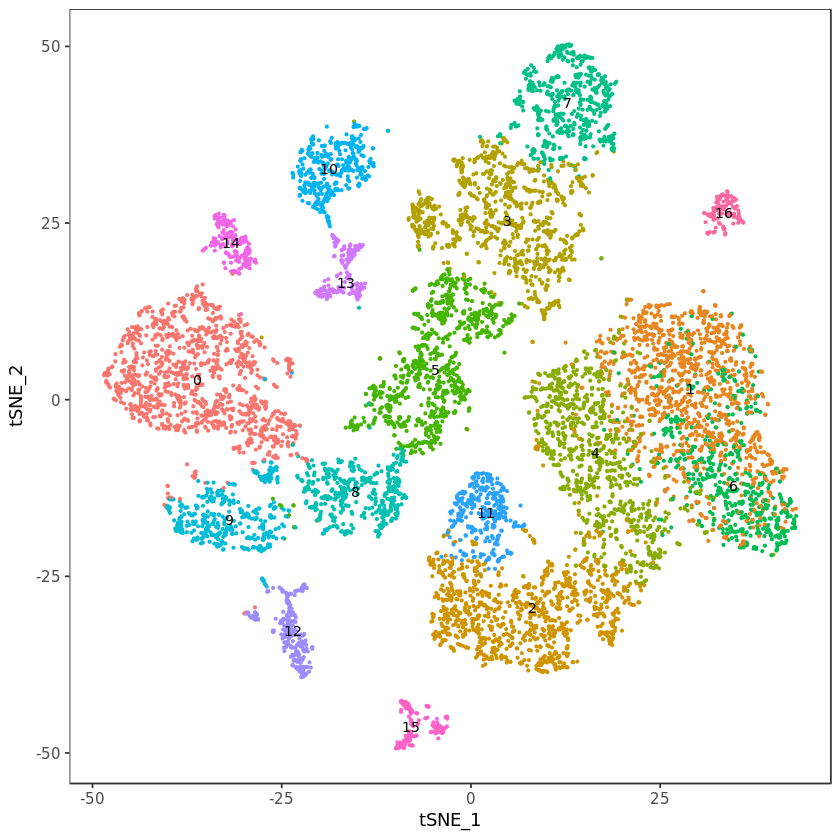

In [4]:
#png(filename = "BMAC_noJTW02_clusters.png",
#    width = 1500, height = 1500, units = "px", res = 300)
TSNEPlot(object = cells, do.label = TRUE, pt.size = 0.5, label.size = 3, no.legend = TRUE)
#dev.off()

In [66]:
numerical.cluster.ids <- c(0:16)
new.cluster.ids <- c("Monocytes", "T Cells", "T Cells", "Erythrocytes", "T Cells", 
                     "CD34+ Progenitors", "T Cells", "Erythrocytes", "Neutrophils", "Monocytes/Dendritic Cells", 
                     "B Cells", "NK Cells", "Monocytes/Dendritic Cells", "B Lymphocytes", "FCGR3A+ Monocytes",
                     "Pre-B Cells", "Mature B Lymphocytes")

In [67]:
cells@ident <- plyr::mapvalues(x = cells@ident, from = numerical.cluster.ids, to = new.cluster.ids)

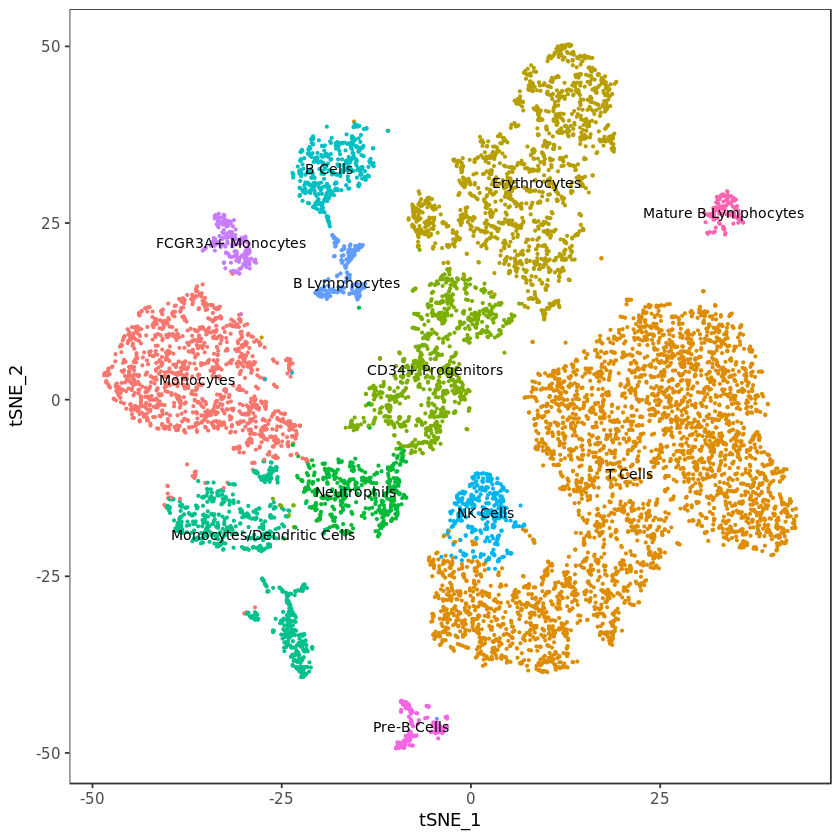

In [68]:
#png(filename = "BMAC_noJTW02_celltypes_legend.png",
#    width = 1500, height = 1500, units = "px", res = 300)
TSNEPlot(object = cells, do.label = TRUE, pt.size = 0.5, label.size = 3, no.legend = T)
#dev.off()

In [69]:
cells@meta.data$new.ident <- cells@ident
head(cells@meta.data)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,Jia,Jia71,Silva,Dominici,Ghaz_surface,Ghaz_con,new.ident
AAACCTGCACCCATGG-2,1034,4919,bmac,JTW03,0.02359162,1,1,1,1,5,no,no,no,no,no,no,T Cells
AAACCTGCAGGGTTAG-2,899,3459,bmac,JTW03,0.02862099,1,1,1,1,0,no,no,no,no,no,no,T Cells
AAACCTGGTGCTCTTC-2,1263,4938,bmac,JTW03,0.04193679,2,2,2,2,7,no,no,no,no,no,no,T Cells
AAACCTGGTGGCTCCA-2,1255,3066,bmac,JTW03,0.05058747,11,11,11,11,15,no,no,no,no,no,no,NK Cells
AAACCTGTCACCGGGT-2,1316,4441,bmac,JTW03,0.02974313,2,2,2,2,7,no,no,no,no,no,no,T Cells
AAACGGGTCAGCACAT-2,927,3956,bmac,JTW03,0.03413401,1,1,1,1,0,no,no,no,no,no,no,T Cells


### Overlay cells that match MSC definitions based on publications with the cell types ID'ed.
* Find qualifying cells and change their @ident to "MSC..."

In [189]:
# Save cluster names from previous image
cells <- StashIdent(object = cells, save.name = "ClusterNames")

In [197]:
# Jia et al. cells expressing 12/17 genes
head(cells@meta.data, 2)
cells <- SetIdent(cells, cells.use = rownames(cells@meta.data[jia_all.expgenes71,]), ident.use = "Jia et al. MSCs")
table(cells@ident)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,Jia,Jia71,Silva,Dominici,Ghaz_surface,Ghaz_con,ClusterNames
AAACCTGCACCCATGG-2,1034,4919,bmac,JTW03,0.02359162,1,1,1,1,5,no,no,no,no,no,no,T Cells
AAACCTGCAGGGTTAG-2,899,3459,bmac,JTW03,0.02862099,1,1,1,1,0,no,no,no,no,no,no,T Cells



                8                 9                12                13 
              419               409               243               185 
               15                16           B Cells CD34+ Progenitors 
              150               121               363               807 
     Erythrocytes FCGR3A+ Monocytes   Jia et al. MSCs         Monocytes 
             1421               176                45              1133 
         NK Cells           T Cells 
              319              3510 

In [208]:
table(cells@ident)


                8                 9                12                13 
              419               409               243               185 
               15                16           B Cells CD34+ Progenitors 
              150               121               363               807 
     Erythrocytes FCGR3A+ Monocytes   Jia et al. MSCs         Monocytes 
             1421               176                45              1133 
         NK Cells           T Cells 
              319              3510 

In [210]:
png(filename = "Jia_MSCs_BMAC_noJTW02.png",
    width = 1500, height = 1500, units = "px", res = 300)
TSNEPlot(object = cells, do.label = TRUE, pt.size = 0.5, label.size = 3, no.legend = TRUE,
         colors.use = c("grey", "grey", "grey", "grey", "grey", "grey", "grey", "grey", 
                        "grey", "grey", "grey", "grey", "grey", "blue"), 
         plot.order = "Jia et al. MSCs",
         plot.title = "Cells expressing 12/17 Jia et al. MSC genes")
dev.off()

png 
  2

In [218]:
silva_all.expgenes63 <- which(silva_all.exp_zeros <= 7)
cells@meta.data$Silva63 <- rep("no", nrow(cells@meta.data))
cells@meta.data[silva_all.expgenes63,]$Silva63 <- rep("yes", length(silva_all.expgenes63))
table(cells@meta.data$Silva63)


  no  yes 
9296    5 

In [219]:
# Silva et al. cells expressing 12/19 genes
head(cells@meta.data, 2)
cells <- SetIdent(cells, cells.use = rownames(cells@meta.data[silva_all.expgenes63,]), ident.use = "Silva et al. MSCs")
table(cells@ident)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,Jia,Jia71,Silva,Dominici,Ghaz_surface,Ghaz_con,ClusterNames,Silva63
AAACCTGCACCCATGG-2,1034,4919,bmac,JTW03,0.02359162,1,1,1,1,5,no,no,no,no,no,no,T Cells,no
AAACCTGCAGGGTTAG-2,899,3459,bmac,JTW03,0.02862099,1,1,1,1,0,no,no,no,no,no,no,T Cells,no



                8                 9                12                13 
              419               415               244               185 
               15                16           B Cells CD34+ Progenitors 
              150               122               363               809 
     Erythrocytes FCGR3A+ Monocytes         Monocytes          NK Cells 
             1422               178              1160               319 
Silva et al. MSCs           T Cells 
                5              3510 

In [222]:
png(filename = "Silva_MSCs_BMAC_noJTW02.png",
    width = 1500, height = 1500, units = "px", res = 300)
TSNEPlot(object = cells, do.label = TRUE, pt.size = 0.5, label.size = 3, no.legend = TRUE,
         colors.use = c("grey", "grey", "grey", "grey", "grey", "grey", "grey", "grey", 
                        "grey", "grey", "grey", "grey", "grey", "blue"), 
         plot.order = "Silva et al. MSCs",
         plot.title = "Cells expressing 12/19 Silva et al. MSC genes")
dev.off()

png 
  2

In [133]:
# Dominici positive for CD105, CD73 and negative for PTPRC, CD34, CD14, CD79A, CD19, HLADRA
cells <- SetIdent(cells, cells.use = rownames(cells@meta.data[dominici_match,]), ident.use = "Dominici et al. MSCs")
table(cells@ident)


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
1160 1121 1032  899  816  811  541  523  419  415  363  319  244  185  178  152 
  16 
 123 

In [132]:
#png(filename = "Dominici_MSCs_BMAC_noJTW02.png",
 #   width = 1500, height = 1500, units = "px", res = 300)
TSNEPlot(object = cells, do.label = TRUE, pt.size = 0.5, label.size = 3, no.legend = TRUE,
         colors.use = c("grey", "grey", "grey", "grey", "grey", "grey", "grey", "grey", 
                        "grey", "grey", "grey", "grey", "grey", "blue"), 
         plot.order = "Dominici et al. MSCs",
         plot.title = "Cells matching Dominici et al. MSC profile (without THY1+)")
#dev.off()

ERROR: Error in DimPlot(object = object, reduction.use = "tsne", cells.use = cells.use, : invalid ident in plot.order


In [246]:
# Ghazanfari surface marker profile 
cells <- SetIdent(cells, cells.use = rownames(cells@meta.data[ghaz_surface_match,]), ident.use = "Ghazanfari et al. MSCs")
table(cells@ident)


                     8                      9                     12 
                   419                    414                    238 
                    13                     15                     16 
                   185                    150                    123 
               B Cells      CD34+ Progenitors           Erythrocytes 
                   363                    811                   1422 
     FCGR3A+ Monocytes Ghazanfari et al. MSCs              Monocytes 
                   178                      9                   1160 
              NK Cells                T Cells 
                   319                   3510 

In [248]:
png(filename = "GhazSurface_MSCs_BMAC_noJTW02.png",
    width = 1500, height = 1500, units = "px", res = 300)
TSNEPlot(object = cells, do.label = TRUE, pt.size = 0.5, label.size = 3, no.legend = TRUE,
         colors.use = c("grey", "grey", "grey", "grey", "grey", "grey", "grey", "grey", 
                        "grey", "grey", "grey", "grey", "grey", "blue"), 
         plot.order = "Ghazanfari et al. MSCs",
         plot.title = "Cells matching Ghazanfari et al. MSC profile (surface markers)")
dev.off()

png 
  2

In [253]:
# 4/7 Ghazanfari conventional genes
cells <- SetIdent(cells, cells.use = rownames(cells@meta.data[ghaz_con.expgenes,]), ident.use = "Ghazanfari et al. MSCs")
table(cells@ident)


                     8                      9                     12 
                   419                    415                    244 
                    13                     15                     16 
                   185                    150                    122 
               B Cells      CD34+ Progenitors           Erythrocytes 
                   363                    809                   1420 
     FCGR3A+ Monocytes Ghazanfari et al. MSCs              Monocytes 
                   178                      7                   1160 
              NK Cells                T Cells 
                   319                   3510 

In [255]:
png(filename = "GhazCon_MSCs_BMAC_noJTW02.png",
    width = 1500, height = 1500, units = "px", res = 300)
TSNEPlot(object = cells, do.label = TRUE, pt.size = 0.5, label.size = 3, no.legend = TRUE,
         colors.use = c("grey", "grey", "grey", "grey", "grey", "grey", "grey", "grey", 
                        "grey", "grey", "grey", "grey", "grey", "blue"), 
         plot.order = "Ghazanfari et al. MSCs",
         plot.title = "Cells expressing 4/7 Ghazanfari et al. MSC conventional genes")
dev.off()

png 
  2

# Calculate cell type composition for each sample
* By numerical cluster by now -- can change to cell type names later

In [200]:
# Colored by sample
p <- DimPlot(object = cells, reduction.use = "tsne", group.by = "library_id", pt.size = 0.05, do.return = TRUE, no.legend = TRUE)

In [202]:
tiff("20190207_Figures/Fig2A.tiff", height = 1500, width = 1500, units = "px", res = 300)
plot(p)
dev.off()

png 
  2

In [21]:
pbuild <- ggplot_build(p)

In [23]:
unique(pbuild$data[[1]]$colour)

[1] "#F8766D" "#D39200" "#93AA00" "#00BA38" "#00C19F" "#00B9E3" "#619CFF"
[8] "#DB72FB" "#FF61C3"

In [16]:
head(cells@meta.data)
dim(cells@meta.data)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,Jia,Jia71,Silva,Dominici,Ghaz_surface,Ghaz_con
AAACCTGCACCCATGG-2,1034,4919,bmac,JTW03,0.02359162,1,1,1,1,5,no,no,no,no,no,no
AAACCTGCAGGGTTAG-2,899,3459,bmac,JTW03,0.02862099,1,1,1,1,0,no,no,no,no,no,no
AAACCTGGTGCTCTTC-2,1263,4938,bmac,JTW03,0.04193679,2,2,2,2,7,no,no,no,no,no,no
AAACCTGGTGGCTCCA-2,1255,3066,bmac,JTW03,0.05058747,11,11,11,11,15,no,no,no,no,no,no
AAACCTGTCACCGGGT-2,1316,4441,bmac,JTW03,0.02974313,2,2,2,2,7,no,no,no,no,no,no
AAACGGGTCAGCACAT-2,927,3956,bmac,JTW03,0.03413401,1,1,1,1,0,no,no,no,no,no,no


[1] 9301   16

In [17]:
table(cells@meta.data$library_id)
table(cells@ident)


JTW03 JTW05 JTW06 JTW07 JTW08 JTW10  MG01  MG02  MG03 
  780  1759  1016   676   563  1166  1112  1294   935 


                Monocytes                   T Cells              Erythrocytes 
                     1160                      3510                      1422 
        CD34+ Progenitors               Neutrophils Monocytes/Dendritic Cells 
                      811                       419                       659 
                  B Cells                  NK Cells             B Lymphocytes 
                      363                       319                       185 
        FCGR3A+ Monocytes               Pre-B Cells      Mature B Lymphocytes 
                      178                       152                       123 

In [18]:
sample_names <- unique(cells@meta.data$library_id)

In [21]:
length(unique(cells@ident))

[1] 12

In [22]:
#cellpops <- matrix(0, nrow = 9, ncol = 17) #numeric names
cellpops <- matrix(0, nrow = 9, ncol = 12) #labels
row.names(cellpops) <- sample_names
#colnames(cellpops) <- c(0:16) #numeric
colnames(cellpops) <- unique(cells@ident)
head(cellpops)
dim(cellpops)

,T Cells,NK Cells,B Cells,Erythrocytes,Pre-B Cells,CD34+ Progenitors,Monocytes,FCGR3A+ Monocytes,Neutrophils,B Lymphocytes,Mature B Lymphocytes,Monocytes/Dendritic Cells
JTW03,0,0,0,0,0,0,0,0,0,0,0,0
JTW05,0,0,0,0,0,0,0,0,0,0,0,0
JTW06,0,0,0,0,0,0,0,0,0,0,0,0
JTW07,0,0,0,0,0,0,0,0,0,0,0,0
JTW08,0,0,0,0,0,0,0,0,0,0,0,0
JTW10,0,0,0,0,0,0,0,0,0,0,0,0


[1]  9 12

In [40]:
cells@meta.data$new.ident <- cells@ident
head(cells@meta.data)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,Jia,Jia71,Silva,Dominici,Ghaz_surface,Ghaz_con,new.ident
AAACCTGCACCCATGG-2,1034,4919,bmac,JTW03,0.02359162,1,1,1,1,5,no,no,no,no,no,no,T Cells
AAACCTGCAGGGTTAG-2,899,3459,bmac,JTW03,0.02862099,1,1,1,1,0,no,no,no,no,no,no,T Cells
AAACCTGGTGCTCTTC-2,1263,4938,bmac,JTW03,0.04193679,2,2,2,2,7,no,no,no,no,no,no,T Cells
AAACCTGGTGGCTCCA-2,1255,3066,bmac,JTW03,0.05058747,11,11,11,11,15,no,no,no,no,no,no,NK Cells
AAACCTGTCACCGGGT-2,1316,4441,bmac,JTW03,0.02974313,2,2,2,2,7,no,no,no,no,no,no,T Cells
AAACGGGTCAGCACAT-2,927,3956,bmac,JTW03,0.03413401,1,1,1,1,0,no,no,no,no,no,no,T Cells


In [24]:
# Fill cellpops with cluster membership counts
for (sample in sample_names) {
    #tmp <- cells@meta.data[which(cells@meta.data$library_id == sample), "res.0.6"] #numeric
    tmp <- cells@meta.data[which(cells@meta.data$library_id == sample), "new.ident"]
    #tmp <- factor(tmp, levels = c(0:16)) #numeric
    tmp <- factor(tmp, levels = unique(cells@meta.data$new.ident))
    tmp <- table(tmp)
    cellpops[sample, ] <- tmp
}

In [25]:
cellpops

,T Cells,NK Cells,B Cells,Erythrocytes,Pre-B Cells,CD34+ Progenitors,Monocytes,FCGR3A+ Monocytes,Neutrophils,B Lymphocytes,Mature B Lymphocytes,Monocytes/Dendritic Cells
JTW03,443,30,43,112,12,17,73,7,8,11,9,15
JTW05,570,31,73,146,8,209,338,45,58,2,50,229
JTW06,410,23,34,196,27,114,57,13,46,30,6,60
JTW07,328,18,20,89,10,34,92,8,36,5,3,33
JTW08,219,30,40,67,15,29,65,0,32,18,4,44
JTW10,386,18,36,78,15,94,287,15,88,14,19,116
MG01,115,34,13,465,24,213,35,32,92,13,17,59
MG02,595,70,45,108,26,67,155,55,41,58,3,71
MG03,444,65,59,161,15,34,58,3,18,34,12,32


In [26]:
# Create percentages table from cellpops
cellpops.pct <- cellpops
#cellpops.pct$Total <- rowsum(cellpops.pct, group = row.names(cellpops.pct))
head(cellpops.pct)

,T Cells,NK Cells,B Cells,Erythrocytes,Pre-B Cells,CD34+ Progenitors,Monocytes,FCGR3A+ Monocytes,Neutrophils,B Lymphocytes,Mature B Lymphocytes,Monocytes/Dendritic Cells
JTW03,443,30,43,112,12,17,73,7,8,11,9,15
JTW05,570,31,73,146,8,209,338,45,58,2,50,229
JTW06,410,23,34,196,27,114,57,13,46,30,6,60
JTW07,328,18,20,89,10,34,92,8,36,5,3,33
JTW08,219,30,40,67,15,29,65,0,32,18,4,44
JTW10,386,18,36,78,15,94,287,15,88,14,19,116


In [27]:
Total <- rowSums(cellpops.pct)

In [28]:
cellpops.pct <- cellpops.pct/Total
cellpops.pct

,T Cells,NK Cells,B Cells,Erythrocytes,Pre-B Cells,CD34+ Progenitors,Monocytes,FCGR3A+ Monocytes,Neutrophils,B Lymphocytes,Mature B Lymphocytes,Monocytes/Dendritic Cells
JTW03,0.5679487,0.03846154,0.05512821,0.14358974,0.015384615,0.02179487,0.09358974,0.008974359,0.01025641,0.01410256,0.011538462,0.01923077
JTW05,0.3240478,0.01762365,0.04150085,0.08300171,0.004548039,0.11881751,0.19215463,0.025582717,0.03297328,0.00113701,0.028425242,0.13018761
JTW06,0.4035433,0.02263780,0.03346457,0.19291339,0.026574803,0.11220472,0.05610236,0.012795276,0.04527559,0.02952756,0.005905512,0.05905512
JTW07,0.4852071,0.02662722,0.02958580,0.13165680,0.014792899,0.05029586,0.13609467,0.011834320,0.05325444,0.00739645,0.004437870,0.04881657
JTW08,0.3889876,0.05328597,0.07104796,0.11900533,0.026642984,0.05150977,0.11545293,0.000000000,0.05683837,0.03197158,0.007104796,0.07815275
JTW10,0.3310463,0.01543739,0.03087479,0.06689537,0.012864494,0.08061750,0.24614065,0.012864494,0.07547170,0.01200686,0.016295026,0.09948542
MG01,0.1034173,0.03057554,0.01169065,0.41816547,0.021582734,0.19154676,0.03147482,0.028776978,0.08273381,0.01169065,0.015287770,0.05305755
MG02,0.4598145,0.05409583,0.03477589,0.08346213,0.020092736,0.05177743,0.11978362,0.042503864,0.03168470,0.04482226,0.002318393,0.05486862
MG03,0.4748663,0.06951872,0.06310160,0.17219251,0.016042781,0.03636364,0.06203209,0.003208556,0.01925134,0.03636364,0.012834225,0.03422460


In [114]:
colnames(cellpops) <- paste("Cluster_", colnames(cellpops))

,Cluster_ 0,Cluster_ 1,Cluster_ 2,Cluster_ 3,Cluster_ 4,Cluster_ 5,Cluster_ 6,Cluster_ 7,Cluster_ 8,Cluster_ 9,Cluster_ 10,Cluster_ 11,Cluster_ 12,Cluster_ 13,Cluster_ 14,Cluster_ 15,Cluster_ 16
JTW03,73,171,75,60,63,17,134,52,8,11,43,30,4,11,7,12,9
JTW05,338,109,260,116,120,209,81,30,58,149,73,31,80,2,45,8,50
JTW06,57,96,165,113,42,114,107,83,46,39,34,23,21,30,13,27,6
JTW07,92,165,61,39,41,34,61,50,36,24,20,18,9,5,8,10,3
JTW08,65,61,70,41,61,29,27,26,32,22,40,30,22,18,0,15,4
JTW10,287,83,152,68,123,94,28,10,88,67,36,18,49,14,15,15,19
MG01,35,28,22,339,65,213,0,126,92,43,13,34,16,13,32,24,17
MG02,155,233,154,75,185,67,23,33,41,41,45,70,30,58,55,26,3
MG03,58,175,73,48,116,34,80,113,18,19,59,65,13,34,3,15,12


In [118]:
cellpops <- as.data.frame(cellpops)
cellpops

,Cluster_ 0,Cluster_ 1,Cluster_ 2,Cluster_ 3,Cluster_ 4,Cluster_ 5,Cluster_ 6,Cluster_ 7,Cluster_ 8,Cluster_ 9,Cluster_ 10,Cluster_ 11,Cluster_ 12,Cluster_ 13,Cluster_ 14,Cluster_ 15,Cluster_ 16
JTW03,73,171,75,60,63,17,134,52,8,11,43,30,4,11,7,12,9
JTW05,338,109,260,116,120,209,81,30,58,149,73,31,80,2,45,8,50
JTW06,57,96,165,113,42,114,107,83,46,39,34,23,21,30,13,27,6
JTW07,92,165,61,39,41,34,61,50,36,24,20,18,9,5,8,10,3
JTW08,65,61,70,41,61,29,27,26,32,22,40,30,22,18,0,15,4
JTW10,287,83,152,68,123,94,28,10,88,67,36,18,49,14,15,15,19
MG01,35,28,22,339,65,213,0,126,92,43,13,34,16,13,32,24,17
MG02,155,233,154,75,185,67,23,33,41,41,45,70,30,58,55,26,3
MG03,58,175,73,48,116,34,80,113,18,19,59,65,13,34,3,15,12


In [30]:
write.table(cellpops, file = "BMAC_noJTW02_celltype_counts.txt", quote = FALSE, 
            sep = "\t", row.names = TRUE, col.names = NA)

In [31]:
write.table(cellpops.pct, file = "BMAC_noJTW02_celltype_percents.txt", quote = FALSE, 
            sep = "\t", row.names = TRUE, col.names = NA)

In [127]:
ghaz_c3c5.scaled <- cells@scale.data[ghaz_c3c5,]
dim(ghaz_c3c5.scaled)

[1]  327 9301

In [128]:
write.table(ghaz_c3c5.scaled, file = "BMAC_noJTW02_Ghazc3c5_norm.txt", sep = "\t", quote = FALSE, col.names = NA)

In [129]:
write.table(cells@meta.data, file = "BMAC_noJTW02_meta.txt", sep = "\t", quote = FALSE, col.names = NA)

# Liberal definitions of MSCs figures

In [160]:
cells@meta.data$Jia_lib <- rep("no", nrow(cells@meta.data))
cells@meta.data[jia_lib,]$Jia_lib <- rep("yes", length(jia_lib))
table(cells@meta.data$Jia_lib)
table(cells@meta.data[jia_lib,]$library_id)


  no  yes 
9276   25 


JTW03 JTW05 JTW06 JTW07  MG03 
    3    17     1     2     2 

In [162]:
cells@meta.data[pos_mscs,]$Jia_lib
cells@meta.data[pos_mscs,]$Jia_lib[c(1,4,5,6)]

[1] "yes" "no"  "no"  "yes" "yes" "yes" "no"  "no"  "no"  "no"  "no"

[1] "yes" "yes" "yes" "yes"

In [163]:
cells@meta.data[pos_mscs,]$Jia_lib <- rep("Possible MSCs", length(cells@meta.data[pos_mscs,]$Dom_lib))
cells@meta.data[pos_mscs,]$Jia_lib[c(1,4,5,6)] <- "Possible MSC + yes"

In [164]:
table(cells@meta.data$Jia_lib)


                no Possible MSC + yes      Possible MSCs                yes 
              9269                  4                  7                 21 

In [214]:
pjia <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Jia_lib", pt.size = 0.05, do.return = TRUE,
        plot.order = c("yes", "no", "Possible MSCs", "Possible MSC + yes"), cols.use = c("red", "green", "light grey", "blue"), no.legend = TRUE) #+ ggtitle("BMAC expressing at least ~72% (13/18) of Jia et al. genes")
#pjia <- pjia + theme(plot.title = element_text(size = 9))
tiff(filename = "20190207_Figures/Fig3_Jia72_liberal_withPosMSCs.tiff",
    width = 1500, height = 1500, units = "px", res = 300)
plot(pjia)
dev.off()

png 
  2

In [177]:
cells@meta.data$Silva_lib <- rep("no", nrow(cells@meta.data))
cells@meta.data[silva_lib,]$Silva_lib <- rep("yes", length(silva_lib))
table(cells@meta.data$Silva_lib)
table(cells@meta.data[silva_lib,]$library_id)


  no  yes 
9282   19 


JTW03 JTW05 JTW06 JTW07  MG02 
    3    11     1     3     1 

In [178]:
cells@meta.data[pos_mscs,]$Silva_lib
cells@meta.data[pos_mscs,]$Silva_lib[c(1,4,5,6,11)]

[1] "yes" "no"  "no"  "yes" "yes" "yes" "no"  "no"  "no"  "no"  "yes"

[1] "yes" "yes" "yes" "yes" "yes"

In [179]:
cells@meta.data[pos_mscs,]$Silva_lib <- rep("Possible MSCs", length(cells@meta.data[pos_mscs,]$Dom_lib))
cells@meta.data[pos_mscs,]$Silva_lib[c(1,4,5,6,11)] <- "Possible MSC + yes"

In [180]:
table(cells@meta.data$Silva_lib)


                no Possible MSC + yes      Possible MSCs                yes 
              9276                  5                  6                 14 

In [216]:
pjia <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Silva_lib", pt.size = 0.05, do.return = TRUE,
        plot.order = c("yes", "no", "Possible MSCs", "Possible MSC + yes"), cols.use = c("red", "green", "light grey", "blue"), no.legend = TRUE) #+ ggtitle("BMAC expressing at least ~42% (8/19) of Silva et al. genes")
#pjia <- pjia + theme(plot.title = element_text(size = 9))
tiff(filename = "20190207_Figures/Fig3_Silva42_liberal_withPosMSCs.tiff",
    width = 1500, height = 1500, units = "px", res = 300)
plot(pjia)
dev.off()

png 
  2

In [111]:
cells@meta.data$Ghaz_surf_lib <- rep("no", nrow(cells@meta.data))
cells@meta.data[ghaz_lib,]$Ghaz_surf_lib <- rep("yes", length(ghaz_lib))
table(cells@meta.data$Ghaz_surf_lib)



  no  yes 
9292    9 

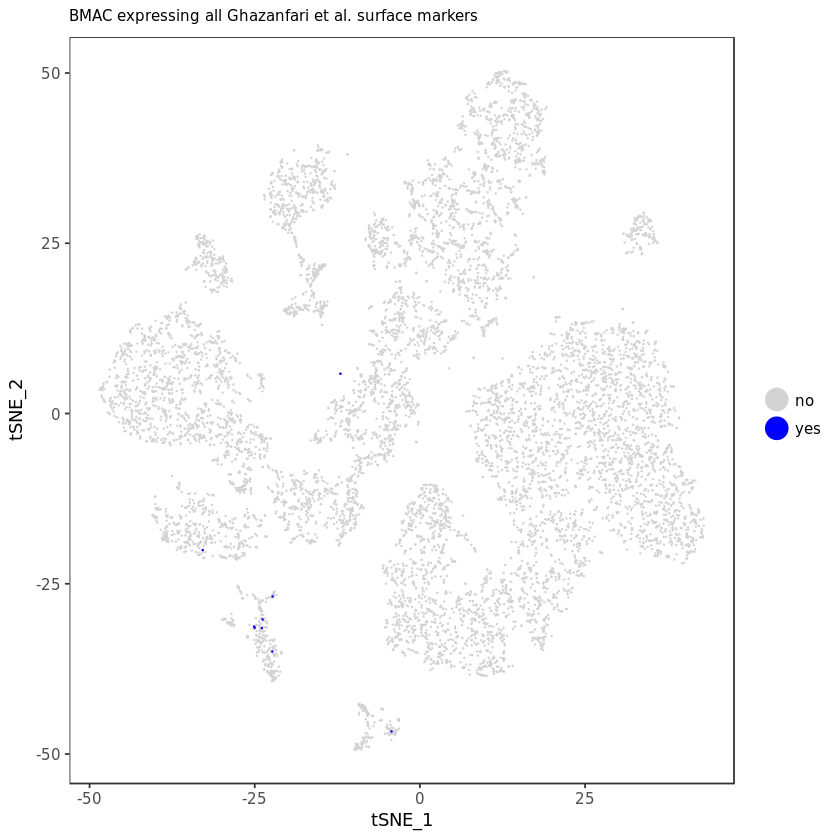

In [112]:
pjia <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Ghaz_surf_lib", pt.size = 0.05, do.return = TRUE,
        plot.order = "yes", cols.use = c("light grey", "blue")) + ggtitle("BMAC expressing all Ghazanfari et al. surface markers")
pjia <- pjia + theme(plot.title = element_text(size = 9))
#tiff(filename = "Fig3_Ghaz_surface_liberal.tiff",
#    width = 1400, height = 1200, units = "px", res = 300)
plot(pjia)
#dev.off()

In [141]:
cells@meta.data$Dom_lib <- rep("no", nrow(cells@meta.data))
cells@meta.data[dom_lib,]$Dom_lib <- rep("yes", length(dom_lib))
table(cells@meta.data$Dom_lib)
table(cells@meta.data[dom_lib,]$library_id)


  no  yes 
8948  353 


JTW03 JTW05 JTW06 JTW07 JTW08 JTW10  MG01  MG02  MG03 
   28    32    54    19    25    29   110    28    28 

In [144]:
# Check if any yes's overlap with possible MSCs
cells@meta.data[pos_mscs,]$Dom_lib
cells@meta.data[pos_mscs,]$Dom_lib[6]

[1] "no"  "no"  "no"  "no"  "no"  "yes" "no"  "no"  "no"  "no"  "no"

[1] "yes"

In [145]:
cells@meta.data[pos_mscs,]$Dom_lib <- rep("Possible MSCs", length(cells@meta.data[pos_mscs,]$Dom_lib))
cells@meta.data[pos_mscs,]$Dom_lib[6] <- "Possible MSC + yes"

In [148]:
table(cells@meta.data$Dom_lib)


                no Possible MSC + yes      Possible MSCs                yes 
              8938                  1                 10                352 

In [204]:
?DimPlot

In [208]:
pjia <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Dom_lib", pt.size = 0.05, do.return = TRUE,
        plot.order = c("yes", "no", "Possible MSCs", "Possible MSC + yes"), cols.use = c("red", "green", "light grey", "blue"), no.legend = TRUE) #+ ggtitle("BMAC expressing 67%+/100%- Dominici et al. genes")
#pjia <- pjia + theme(plot.title = element_text(size = 9))
tiff(filename = "20190207_Figures/Fig3_Dom_liberal_withPosMSCs.tiff",
    width = 1500, height = 1500, units = "px", res = 300)
plot(pjia)
dev.off()

png 
  2

In [153]:
cells@meta.data$Ghazc3c5_lib <- rep("no", nrow(cells@meta.data))
cells@meta.data[ghazc3c5_lib,]$Ghazc3c5_lib <- rep("yes", length(ghazc3c5_lib))
table(cells@meta.data$Ghazc3c5_lib)
table(cells@meta.data[ghazc3c5_lib,]$library_id)


  no  yes 
9266   35 


JTW03 JTW05 JTW06 JTW07 JTW08 JTW10  MG01  MG02 
    4    17     3     4     1     4     1     1 

In [154]:
cells@meta.data[pos_mscs,]$Ghazc3c5_lib
cells@meta.data[pos_mscs,]$Ghazc3c5_lib[c(1, 4, 5, 6, 11)]

[1] "yes" "no"  "no"  "yes" "yes" "yes" "no"  "no"  "no"  "no"  "yes"

[1] "yes" "yes" "yes" "yes" "yes"

In [155]:
cells@meta.data[pos_mscs,]$Ghazc3c5_lib <- rep("Possible MSCs", length(cells@meta.data[pos_mscs,]$Dom_lib))
cells@meta.data[pos_mscs,]$Ghazc3c5_lib[c(1, 4, 5, 6, 11)] <- "Possible MSC + yes"

In [156]:
table(cells@meta.data$Ghazc3c5_lib)


                no Possible MSC + yes      Possible MSCs                yes 
              9260                  5                  6                 30 

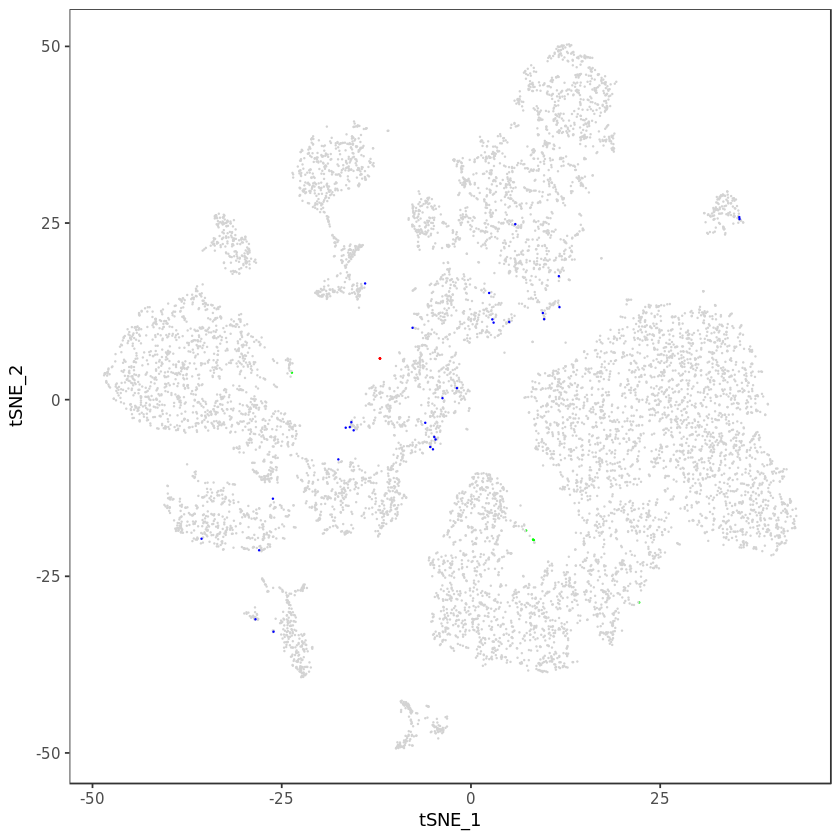

In [231]:
pjia <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Ghazc3c5_lib", pt.size = 0.05, do.return = TRUE,
                plot.order = c("yes", "no", "Possible MSCs", "Possible MSC + yes"), cols.use = c("red", "green", "light grey", "blue"), no.legend = TRUE)
        #plot.order = "yes", cols.use = c("green", "red", "light grey", "blue"))# + ggtitle("BMAC expressing 9/116 Ghazanfari et al. Cluster 3+5 genes")
#pjia <- pjia + theme(plot.title = element_text(size = 9))
#tiff(filename = "20190207_Figures/Fig3_Ghazc3c5_liberal_withPosMSCs.tiff",
#    width = 1500, height = 1500, units = "px", res = 300)
plot(pjia)
#dev.off()

In [230]:
# Ghazc3c5 116 genes liberal definition
head(cells@meta.data)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,⋯,Dominici,Ghaz_surface,Ghaz_con,pos_msc,ptsize,Jia_lib,Silva_lib,Ghaz_surf_lib,Dom_lib,Ghazc3c5_lib
AAACCTGCACCCATGG-2,1034,4919,bmac,JTW03,0.02359162,1,1,1,1,5,⋯,no,no,no,Not MSC,0.05,no,no,no,no,no
AAACCTGCAGGGTTAG-2,899,3459,bmac,JTW03,0.02862099,1,1,1,1,0,⋯,no,no,no,Not MSC,0.05,no,no,no,no,no
AAACCTGGTGCTCTTC-2,1263,4938,bmac,JTW03,0.04193679,2,2,2,2,7,⋯,no,no,no,Not MSC,0.05,no,no,no,no,no
AAACCTGGTGGCTCCA-2,1255,3066,bmac,JTW03,0.05058747,11,11,11,11,15,⋯,no,no,no,Not MSC,0.05,no,no,no,no,no
AAACCTGTCACCGGGT-2,1316,4441,bmac,JTW03,0.02974313,2,2,2,2,7,⋯,no,no,no,Not MSC,0.05,no,no,no,no,no
AAACGGGTCAGCACAT-2,927,3956,bmac,JTW03,0.03413401,1,1,1,1,0,⋯,no,no,no,Not MSC,0.05,no,no,no,no,no


In [ ]:
cells@meta.data$Silva_lib <- rep("no", nrow(cells@meta.data))
cells@meta.data[silva_lib,]$Silva_lib <- rep("yes", length(silva_lib))
table(cells@meta.data$Silva_lib)
table(cells@meta.data[silva_lib,]$library_id)

In [ ]:
pjia <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Silva_lib", pt.size = 0.05, do.return = TRUE,
        plot.order = c("yes", "no", "Possible MSCs", "Possible MSC + yes"), cols.use = c("red", "green", "light grey", "blue"), no.legend = TRUE) #+ ggtitle("BMAC expressing at least ~42% (8/19) of Silva et al. genes")
#pjia <- pjia + theme(plot.title = element_text(size = 9))
tiff(filename = "20190207_Figures/Fig3_Silva42_liberal_withPosMSCs.tiff",
    width = 1500, height = 1500, units = "px", res = 300)
plot(pjia)
dev.off()

# Find overlaps in liberal defintions of MSCs
* 72% of Jia genes - 25 cells
* 42% of Silva genes - 19 cells
* All Ghazanfari surface markers (1 positive, 4 negative) - 9 cells
* 50% Dominici positive, 100% negative markers - 353 cells
    * 75% Dominici positive, 100% negative - 1 cell
* Expressing 9/116 Ghazanfari et al. c3c5 genes - 35 cells
* Cells that clustered with cultured MSCs - 11 cells

In [46]:
head(cells@meta.data)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,⋯,Silva,Dominici,Ghaz_surface,Ghaz_con,Jia72,Jia_lib,Silva_lib,Ghaz_surf_lib,Dom_lib,Ghazc3c5_lib
AAACCTGCACCCATGG-2,1034,4919,bmac,JTW03,0.02359162,1,1,1,1,5,⋯,no,no,no,no,no,no,no,no,no,no
AAACCTGCAGGGTTAG-2,899,3459,bmac,JTW03,0.02862099,1,1,1,1,0,⋯,no,no,no,no,no,no,no,no,no,no
AAACCTGGTGCTCTTC-2,1263,4938,bmac,JTW03,0.04193679,2,2,2,2,7,⋯,no,no,no,no,no,no,no,no,no,no
AAACCTGGTGGCTCCA-2,1255,3066,bmac,JTW03,0.05058747,11,11,11,11,15,⋯,no,no,no,no,no,no,no,no,no,no
AAACCTGTCACCGGGT-2,1316,4441,bmac,JTW03,0.02974313,2,2,2,2,7,⋯,no,no,no,no,no,no,no,no,no,no
AAACGGGTCAGCACAT-2,927,3956,bmac,JTW03,0.03413401,1,1,1,1,0,⋯,no,no,no,no,no,no,no,no,no,no


In [270]:
# Jia
jia_lib <- which(jia_all.exp_zeros <= 5)
length(jia_lib)

[1] 25

In [271]:
# Silva
silva_lib <- which(silva_all.exp_zeros <= 11)
length(silva_lib)

[1] 19

In [272]:
# Ghaz surface markers
ghaz_lib <- intersect(ghaz_surface_pos.expgenes, ghaz_surface_neg.expgenes)
length(ghaz_lib)

[1] 9

In [273]:
row.names(cells@meta.data[ghaz_lib,])

[1] "CGAGCCAGTAATCGTC-3" "GTGGGTCAGACGACGT-3" "CCTACCATCTCAAACG-4"
[4] "CGAGCCAAGTGGGCTA-4" "CTCTGGTAGCTAGTTC-4" "GTGAAGGCATCACCCT-4"
[7] "AGTGTCAGTAGAAGGA-7" "CGTTGGGTCAAAGACA-7" "TCACGAATCTTGAGAC-7"

In [274]:
# Dominici
dominici_pos.expgenes <- which(dominici_pos.exp_zeros <= 1)
dominici_neg.expgenes <- which(dominici_neg.exp_zeros == length(dominici_neg)) # All must be not expressed (2134 cells) 
dom_lib <- intersect(dominici_pos.expgenes, dominici_neg.expgenes)
length(dom_lib)

[1] 353

In [275]:
# Ghazanfari c3c5
#ghazc3c5_lib <- which(ghaz_c3c5_all.exp_zeros <= 107)
#length(ghazc3c5_lib)
# 2/15/19 update
ghazc3c5_lib <- which(ghaz_c3c5_all.exp_zeros <= 106)
length(ghazc3c5_lib)

[1] 17

In [183]:
# Clustered with cultured MSCs from "20180911_Ruoss_BMAC_MSC_noJTW_02.ipynb"
# subtract 1 from each index since JTW01 was removed
clust_with_MSCs <- c('AGGGTGAAGCACCGCT-2', 'TTTACTGGTAATCACC-2', 'ACGCCGACAGGTGCCT-3', 'GTCAAGTTCAGCTGGC-3',
                     'GTGGGTCAGACGACGT-3', 'CCGGTAGGTTAAGTAG-4', 'GACTGCGTCTACCAGA-4', 'AAATGCCCACCTGGTG-5',
                     'CACAGGCTCAGAGCTT-7', 'CGACTTCGTGCTAGCC-7', 'CGACCTTGTCTAGTGT-9')

In [185]:
write.table(cells@meta.data[clust_with_MSCs,], file = "PossibleMSCsTable.txt", quote = FALSE, sep = "\t")

In [268]:
library(limma)

In [269]:
# Create a matrix of 0's with cells (9301) x definitions (5)
# Change 0 to 1 where a cell satisfies a definition
# use vennDiagram on matrix
venn <- matrix(0, nrow = 9301, ncol = 6)
colnames(venn) <- c("Jia", "Silva", "Ghazanfari_Surface", "Dominici", "Ghazanfari_c3c5", "Clustered with MSCs")
rownames(venn) <- rownames(cells@meta.data)
head(venn)
#2/15/19

,Jia,Silva,Ghazanfari_Surface,Dominici,Ghazanfari_c3c5,Clustered with MSCs
AAACCTGCACCCATGG-2,0,0,0,0,0,0
AAACCTGCAGGGTTAG-2,0,0,0,0,0,0
AAACCTGGTGCTCTTC-2,0,0,0,0,0,0
AAACCTGGTGGCTCCA-2,0,0,0,0,0,0
AAACCTGTCACCGGGT-2,0,0,0,0,0,0
AAACGGGTCAGCACAT-2,0,0,0,0,0,0


In [276]:
venn[jia_lib, 1] <- rep(1, length(jia_lib))

In [277]:
venn[silva_lib, 2] <- rep(1, length(silva_lib))

In [278]:
venn[ghaz_lib, 3] <- rep(1, length(ghaz_lib))

In [279]:
venn[dom_lib, 4] <-rep(1, length(dom_lib))

In [280]:
venn[ghazc3c5_lib, 5] <- rep(1, length(ghazc3c5_lib))

In [281]:
venn[clust_with_MSCs, 6] <- rep(1, length(clust_with_MSCs))

In [283]:
?vennDiagram

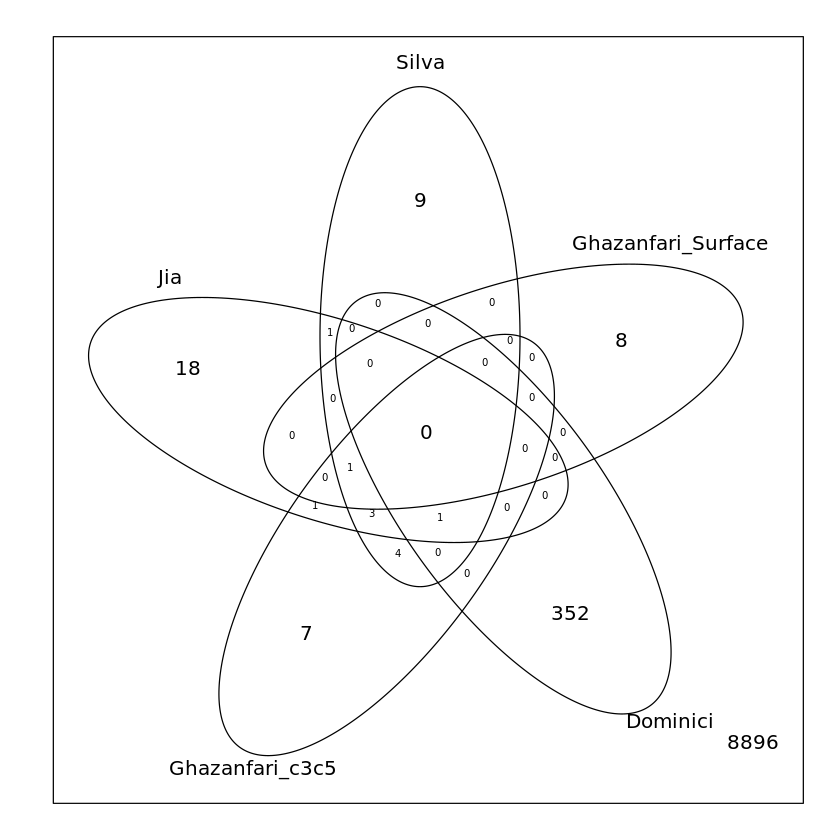

In [287]:
vennDiagram(venn[,1:5], cex = c(1, 1, 0.5))

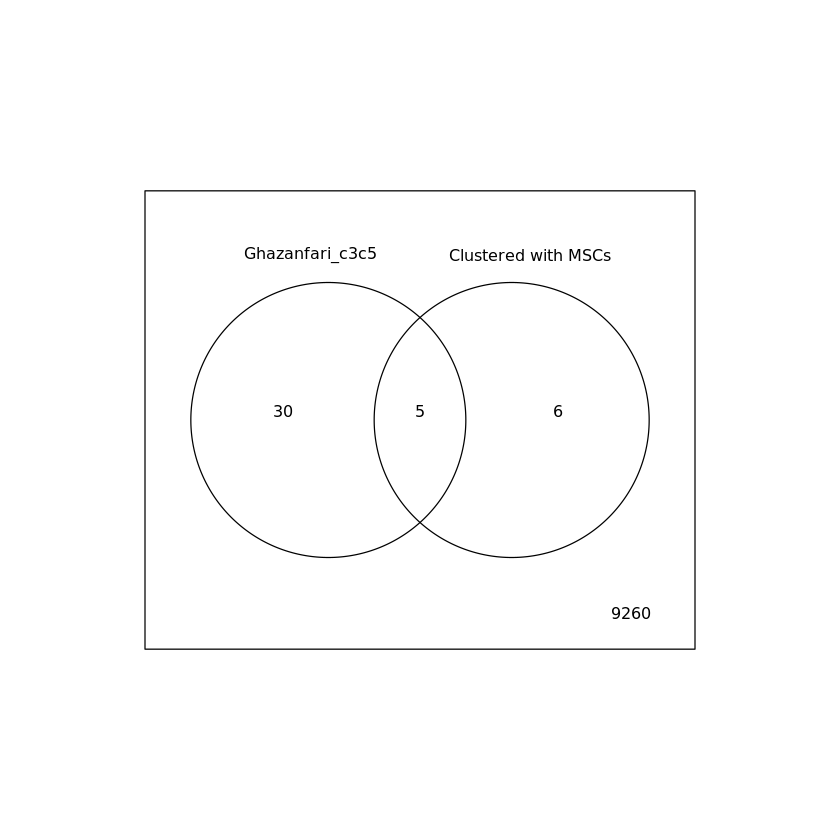

In [66]:
vennDiagram(venn[,5:6], cex = 0.8)

# Cluster cells that meet liberal definitions of MSCs

In [48]:
head(cells@meta.data)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,⋯,Silva,Dominici,Ghaz_surface,Ghaz_con,Jia72,Jia_lib,Silva_lib,Ghaz_surf_lib,Dom_lib,Ghazc3c5_lib
AAACCTGCACCCATGG-2,1034,4919,bmac,JTW03,0.02359162,1,1,1,1,5,⋯,no,no,no,no,no,no,no,no,no,no
AAACCTGCAGGGTTAG-2,899,3459,bmac,JTW03,0.02862099,1,1,1,1,0,⋯,no,no,no,no,no,no,no,no,no,no
AAACCTGGTGCTCTTC-2,1263,4938,bmac,JTW03,0.04193679,2,2,2,2,7,⋯,no,no,no,no,no,no,no,no,no,no
AAACCTGGTGGCTCCA-2,1255,3066,bmac,JTW03,0.05058747,11,11,11,11,15,⋯,no,no,no,no,no,no,no,no,no,no
AAACCTGTCACCGGGT-2,1316,4441,bmac,JTW03,0.02974313,2,2,2,2,7,⋯,no,no,no,no,no,no,no,no,no,no
AAACGGGTCAGCACAT-2,927,3956,bmac,JTW03,0.03413401,1,1,1,1,0,⋯,no,no,no,no,no,no,no,no,no,no


In [49]:
lib_mscs <- which(cells@meta.data$Jia_lib == "yes" | 
                  cells@meta.data$Silva_lib == "yes" | 
                  cells@meta.data$Ghaz_surf_lib == "yes" | 
                  cells@meta.data$Dom_lib == "yes" | 
                  cells@meta.data$Ghazc3c5_lib == "yes")
length(lib_mscs) # should be 421

[1] 421

In [51]:
# Cell names
lib_mscs.names <- row.names(cells@meta.data)[lib_mscs]
head(lib_mscs.names)

[1] "AACCATGAGTGAAGTT-2" "AATCGGTCAGTCGTGC-2" "ACACCCTTCGCAAACT-2"
[4] "AGGGTGAAGCACCGCT-2" "AGGGTGAAGGATATAC-2" "AGGGTGACATCGGGTC-2"

In [146]:
#Create new cells seurat object from top sections
lib_mscs.cells <- FilterCells(cells, 
                              subset.names = c("nGene", "percent.mito"), 
                              low.thresholds = c(750, -Inf), 
                              high.thresholds = c(Inf, 0.15), 
                              cells.use = lib_mscs.names)

In [147]:
lib_mscs.cells <- NormalizeData(lib_mscs.cells, normalization.method = "LogNormalize")


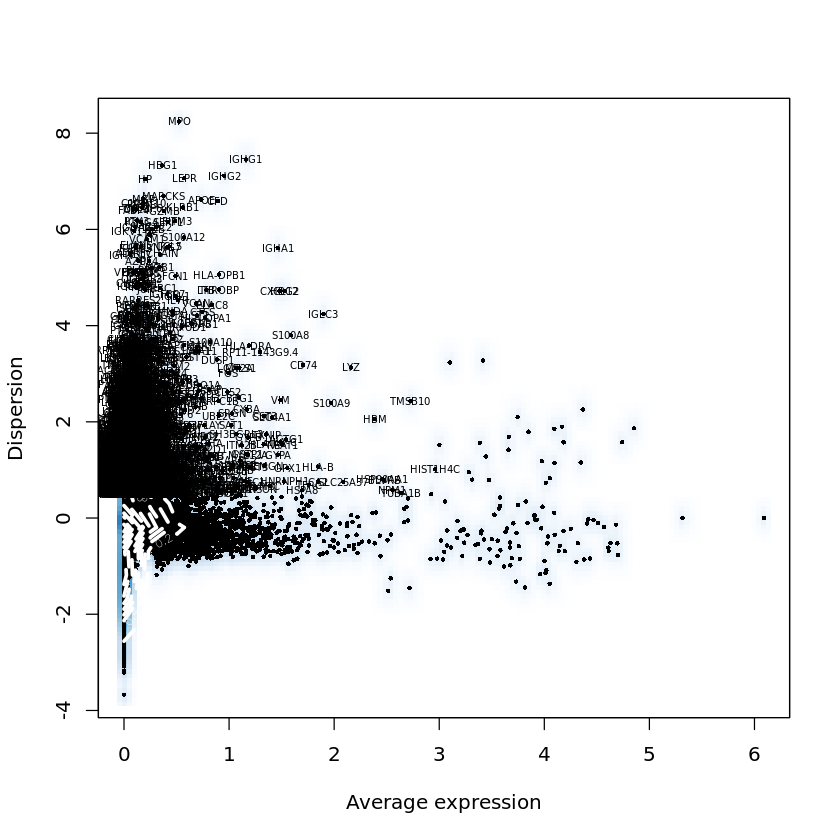

In [148]:
lib_mscs.cells <- FindVariableGenes(object = lib_mscs.cells, mean.function = ExpMean, dispersion.function = LogVMR, 
                                    x.low.cutoff = 0.0125, x.high.cutoff = 3, y.cutoff = 0.5)

In [149]:
length(lib_mscs.cells@var.genes)

[1] 2837

In [150]:
lib_mscs.cells <- ScaleData(object = lib_mscs.cells, vars.to.regress = c("nUMI", "percent.mito"), 
                            do.par = TRUE, num.cores = 3)

Regressing out: nUMI, percent.mito



Time Elapsed:  13.9888777732849 secs

Scaling data matrix


In [151]:
lib_mscs.cells <- RunPCA(object = lib_mscs.cells, 
                         pc.genes = lib_mscs.cells@var.genes, 
                         do.print = TRUE, 
                         pcs.print = 1:5,
                         genes.print = 5)

[1] "PC1"
[1] "VIM"     "LGALS1"  "CYBA"    "HLA-DRA" "S100A11"
[1] ""
[1] "TFRC"     "BLVRB"    "CA2"      "GYPA"     "SLC25A37"
[1] ""
[1] ""
[1] "PC2"
[1] "CXCL12" "FRZB"   "ESM1"   "TF"     "PTGDS" 
[1] ""
[1] "CORO1A"  "CD52"    "ARHGDIB" "CXCR4"   "S100A9" 
[1] ""
[1] ""
[1] "PC3"
[1] "CD3D" "CD3E" "CD7"  "TRAC" "IL32"
[1] ""
[1] "S100A12" "BLVRB"   "CSTA"    "FCN1"    "MNDA"   
[1] ""
[1] ""
[1] "PC4"
[1] "GIMAP4" "CD3E"   "CD3D"   "CD48"   "LTB"   
[1] ""
[1] "BLNK"   "SCN9A"  "JCHAIN" "IRF7"   "IRF8"  
[1] ""
[1] ""
[1] "PC5"
[1] "NOTCH3" "RRAS"   "DAAM2"  "GGT5"   "IGFBP3"
[1] ""
[1] "NDST1" "CMTM5" "EMP1"  "ITGA5" "EHD4" 
[1] ""
[1] ""


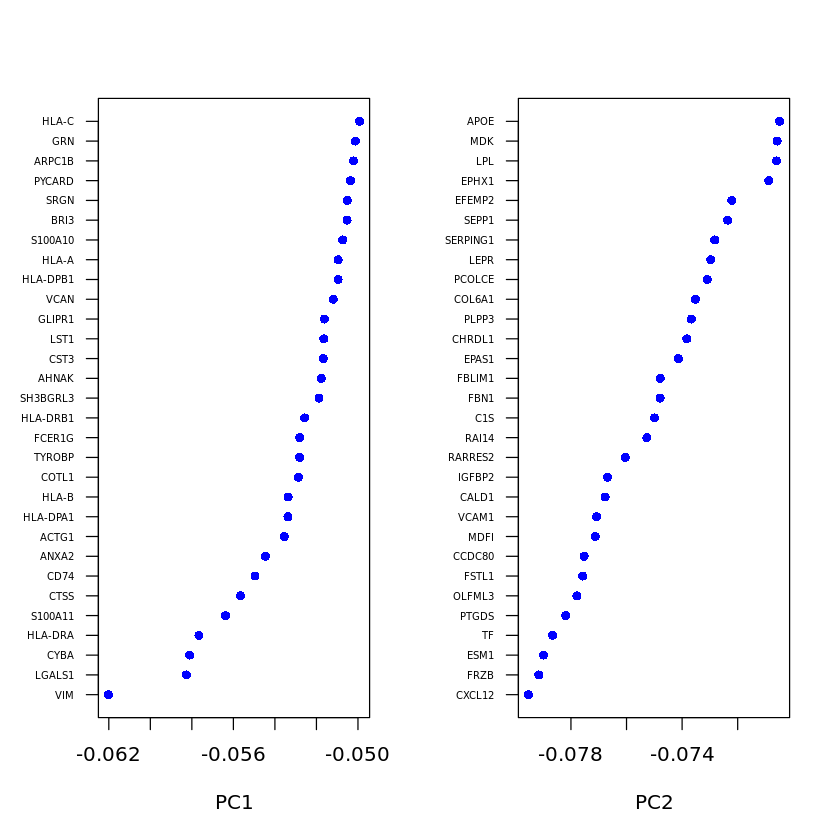

In [152]:
VizPCA(object = lib_mscs.cells, pcs.use = 1:2)

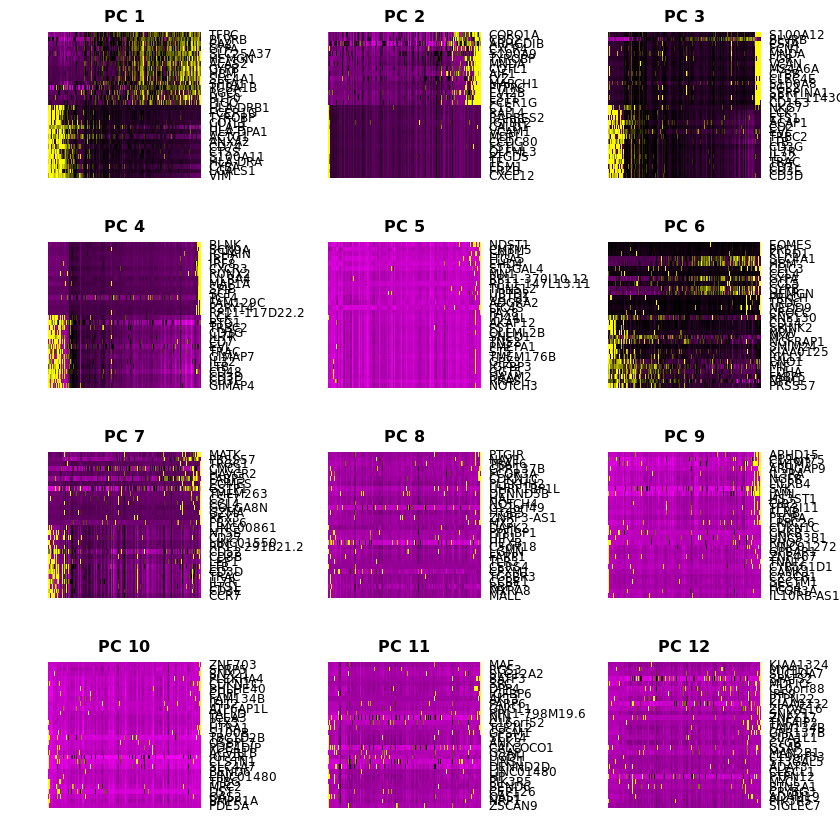

In [153]:
PCHeatmap(object = lib_mscs.cells, 
          pc.use = 1:12, 
          cells.use = 500, 
          do.balanced = TRUE, 
          label.columns = FALSE, 
          use.full = FALSE)

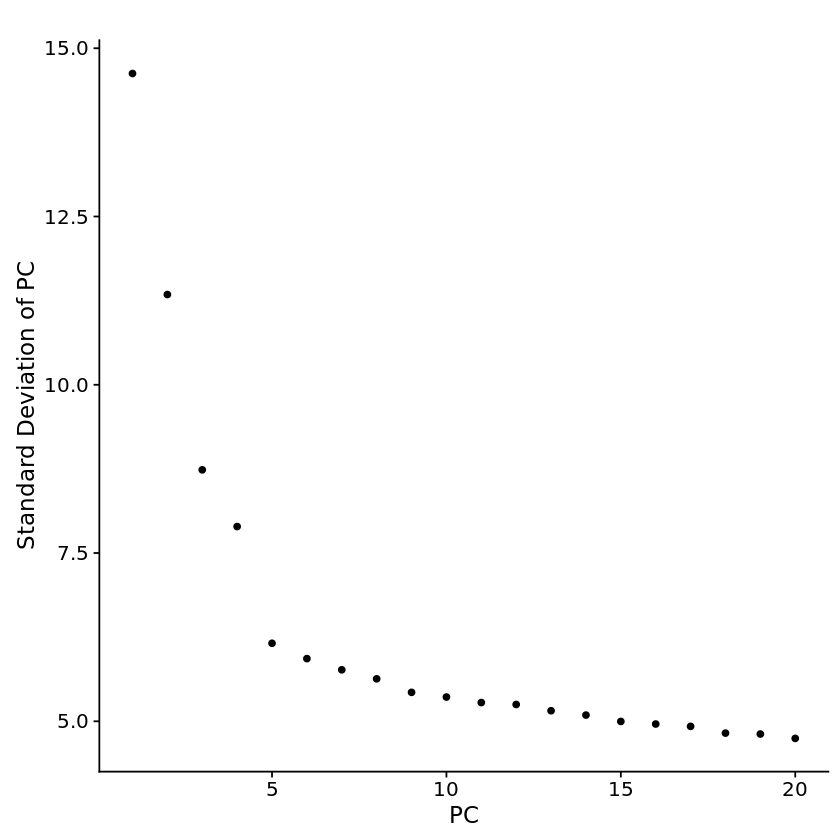

In [154]:
PCElbowPlot(object = lib_mscs.cells)

In [155]:
# Set seed for reproducibility
seed <- 7

lib_mscs.cells <- FindClusters(object = lib_mscs.cells, 
                      reduction.type = "pca", 
                      dims.use = 1:16, 
                      resolution = c(0.5, 0.6, 0.8, 1.0, 1.5),
                      #resolution = 0.6, 
                      print.output = 0, 
                      save.SNN = TRUE,
                      random.seed = seed)

In [156]:
head(lib_mscs.cells@meta.data)
sapply(grep("^res",colnames(lib_mscs.cells@meta.data),value = TRUE),
       function(x) length(unique(lib_mscs.cells@meta.data[,x])))

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5
AACCATGAGTGAAGTT-2,3539,29494,bmac,JTW03,0.03370748,0,0,0,4,4
AATCGGTCAGTCGTGC-2,3619,30590,bmac,JTW03,0.03465638,0,0,0,4,4
ACACCCTTCGCAAACT-2,4460,31953,bmac,JTW03,0.04320195,1,1,1,0,0
AGGGTGAAGCACCGCT-2,2527,8559,bmac,JTW03,0.04142371,1,1,3,2,2
AGGGTGAAGGATATAC-2,982,4349,bmac,JTW03,0.06300299,4,4,4,6,6
AGGGTGACATCGGGTC-2,4674,35602,bmac,JTW03,0.04748125,1,1,1,0,0


res.0.5 res.0.6 res.0.8   res.1 res.1.5 
      5       5       5       7       7

In [157]:
# Compute tSNE dimensional reduction
lib_mscs.cells <- RunTSNE(lib_mscs.cells, reduction.use = "pca", dims.use = 1:15)

In [158]:
# Create plots for each resolution
p0.5 <- TSNEPlot(lib_mscs.cells, do.label = T, do.return = T, pt.size = 0.5, group.by = "res.0.5")
p0.6 <- TSNEPlot(lib_mscs.cells, do.label = T, do.return = T, pt.size = 0.5, group.by = "res.0.6")
p0.8 <- TSNEPlot(lib_mscs.cells, do.label = T, do.return = T, pt.size = 0.5, group.by = "res.0.8")
p1.0 <- TSNEPlot(lib_mscs.cells, do.label = T, do.return = T, pt.size = 0.5, group.by = "res.1")
p1.5 <- TSNEPlot(lib_mscs.cells, do.label = T, do.return = T, pt.size = 0.5, group.by = "res.1.5")

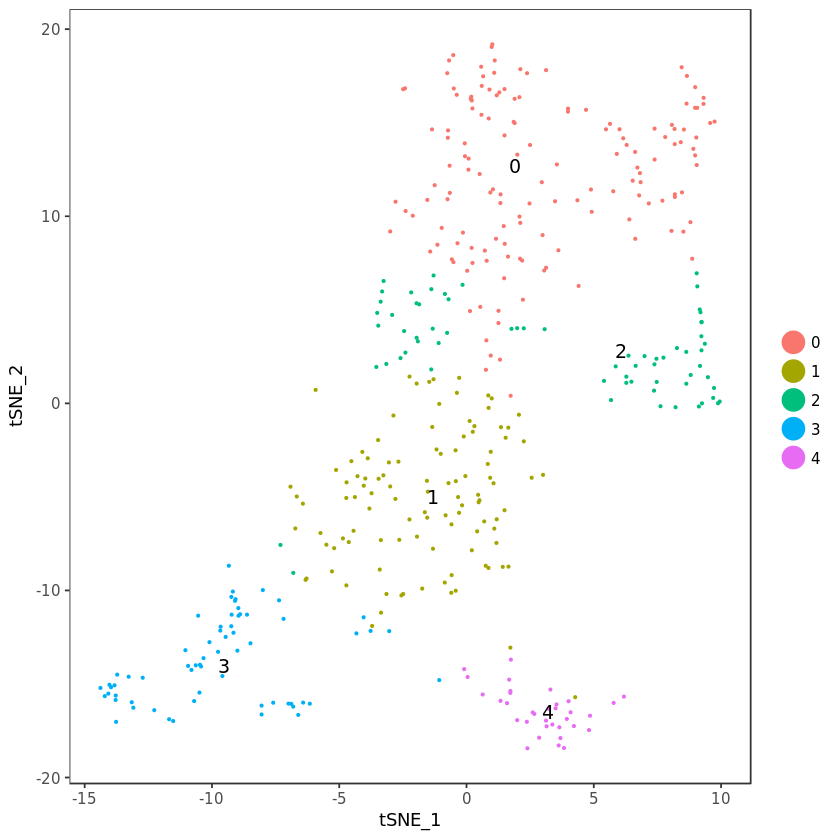

In [159]:
plot(p0.5)

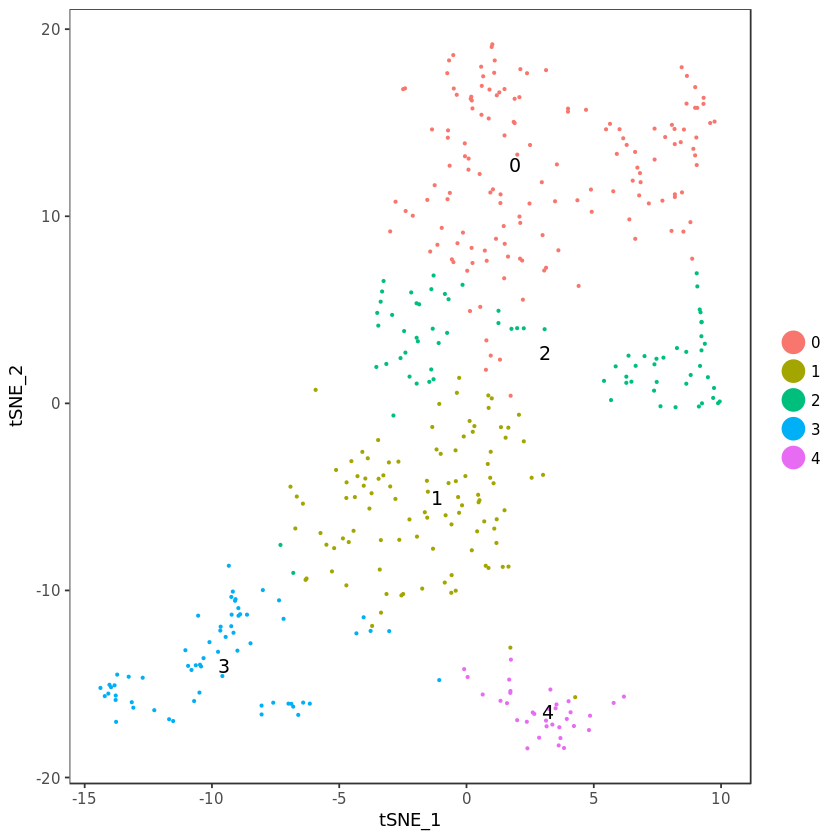

In [160]:
plot(p0.6)

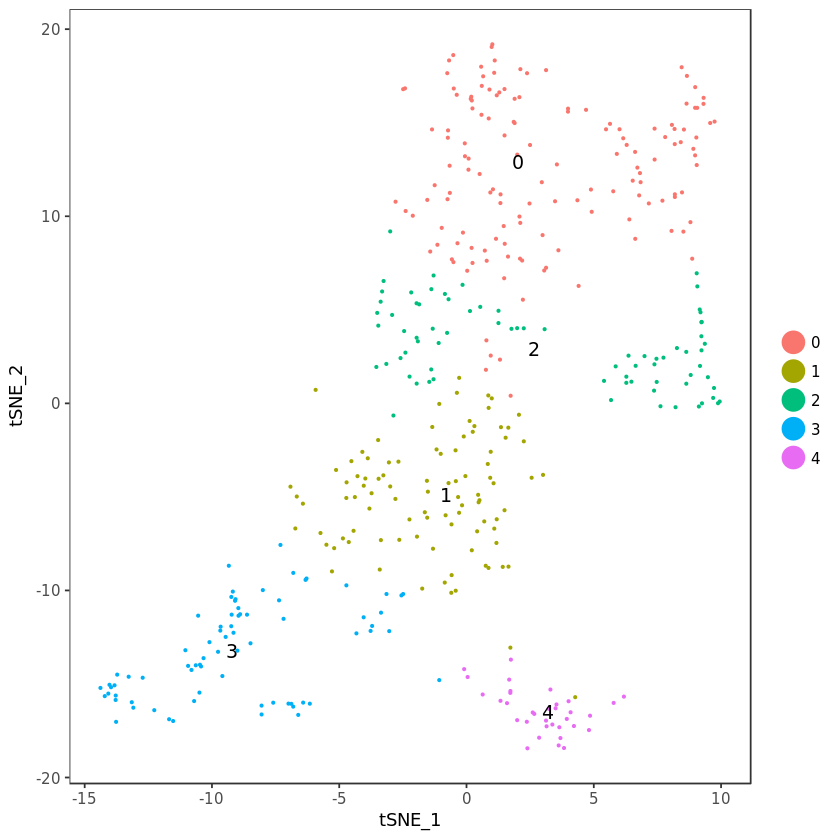

In [161]:
plot(p0.8)

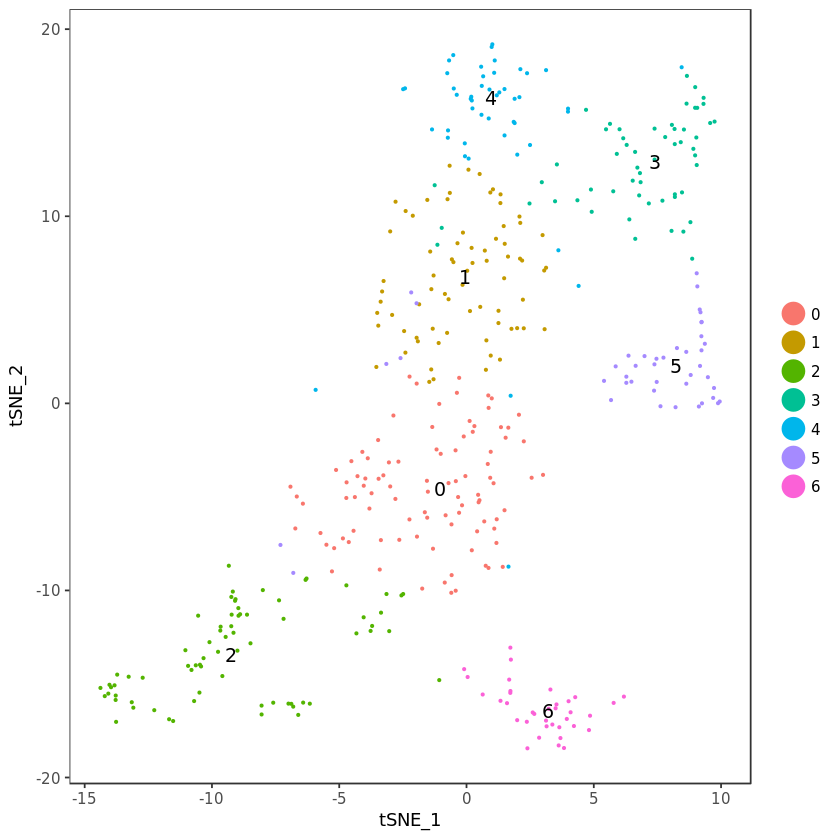

In [162]:
plot(p1.0)

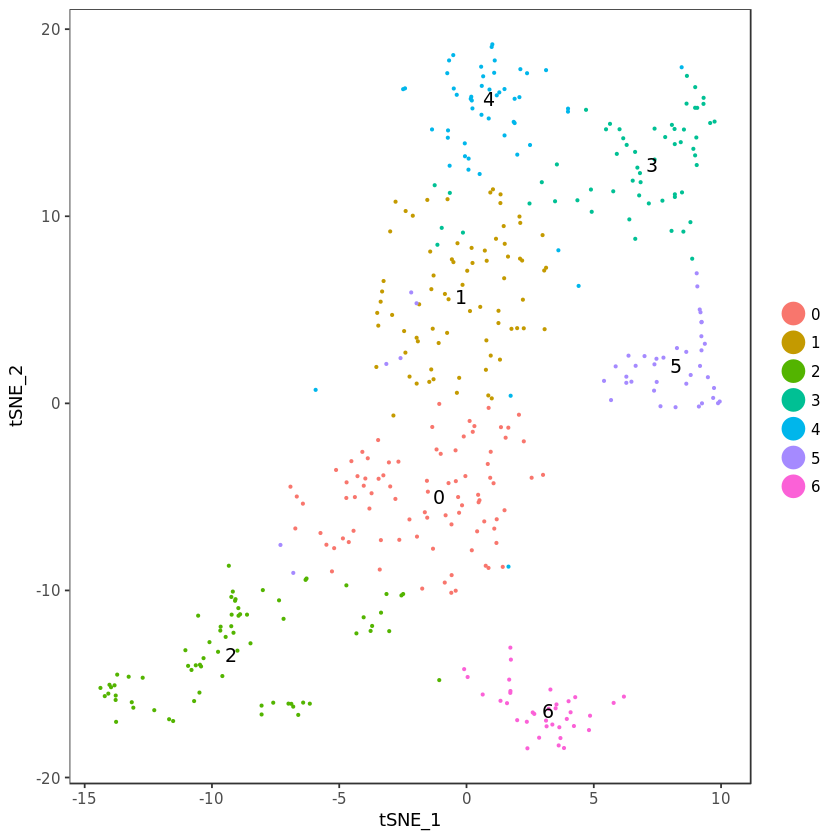

In [163]:
plot(p1.5)

In [164]:
lib_mscs.cells <- SetAllIdent(lib_mscs.cells, id = "res.0.5")

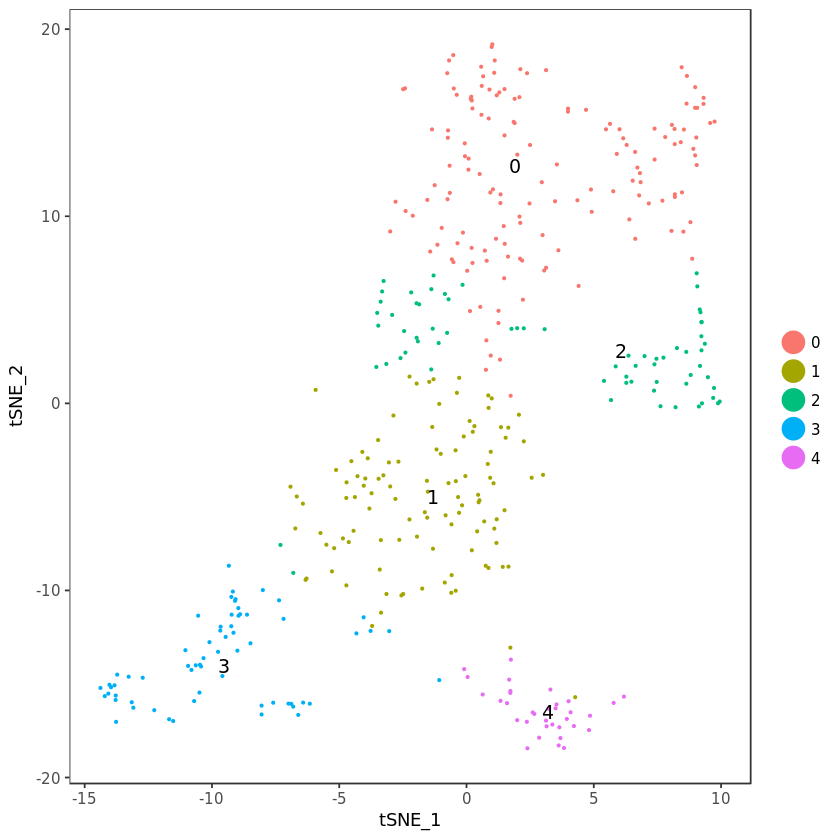

In [165]:
TSNEPlot(lib_mscs.cells, do.label = T, do.return = T, pt.size = 0.5)

In [174]:
save(lib_mscs.cells, file = "lib_def_mscs.Rdata")
#load(file = "lib_def_mscs.Rdata")

In [219]:
# Create lib_mscs.cells@meta.data$definition - label with "jia_lib", "silva_lib", etc.
lib_mscs.cells@meta.data$def <- rep("x", nrow(lib_mscs.cells@meta.data))

In [220]:
head(lib_mscs.cells@meta.data)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,def
AACCATGAGTGAAGTT-2,3539,29494,bmac,JTW03,0.03370748,0,0,0,4,4,x
AATCGGTCAGTCGTGC-2,3619,30590,bmac,JTW03,0.03465638,0,0,0,4,4,x
ACACCCTTCGCAAACT-2,4460,31953,bmac,JTW03,0.04320195,1,1,1,0,0,x
AGGGTGAAGCACCGCT-2,2527,8559,bmac,JTW03,0.04142371,1,1,3,2,2,x
AGGGTGAAGGATATAC-2,982,4349,bmac,JTW03,0.06300299,4,4,4,6,6,x
AGGGTGACATCGGGTC-2,4674,35602,bmac,JTW03,0.04748125,1,1,1,0,0,x


In [223]:
lib_mscs.cells@meta.data$def[which(rownames(lib_mscs.cells@meta.data) %in% names(jia_lib))] <- rep("Jia_lib", length(jia_lib))
lib_mscs.cells@meta.data$def[which(rownames(lib_mscs.cells@meta.data) %in% names(silva_lib))] <- rep("Silva_lib", length(silva_lib))
lib_mscs.cells@meta.data$def[which(rownames(lib_mscs.cells@meta.data) %in% names(ghazc3c5_lib))] <- rep("Ghazc3c5_lib", length(ghazc3c5_lib))
lib_mscs.cells@meta.data$def[which(rownames(lib_mscs.cells@meta.data) %in% rownames(cells@meta.data[ghaz_lib,]))] <- rep("Ghazsurf_lib", length(ghaz_lib))
lib_mscs.cells@meta.data$def[which(rownames(lib_mscs.cells@meta.data) %in% rownames(cells@meta.data[dom_lib,]))] <- rep("Dom_lib", length(dom_lib))
#which(names(jia_lib))

In [224]:
table(lib_mscs.cells@meta.data$def)


     Dom_lib Ghazc3c5_lib Ghazsurf_lib      Jia_lib    Silva_lib 
         353           32            9           17           10 

In [217]:
# Multiple criteria
jia_silva <- which(rownames(lib_mscs.cells@meta.data) %in% names(jia_lib) & 
      rownames(lib_mscs.cells@meta.data) %in% names(silva_lib) &
      !(rownames(lib_mscs.cells@meta.data) %in% names(ghazc3c5_lib)) & 
      !(rownames(lib_mscs.cells@meta.data) %in% rownames(cells@meta.data[ghaz_lib,])) &
      !(rownames(lib_mscs.cells@meta.data) %in% rownames(cells@meta.data[dom_lib,])))

ghazsurf_silva_ghazc3c5 <- which(rownames(lib_mscs.cells@meta.data) %in% rownames(cells@meta.data[ghaz_lib,]) & 
      rownames(lib_mscs.cells@meta.data) %in% names(silva_lib) & 
      rownames(lib_mscs.cells@meta.data) %in% names(ghazc3c5_lib))# &
      #!(rownames(lib_mscs.cells@meta.data) %in% names(jia_lib)) & 
      #!(rownames(lib_mscs.cells@meta.data) %in% rownames(cells@meta.data[dom_lib,])))

ghazc3c5_jia <- which(rownames(lib_mscs.cells@meta.data) %in% names(ghazc3c5_lib) & 
      rownames(lib_mscs.cells@meta.data) %in% names(jia_lib) & 
      !(rownames(lib_mscs.cells@meta.data) %in% names(silva_lib)) &  
      !(rownames(lib_mscs.cells@meta.data) %in% rownames(cells@meta.data[dom_lib,])) & 
      !(rownames(lib_mscs.cells@meta.data) %in% rownames(cells@meta.data[ghaz_lib,])))

ghazc3c5_jia_silva <- which(rownames(lib_mscs.cells@meta.data) %in% names(ghazc3c5_lib) & 
      rownames(lib_mscs.cells@meta.data) %in% names(jia_lib) & 
      rownames(lib_mscs.cells@meta.data) %in% names(silva_lib) &  
      !(rownames(lib_mscs.cells@meta.data) %in% rownames(cells@meta.data[dom_lib,])) & 
      !(rownames(lib_mscs.cells@meta.data) %in% rownames(cells@meta.data[ghaz_lib,])))

ghazc3c5_silva <- which(rownames(lib_mscs.cells@meta.data) %in% names(ghazc3c5_lib) &  
      rownames(lib_mscs.cells@meta.data) %in% names(silva_lib) & 
      !(rownames(lib_mscs.cells@meta.data) %in% names(jia_lib)) & 
      !(rownames(lib_mscs.cells@meta.data) %in% rownames(cells@meta.data[dom_lib,])) & 
      !(rownames(lib_mscs.cells@meta.data) %in% rownames(cells@meta.data[ghaz_lib,])))

ghazc3c5_silva_jia_dom <- which(rownames(lib_mscs.cells@meta.data) %in% names(ghazc3c5_lib) & 
      rownames(lib_mscs.cells@meta.data) %in% names(jia_lib) & 
      rownames(lib_mscs.cells@meta.data) %in% names(silva_lib) & 
      rownames(lib_mscs.cells@meta.data) %in% rownames(cells@meta.data[dom_lib,]))

ghazc3c5_dom <- which(rownames(lib_mscs.cells@meta.data) %in% names(ghazc3c5_lib) & 
      rownames(lib_mscs.cells@meta.data) %in% rownames(cells@meta.data[dom_lib,]) &
      !(rownames(lib_mscs.cells@meta.data) %in% names(jia_lib)) &
      !(rownames(lib_mscs.cells@meta.data) %in% names(silva_lib)) &
      !(rownames(lib_mscs.cells@meta.data) %in% rownames(cells@meta.data[ghaz_lib,])))

In [225]:
lib_mscs.cells@meta.data$def[jia_silva] <- rep("Jia_Silva", length(jia_silva))
lib_mscs.cells@meta.data$def[ghazsurf_silva_ghazc3c5] <- rep("GhazSurf_Silva_Ghazc3c5", length(ghazsurf_silva_ghazc3c5))
lib_mscs.cells@meta.data$def[ghazc3c5_jia] <- rep("Ghazc3c5_Jia", length(ghazc3c5_jia))
lib_mscs.cells@meta.data$def[ghazc3c5_jia_silva] <- rep("Ghazc3c5_Jia_Silva", length(ghazc3c5_jia_silva))
lib_mscs.cells@meta.data$def[ghazc3c5_silva] <- rep("Ghazc3c5_Silva", length(ghazc3c5_silva))
lib_mscs.cells@meta.data$def[ghazc3c5_silva_jia_dom] <- rep("Ghazc3c5_Silva_Jia_Dom", length(ghazc3c5_silva_jia_dom))
lib_mscs.cells@meta.data$def[ghazc3c5_dom] <- rep("Ghazc3c5_Dom", length(ghazc3c5_dom))

In [226]:
table(lib_mscs.cells@meta.data$def)


                Dom_lib            Ghazc3c5_Dom            Ghazc3c5_Jia 
                    351                       1                       2 
     Ghazc3c5_Jia_Silva            Ghazc3c5_lib          Ghazc3c5_Silva 
                      3                      23                       4 
 Ghazc3c5_Silva_Jia_Dom            Ghazsurf_lib GhazSurf_Silva_Ghazc3c5 
                      1                       8                       1 
                Jia_lib               Jia_Silva               Silva_lib 
                     17                       1                       9 

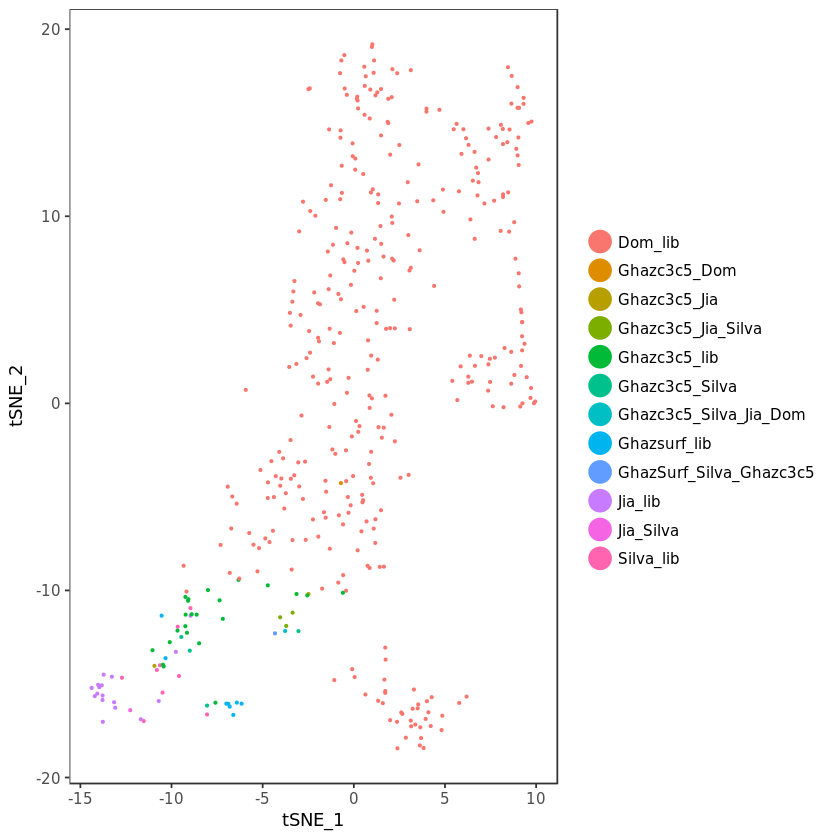

In [228]:
DimPlot(object = lib_mscs.cells, reduction.use = "tsne", group.by = "def", do.return = T, pt.size = 0.5)

In [227]:
?TSNEPlot

In [159]:
sessionInfo()

R version 3.4.1 (2017-06-30)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: Amazon Linux AMI 2017.03

Matrix products: default
BLAS: /home/ec2-user/anaconda3/envs/R_env/lib/R/lib/libRblas.so
LAPACK: /home/ec2-user/anaconda3/envs/R_env/lib/R/lib/libRlapack.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] bindrcpp_0.2  dplyr_0.7.3   magrittr_1.5  Seurat_2.3.4  Matrix_1.2-14
[6] cowplot_0.9.1 ggplot2_2.2.1

loaded via a namespace (and not attached):
  [1] Rtsne_0.13          colorspace_1.3-2    class_7.3-14       
  [4] modeltools_0.2-21   ggri